# Reinforcement Q-learning simple NN as function approximation

- Portfolio grid of size 10 (0 to 1)
- 1 hidden neural layers 
- Training

In [2]:
# Initialization
import numpy as np
import pandas as pd
import random
import tensorflow as tf
import matplotlib.pyplot as plt
%matplotlib inline

In [6]:
data = pd.read_csv('data.csv') #Three stocks (R,X_s,X_b,s_nom,s_pe,s_spr) 

In [3]:
data = pd.read_excel('sim_data_CER.xlsx') #Three stocks (R,X_s,X_b) Without predictors

# Initialization of the Tensorflow placeholders and the network

In [4]:
num_lags = 3
num_stocks=3
num_inputvar = (num_lags+1)*num_stocks
num_actions=10
hidden1 = 60
hidden2 = 45
hidden3 = 20

#Initialize Neural Network and set-up the placeholders
tf.reset_default_graph()
NN_input = tf.placeholder(shape=[1,num_inputvar],dtype=tf.float32)
# w1 = tf.Variable(tf.random_uniform([num_inputvar,hidden1],0,1))
# w2 = tf.Variable(tf.random_uniform([hidden1,hidden2],0,1))
# w3 = tf.Variable(tf.random_uniform([hidden2,hidden3],0,1))
# w4 = tf.Variable(tf.random_uniform([hidden3,num_actions],0,1))
# b1 = tf.Variable(np.zeros((1,hidden1)), dtype=tf.float32)
# b2 = tf.Variable(np.zeros((1,hidden2)), dtype=tf.float32)
# b3 = tf.Variable(np.zeros((1,hidden3)), dtype=tf.float32)
# b4 = tf.Variable(np.zeros((1,num_actions)), dtype=tf.float32)

w1 = tf.Variable(tf.random_uniform([num_inputvar,num_actions],0,0.01))

# h1 = tf.add(tf.matmul(NN_input,w1),b1)
# # h_drop1 = tf.nn.dropout(h1,0.5)
# a1 = tf.nn.softmax(h1)

# h2 = tf.add(tf.matmul(a1,w2),b2)
# # h_drop2 = tf.nn.dropout(h2,0.3)
# a2 = tf.nn.softmax(h2)

# h3 = tf.add(tf.matmul(a2,w3),b3)
# # h_drop3 = tf.nn.dropout(h3,0.1)
# a3 = tf.nn.softmax(h3)

# ol = tf.add(tf.matmul(a3,w4),b4)
# output = tf.nn.softmax(ol)

output = tf.matmul(NN_input,w1)
A_Max = tf.argmax(output,1)

Q_Next = tf.placeholder(shape=[1,num_actions],dtype=tf.float32)
loss = tf.reduce_sum(tf.square(Q_Next - output))
learning_rate = tf.placeholder(tf.float32, shape=[])
trainer = tf.train.GradientDescentOptimizer(learning_rate=learning_rate)
optmzr = trainer.minimize(loss)


# A_Max = tf.argmax(output,1)
# Calculate loss for the NN from the Q values
# Q_Next = tf.placeholder(shape=[1,num_actions],dtype=tf.float32)
# diff = tf.subtract(Q_Next,output)
# loss = tf.reduce_sum(tf.multiply(diff,diff))

# cross_entropy = tf.reduce_mean(-tf.reduce_sum(a4 * tf.log(Q_Next), reduction_indices=[1]))
# optmzr = tf.train.GradientDescentOptimizer(learning_rate = learning_rate).minimize(loss)
A = np.linspace(0,1,num_actions) # portfolio weights of stocks (1-weight) is the weight in the bonds

# Training of the NN function approximation

1974-05-01 00:00:00


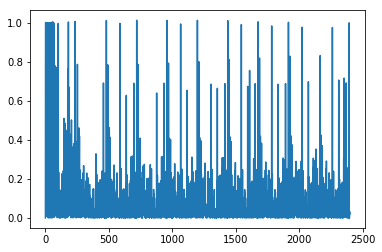

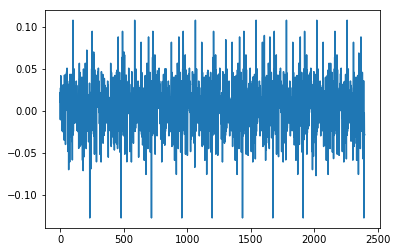

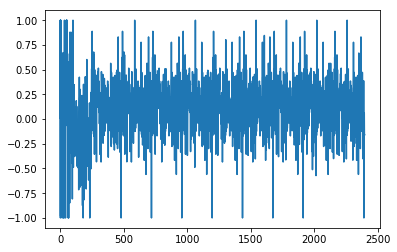

1.13491287918
[ 0.11111111  0.11111111  0.11111111  0.11111111  0.11111111  0.55555556
  0.55555556  0.11111111  1.          0.55555556  1.          1.          1.
  1.          1.          1.          0.11111111  0.55555556  0.55555556
  0.55555556  1.          1.          1.          1.          1.          1.
  0.55555556  1.          1.          0.55555556  1.          1.
  0.55555556  1.          0.11111111  0.11111111  0.11111111  1.
  0.55555556  1.          1.          0.11111111  0.11111111  0.55555556
  0.11111111  0.11111111  0.55555556  0.55555556  1.          1.          1.
  1.          1.          0.11111111  0.11111111  0.55555556  0.55555556
  1.          1.        ]
Writing away results
1974-06-01 00:00:00


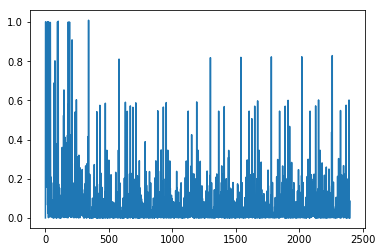

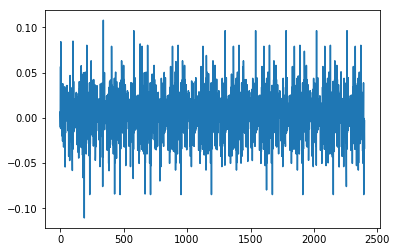

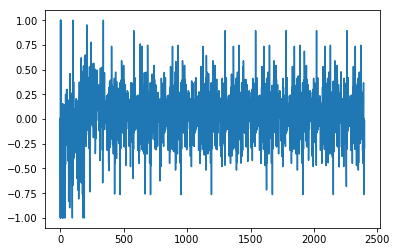

1.22668177308
[ 0.33333333  0.33333333  0.33333333  0.33333333  0.88888889  0.66666667
  0.44444444  0.88888889  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.88888889  0.33333333  0.88888889  0.66666667
  0.66666667  0.88888889  0.66666667  0.66666667  0.66666667  0.44444444
  0.88888889  0.66666667  0.44444444  0.88888889  0.66666667  0.88888889
  0.88888889  0.66666667  0.44444444  0.88888889  0.33333333  0.33333333
  0.88888889  0.66666667  0.44444444  0.88888889  0.33333333  0.88888889
  0.66666667  0.44444444  0.88888889  0.88888889  0.66666667  0.66666667
  0.66666667  0.88888889  0.66666667  0.66666667  0.33333333  0.88888889
  0.33333333  0.          0.66666667  0.88888889  0.66666667]
Writing away results
1974-07-01 00:00:00


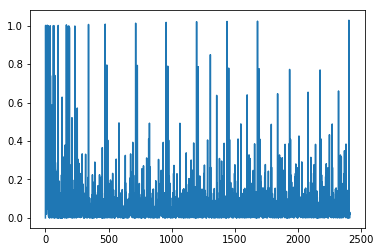

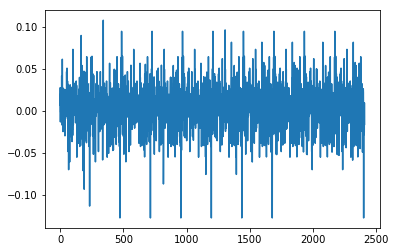

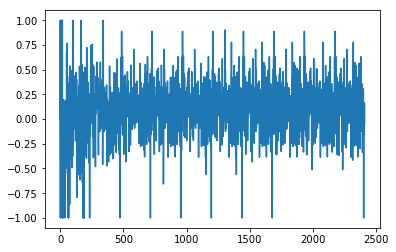

1.29276471134
[ 0.          0.          0.          0.66666667  0.          0.66666667
  1.          1.          1.          1.          1.          1.          1.
  0.66666667  0.          0.          1.          1.          1.          1.
  1.          1.          0.66666667  1.          1.          0.66666667
  1.          0.          0.66666667  1.          1.          0.66666667
  0.66666667  0.          0.          0.66666667  1.          0.66666667
  0.66666667  0.          0.66666667  1.          0.          0.66666667
  0.          1.          1.          1.          1.          1.          1.
  0.66666667  0.66666667  0.          0.          1.          0.66666667
  1.          0.22222222]
Writing away results
1974-08-01 00:00:00


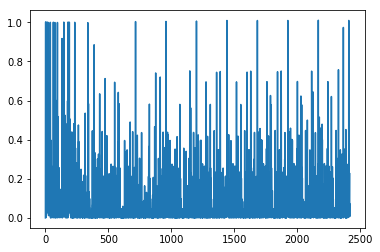

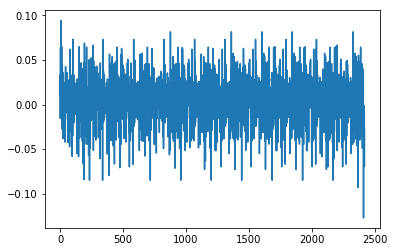

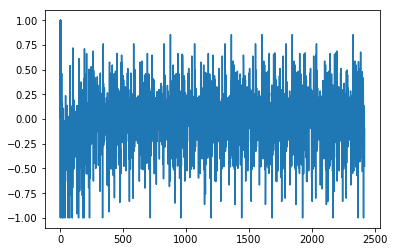

1.49724986401
[ 0.77777778  0.77777778  0.88888889  0.88888889  1.          0.66666667
  1.          1.          0.66666667  1.          1.          0.66666667
  0.66666667  0.66666667  0.88888889  1.          1.          1.          1.
  1.          0.66666667  0.66666667  0.66666667  1.          1.
  0.66666667  0.33333333  0.66666667  1.          0.          0.66666667
  0.66666667  0.88888889  0.11111111  1.          1.          0.33333333
  0.66666667  0.11111111  0.66666667  0.88888889  0.33333333  0.66666667
  0.88888889  1.          1.          1.          0.66666667  1.          1.
  0.66666667  0.66666667  0.88888889  1.          1.          1.          1.
  1.          0.66666667]
Writing away results
1974-09-01 00:00:00


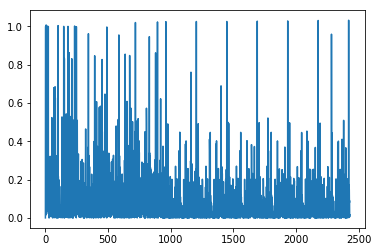

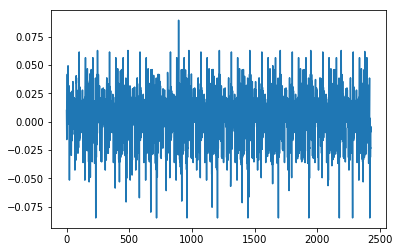

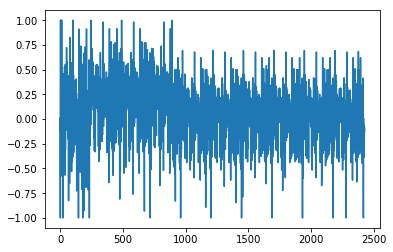

1.53084622182
[ 0.55555556  0.55555556  0.          0.66666667  0.55555556  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.55555556
  0.55555556  0.          0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.55555556  0.55555556  0.66666667  0.66666667
  0.55555556  0.66666667  0.55555556  0.55555556  0.66666667  0.55555556
  0.55555556  0.          0.          0.66666667  0.66666667  0.66666667
  0.55555556  0.22222222  0.55555556  0.          0.77777778  0.55555556
  0.55555556  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.55555556  0.55555556  0.          0.          0.66666667
  0.66666667  0.66666667  0.66666667  0.55555556  0.66666667]
Writing away results
1974-10-01 00:00:00


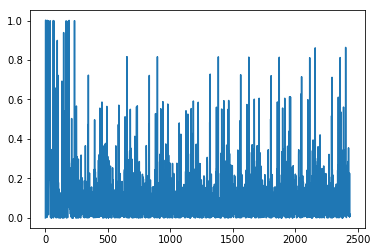

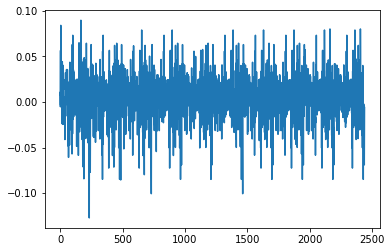

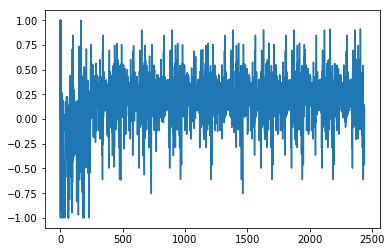

1.25499691378
[ 0.88888889  0.11111111  0.11111111  0.66666667  0.11111111  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.88888889
  0.88888889  0.11111111  0.11111111  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.11111111  0.66666667  0.66666667
  0.11111111  0.66666667  0.66666667  0.11111111  0.66666667  0.88888889
  0.88888889  0.11111111  0.66666667  0.11111111  0.22222222  0.66666667
  0.22222222  0.88888889  0.11111111  0.22222222  0.88888889  0.88888889
  0.11111111  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.22222222  0.88888889  0.88888889  0.11111111  0.66666667  0.66666667
  0.66666667  0.22222222  0.66666667  0.11111111  0.66666667]
Writing away results
1974-11-01 00:00:00


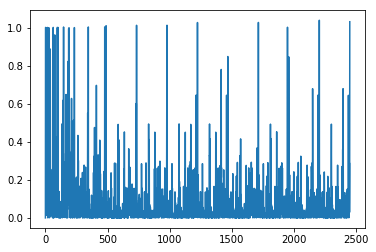

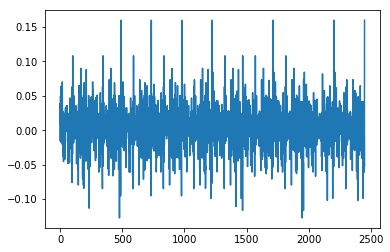

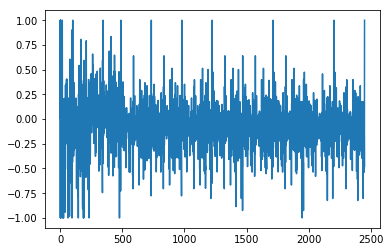

1.43606251289
[ 0.77777778  0.77777778  0.66666667  0.88888889  0.77777778  0.66666667
  0.66666667  0.55555556  0.77777778  0.66666667  1.          0.66666667
  0.55555556  0.77777778  0.66666667  0.77777778  0.88888889  0.66666667
  0.77777778  0.66666667  0.77777778  0.77777778  0.66666667  0.88888889
  0.66666667  0.66666667  0.77777778  0.88888889  0.66666667  1.          1.
  0.66666667  0.77777778  0.77777778  0.66666667  0.77777778  0.66666667
  0.33333333  0.77777778  1.          0.66666667  0.55555556  0.77777778
  0.77777778  0.66666667  0.66666667  0.77777778  0.77777778  0.66666667
  0.66666667  0.77777778  0.77777778  0.66666667  0.66666667  0.77777778
  0.66666667  0.77777778  0.55555556  0.88888889]
Writing away results
1974-12-01 00:00:00


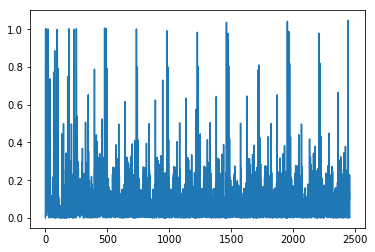

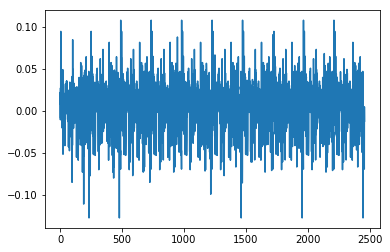

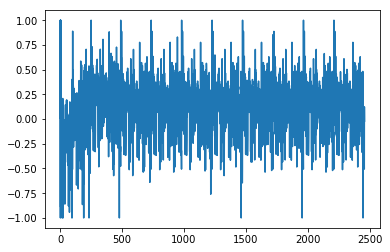

1.33757255687
[ 0.          1.          1.          1.          1.          1.          1.
  1.          0.66666667  0.66666667  0.44444444  1.          1.          1.
  1.          1.          1.          0.66666667  0.66666667  1.          1.
  0.66666667  0.          0.66666667  1.          1.          0.66666667
  0.66666667  0.44444444  0.44444444  1.          1.          0.
  0.66666667  0.          0.66666667  1.          0.          0.66666667
  0.66666667  1.          1.          1.          1.          1.          1.
  0.66666667  0.66666667  0.44444444  0.44444444  1.          1.          1.
  1.          0.66666667  1.          1.          1.          0.        ]
Writing away results
1975-01-01 00:00:00


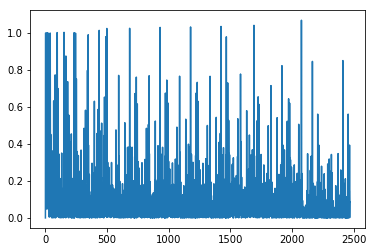

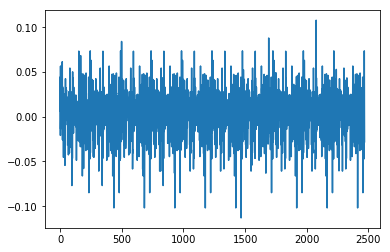

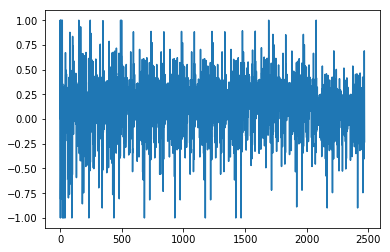

1.2015598146
[ 0.66666667  0.88888889  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.44444444  0.88888889  0.88888889  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.88888889  0.66666667  0.66666667  0.88888889  0.66666667  0.66666667
  0.88888889  0.66666667  0.44444444  0.88888889  0.44444444  0.66666667
  0.88888889  0.66666667  0.44444444  0.44444444  0.44444444  0.88888889
  0.11111111  0.44444444  0.44444444  0.88888889  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.44444444  0.44444444  0.44444444
  0.88888889  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.88888889  0.66666667  0.66666667  0.11111111  0.44444444]
Writing away results
1975-02-01 00:00:00


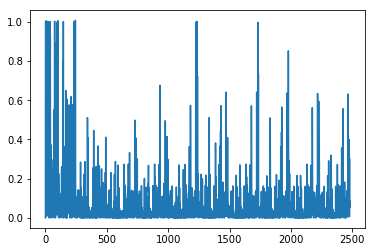

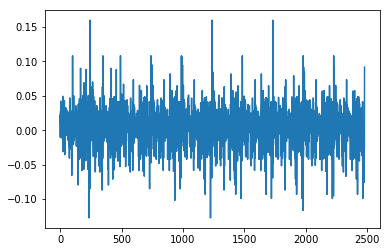

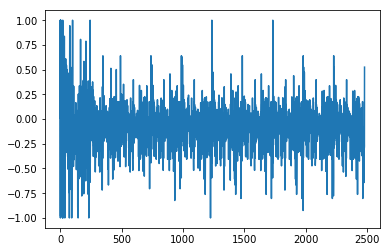

1.14763439981
[ 0.77777778  0.66666667  0.66666667  0.66666667  1.          0.66666667
  0.66666667  0.66666667  0.22222222  0.77777778  0.77777778  0.66666667
  0.77777778  0.66666667  0.66666667  0.66666667  0.66666667  0.77777778
  0.66666667  0.66666667  1.          0.66666667  1.          0.77777778
  0.66666667  0.66666667  0.77777778  0.77777778  0.66666667  0.77777778
  0.66666667  0.66666667  0.77777778  0.66666667  0.77777778  0.77777778
  0.66666667  0.          0.77777778  0.77777778  0.66666667  0.66666667
  0.77777778  0.77777778  0.66666667  0.66666667  0.77777778  0.77777778
  0.33333333  0.66666667  1.          0.66666667  0.66666667  0.77777778
  0.66666667  0.33333333  0.33333333  0.66666667  0.77777778]
Writing away results
1975-03-01 00:00:00


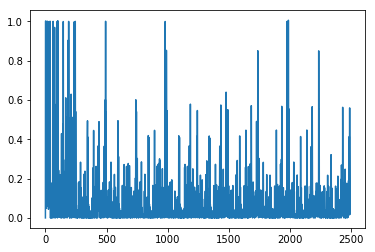

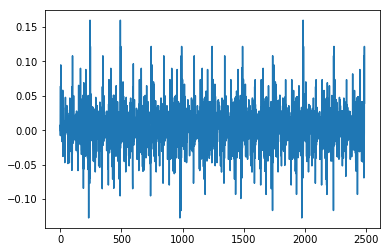

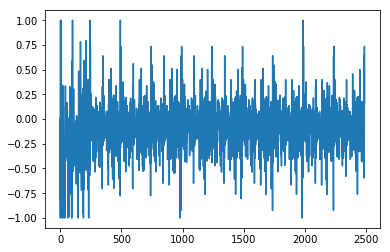

1.37483690991
[ 0.88888889  0.66666667  0.66666667  0.          0.77777778  0.66666667
  0.66666667  0.88888889  0.77777778  0.88888889  0.66666667  0.77777778
  0.88888889  0.66666667  0.88888889  0.66666667  0.77777778  0.88888889
  0.66666667  0.77777778  0.66666667  1.          0.77777778  0.66666667
  0.66666667  0.77777778  0.77777778  0.66666667  0.77777778  0.88888889
  0.66666667  0.77777778  0.66666667  0.77777778  0.77777778  0.66666667
  0.66666667  0.77777778  0.77777778  0.88888889  0.66666667  0.77777778
  0.77777778  0.66666667  0.66666667  0.77777778  0.77777778  0.77777778
  0.66666667  0.77777778  0.88888889  0.66666667  0.77777778  0.88888889
  0.77777778  0.77777778  0.66666667  0.77777778  0.77777778]
Writing away results
1975-04-01 00:00:00


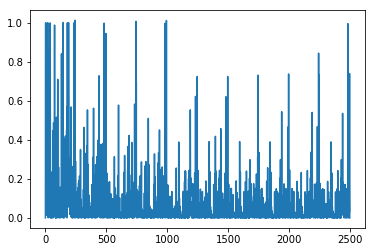

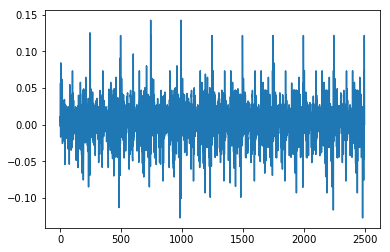

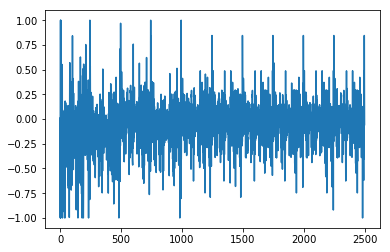

1.12098738486
[ 0.66666667  0.66666667  0.88888889  0.66666667  0.66666667  0.44444444
  0.44444444  0.77777778  0.88888889  0.66666667  1.          0.88888889
  0.66666667  0.88888889  0.66666667  0.77777778  0.88888889  0.66666667
  0.44444444  0.88888889  0.66666667  0.77777778  0.88888889  0.66666667
  0.77777778  0.44444444  0.66666667  0.77777778  0.88888889  0.66666667
  0.44444444  0.66666667  0.77777778  0.88888889  0.66666667  0.44444444
  0.77777778  0.88888889  0.88888889  0.66666667  1.          0.88888889
  0.66666667  0.66666667  0.77777778  0.88888889  0.88888889  0.66666667
  0.66666667  0.88888889  0.66666667  0.77777778  0.88888889  0.66666667
  0.88888889  0.66666667  0.77777778  0.88888889  0.66666667]
Writing away results
1975-05-01 00:00:00


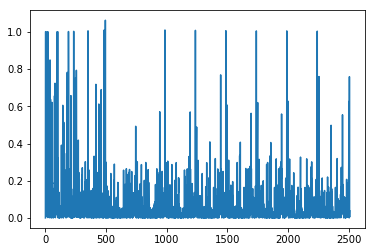

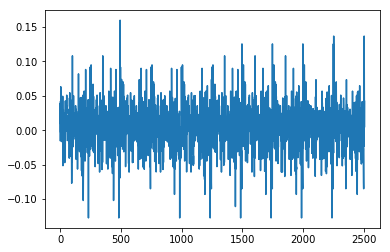

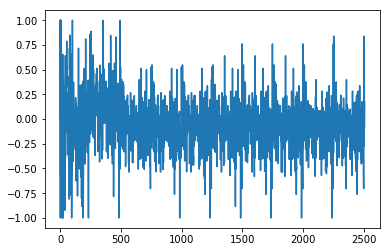

1.16712290872
[ 0.66666667  0.66666667  1.          0.66666667  0.77777778  0.77777778
  0.77777778  1.          0.66666667  0.11111111  0.66666667  0.66666667
  1.          0.66666667  0.77777778  1.          0.66666667  0.77777778
  0.66666667  0.66666667  0.77777778  0.66666667  0.66666667  0.77777778
  0.77777778  0.66666667  0.77777778  1.          0.66666667  0.77777778
  0.66666667  0.77777778  0.77777778  0.66666667  0.77777778  0.
  0.11111111  0.66666667  0.66666667  0.66666667  1.          1.
  0.66666667  0.77777778  0.77777778  0.33333333  0.66666667  0.66666667
  1.          0.66666667  0.77777778  0.66666667  0.66666667  0.77777778
  0.66666667  0.77777778  0.77777778  0.66666667  0.33333333]
Writing away results
1975-06-01 00:00:00


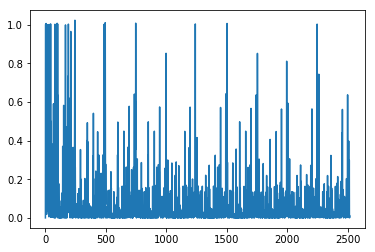

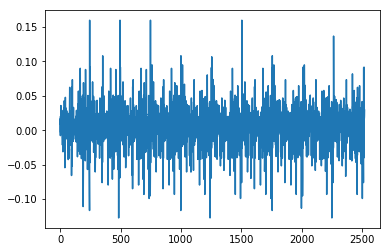

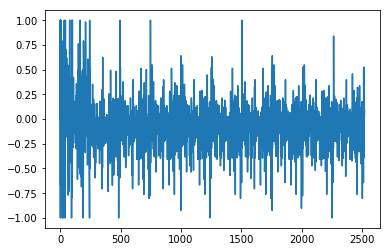

1.1459446683
[ 0.88888889  0.88888889  0.66666667  0.55555556  0.55555556  0.77777778
  1.          0.66666667  0.77777778  0.66666667  0.66666667  0.66666667
  0.66666667  0.77777778  0.66666667  0.66666667  0.77777778  0.66666667
  0.66666667  0.77777778  0.66666667  0.66666667  0.77777778  0.77777778
  0.66666667  0.77777778  0.66666667  0.66666667  0.77777778  0.66666667
  0.77777778  0.77777778  0.66666667  0.55555556  0.77777778  0.77777778
  0.66666667  0.66666667  0.77777778  0.77777778  0.66666667  0.66666667
  0.77777778  0.77777778  0.88888889  0.66666667  0.33333333  1.
  0.66666667  0.77777778  0.66666667  0.88888889  0.88888889  0.66666667
  0.77777778  0.77777778  0.88888889  0.88888889  0.66666667]
Writing away results
1975-07-01 00:00:00


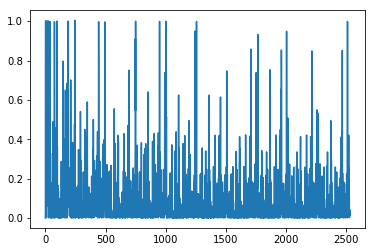

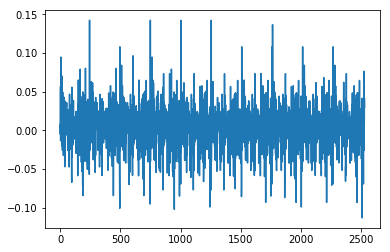

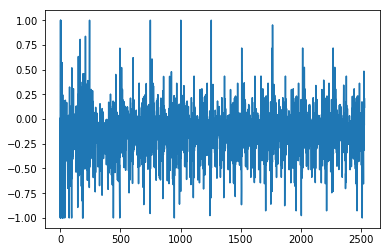

1.15299677601
[ 0.88888889  0.66666667  0.66666667  0.22222222  0.77777778  0.55555556
  0.66666667  0.77777778  0.55555556  0.66666667  0.55555556  0.66666667
  0.77777778  0.55555556  0.66666667  0.88888889  0.66666667  0.66666667
  0.77777778  0.66666667  0.66666667  0.77777778  0.11111111  0.66666667
  0.77777778  0.55555556  0.66666667  0.77777778  0.66666667  0.77777778
  0.55555556  0.66666667  0.66666667  0.77777778  0.77777778  0.55555556
  0.66666667  0.77777778  0.77777778  0.66666667  0.66666667  0.
  0.77777778  0.44444444  0.66666667  0.66666667  0.55555556  0.66666667
  0.77777778  0.55555556  0.33333333  0.55555556  0.66666667  0.77777778
  0.77777778  0.33333333  0.88888889  0.66666667  0.77777778]
Writing away results
1975-08-01 00:00:00


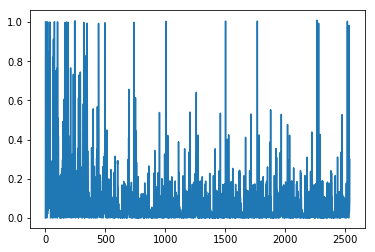

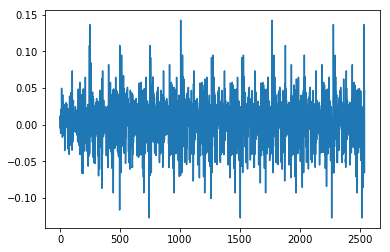

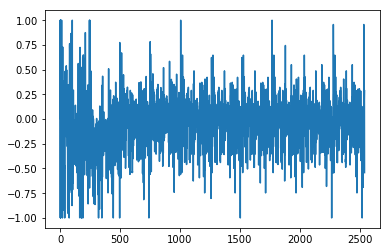

1.32595874438
[ 0.66666667  0.55555556  0.22222222  0.77777778  1.          0.66666667
  1.          1.          0.66666667  0.66666667  0.66666667  0.77777778
  1.          0.66666667  0.77777778  0.66666667  0.66666667  1.
  0.66666667  0.66666667  0.77777778  0.77777778  0.66666667  0.77777778
  1.          0.66666667  0.77777778  0.66666667  0.77777778  1.
  0.66666667  0.55555556  0.77777778  1.          1.          0.66666667
  1.          1.          1.          0.66666667  0.77777778  0.11111111
  1.          0.66666667  1.          1.          0.66666667  0.77777778
  1.          1.          1.          0.66666667  0.77777778  1.          1.
  1.          0.66666667  0.77777778  1.        ]
Writing away results
1975-09-01 00:00:00


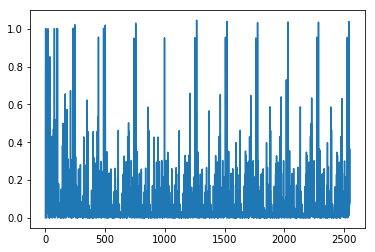

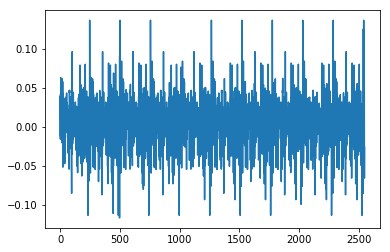

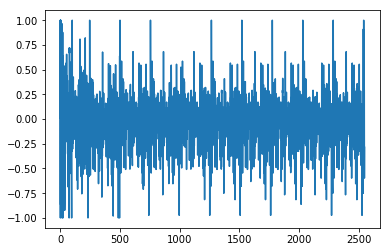

1.46292732495
[ 0.88888889  0.22222222  0.77777778  1.          0.88888889  0.88888889
  1.          0.88888889  1.          0.88888889  0.77777778  1.
  0.88888889  0.77777778  1.          0.88888889  0.77777778  1.
  0.88888889  0.77777778  0.77777778  0.66666667  0.77777778  1.
  0.88888889  0.77777778  0.66666667  0.77777778  1.          0.88888889
  0.77777778  0.77777778  1.          1.          0.88888889  0.88888889
  1.          1.          0.88888889  0.77777778  1.          0.88888889
  0.66666667  0.88888889  1.          0.88888889  0.77777778  0.66666667
  0.88888889  1.          0.88888889  0.77777778  1.          0.88888889
  1.          0.88888889  0.77777778  1.          0.88888889]
Writing away results
1975-10-01 00:00:00


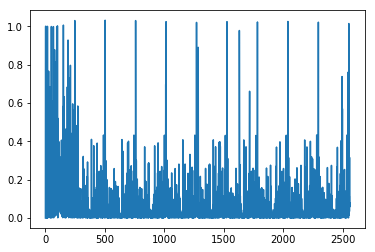

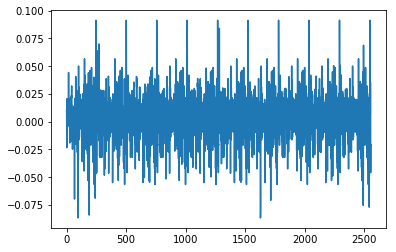

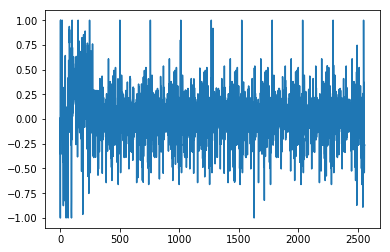

1.24807926237
[ 0.88888889  0.66666667  0.66666667  0.44444444  0.66666667  0.66666667
  0.44444444  0.66666667  0.44444444  0.66666667  0.66666667  0.44444444
  0.          0.66666667  0.44444444  0.66666667  0.66666667  0.44444444
  0.          0.          0.66666667  0.          0.66666667  0.44444444
  0.          0.11111111  0.          0.66666667  0.44444444  0.33333333
  0.66666667  0.66666667  0.66666667  0.44444444  0.66666667  0.66666667
  0.44444444  0.44444444  0.          0.66666667  0.44444444  0.44444444
  0.44444444  0.66666667  0.44444444  0.66666667  0.66666667  0.44444444
  0.          0.44444444  0.          0.66666667  0.44444444  0.
  0.44444444  1.          0.66666667  0.66666667  0.44444444]
Writing away results
1975-11-01 00:00:00


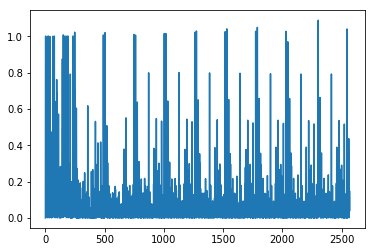

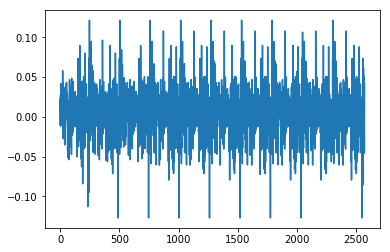

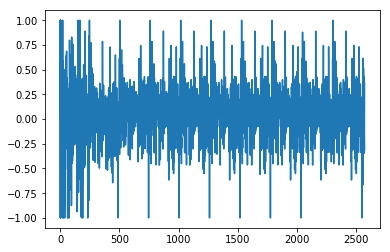

1.34962845448
[ 0.11111111  0.88888889  1.          0.11111111  0.88888889  1.
  0.88888889  1.          0.11111111  0.88888889  1.          0.11111111
  0.88888889  1.          0.11111111  0.88888889  1.          0.44444444
  0.44444444  0.88888889  0.11111111  0.88888889  1.          0.44444444
  0.44444444  0.11111111  0.88888889  1.          1.          0.11111111
  0.88888889  0.88888889  1.          1.          0.88888889  0.88888889
  1.          0.11111111  0.11111111  0.88888889  0.88888889  1.
  0.88888889  1.          0.11111111  0.88888889  0.88888889  0.88888889
  1.          0.11111111  0.88888889  0.88888889  0.88888889  1.
  0.44444444  0.88888889  0.88888889  0.88888889  0.88888889]
Writing away results
1975-12-01 00:00:00


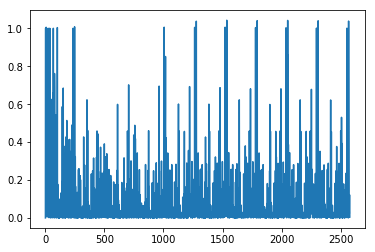

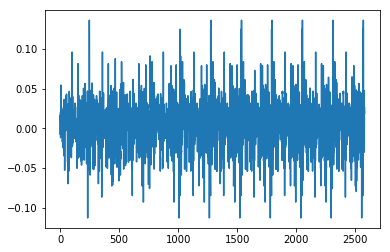

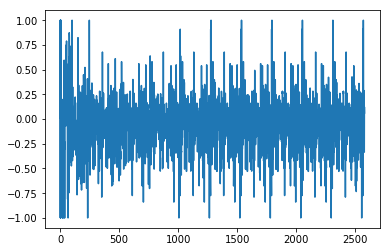

1.45669038318
[ 1.          0.88888889  0.33333333  1.          0.88888889  1.
  0.88888889  0.77777778  1.          0.88888889  0.77777778  1.
  0.88888889  0.77777778  1.          0.88888889  0.77777778  0.77777778
  0.66666667  0.77777778  1.          0.88888889  0.          0.66666667
  0.77777778  1.          0.88888889  0.77777778  0.77777778  0.33333333
  0.66666667  0.88888889  0.88888889  1.          1.          0.88888889
  0.77777778  1.          0.11111111  0.66666667  0.88888889  1.
  0.88888889  0.77777778  0.66666667  0.88888889  1.          0.88888889
  0.77777778  1.          0.88888889  0.          0.88888889  0.77777778
  1.          0.66666667  0.66666667  0.66666667  0.88888889]
Writing away results
1976-01-01 00:00:00


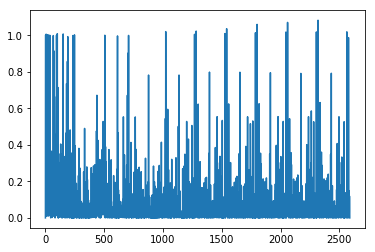

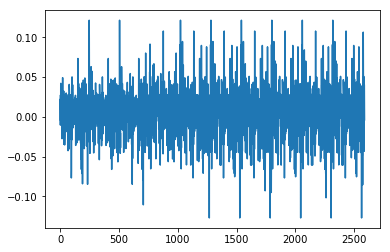

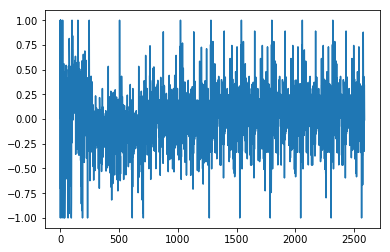

1.23629472276
[ 1.          1.          0.88888889  1.          0.88888889  1.
  0.66666667  0.88888889  1.          0.66666667  0.88888889  1.
  0.66666667  0.88888889  1.          0.55555556  0.55555556  1.
  0.66666667  0.88888889  1.          0.55555556  0.88888889  0.
  0.88888889  1.          0.55555556  0.66666667  0.66666667  0.88888889
  1.          1.          0.88888889  0.33333333  1.          0.55555556
  0.88888889  1.          1.          1.          0.88888889  1.
  0.66666667  0.88888889  1.          0.88888889  1.          0.
  0.88888889  1.          0.88888889  1.          0.55555556  0.88888889
  1.          1.          1.          1.          1.        ]
Writing away results
1976-02-01 00:00:00


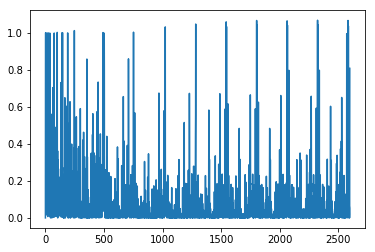

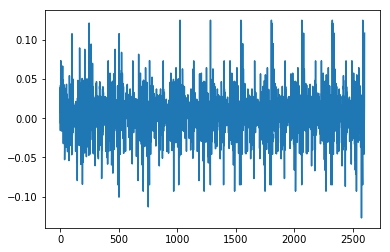

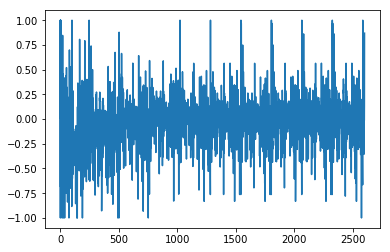

1.11210271061
[ 0.66666667  0.88888889  0.66666667  0.88888889  0.66666667  0.11111111
  0.88888889  0.66666667  0.77777778  0.88888889  0.66666667  0.77777778
  0.88888889  0.66666667  0.11111111  0.77777778  0.66666667  0.77777778
  0.88888889  0.66666667  0.77777778  0.88888889  0.11111111  0.88888889
  0.66666667  0.11111111  0.88888889  0.88888889  0.88888889  0.66666667
  0.66666667  0.88888889  0.66666667  0.66666667  0.11111111  0.88888889
  0.66666667  0.66666667  0.66666667  0.88888889  0.66666667  0.11111111
  0.88888889  0.66666667  0.88888889  0.66666667  0.11111111  0.88888889
  0.66666667  0.88888889  0.66666667  0.11111111  0.88888889  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.        ]
Writing away results
1976-03-01 00:00:00


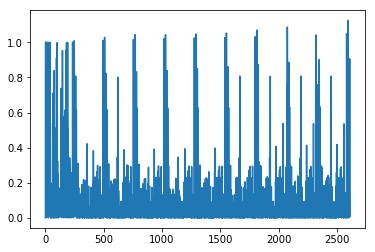

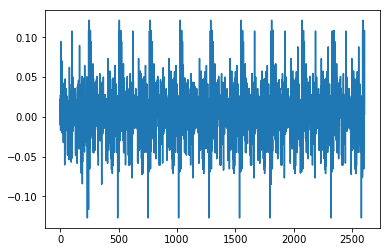

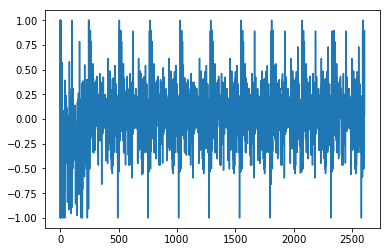

1.09226807305
[ 0.88888889  1.          0.88888889  1.          0.          0.88888889
  1.          0.          0.88888889  1.          0.          0.88888889
  1.          0.          0.          0.88888889  0.          0.88888889
  1.          0.          0.88888889  0.          0.88888889  0.66666667
  0.66666667  0.88888889  0.88888889  0.88888889  1.          1.
  0.88888889  0.66666667  0.66666667  0.          0.88888889  1.          1.
  1.          0.88888889  1.          0.          0.88888889  1.
  0.88888889  1.          0.          0.88888889  1.          0.66666667
  0.66666667  0.          0.88888889  1.          1.          1.          1.
  1.          1.          0.88888889]
Writing away results
1976-04-01 00:00:00


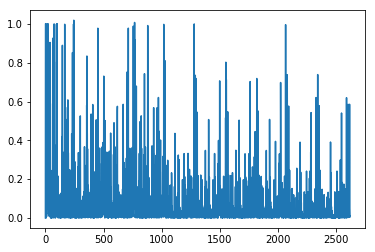

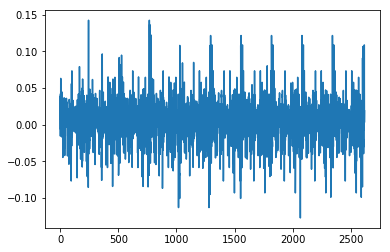

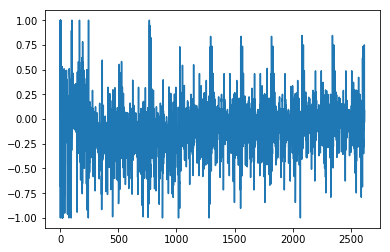

1.16272287193
[ 0.66666667  0.66666667  0.66666667  0.77777778  0.88888889  0.66666667
  0.88888889  0.66666667  0.66666667  0.77777778  0.66666667  0.66666667
  0.55555556  0.55555556  0.66666667  0.77777778  0.88888889  0.66666667
  0.55555556  0.66666667  0.77777778  0.88888889  0.66666667  0.44444444
  0.77777778  0.88888889  0.66666667  0.66666667  0.77777778  0.88888889
  0.55555556  0.66666667  0.11111111  0.88888889  0.77777778  0.66666667
  0.77777778  0.88888889  0.66666667  0.77777778  0.66666667  0.66666667
  0.55555556  0.66666667  0.77777778  0.88888889  0.66666667  0.55555556
  0.66666667  0.77777778  0.88888889  0.66666667  0.66666667  0.66666667
  0.77777778  0.66666667  0.77777778  0.88888889  0.66666667]
Writing away results
1976-05-01 00:00:00


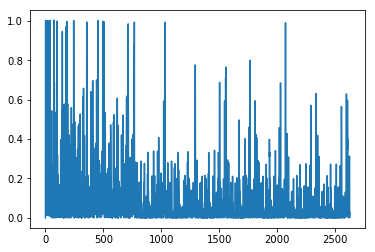

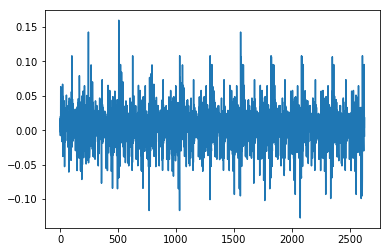

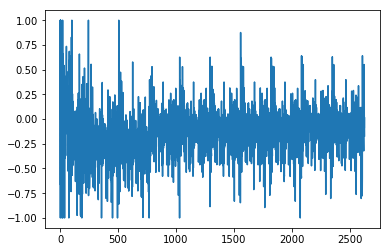

1.1057935528
[ 0.66666667  0.66666667  0.77777778  0.66666667  0.66666667  0.44444444
  0.66666667  0.66666667  0.77777778  0.66666667  0.66666667  0.77777778
  0.          0.66666667  0.77777778  0.66666667  0.66666667  0.
  0.66666667  0.77777778  0.77777778  0.66666667  0.88888889  0.77777778
  0.77777778  0.66666667  0.66666667  0.77777778  0.77777778  0.66666667
  0.66666667  0.44444444  0.77777778  0.77777778  0.66666667  0.44444444
  0.77777778  0.66666667  0.77777778  0.77777778  0.77777778  0.
  0.66666667  0.77777778  0.77777778  0.77777778  0.66666667  0.66666667
  0.55555556  0.77777778  0.66666667  0.77777778  0.33333333  0.77777778
  0.77777778  0.44444444  0.66666667  0.66666667  0.44444444]
Writing away results
1976-06-01 00:00:00


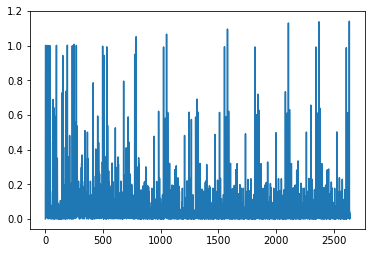

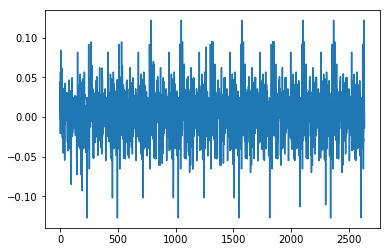

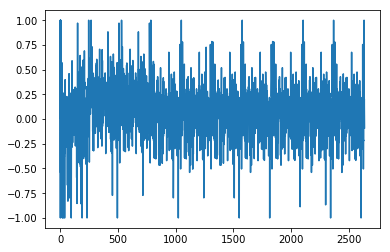

1.14714869597
[ 1.          1.          0.66666667  1.          0.11111111  0.66666667
  1.          1.          0.66666667  0.11111111  0.88888889  0.11111111
  1.          1.          0.66666667  0.22222222  0.11111111  0.88888889
  0.88888889  0.66666667  0.22222222  0.88888889  1.          1.          1.
  1.          1.          1.          0.11111111  0.22222222  0.88888889
  0.66666667  1.          1.          1.          0.66666667  1.          1.
  1.          1.          0.11111111  0.22222222  0.88888889  1.          1.
  0.11111111  0.22222222  0.88888889  1.          1.          1.          1.
  1.          1.          1.          0.66666667  0.22222222  0.88888889
  0.66666667]
Writing away results
1976-07-01 00:00:00


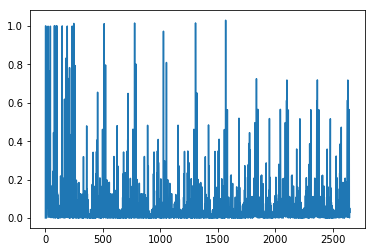

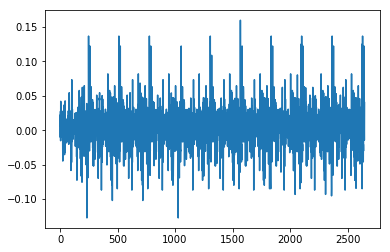

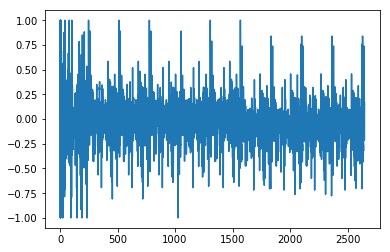

1.1957790726
[ 0.77777778  1.          0.66666667  1.          1.          0.66666667
  0.44444444  1.          0.66666667  0.77777778  0.77777778  1.
  0.77777778  1.          0.66666667  0.77777778  1.          0.77777778
  1.          0.66666667  0.77777778  0.88888889  1.          1.
  0.66666667  0.66666667  1.          0.66666667  0.66666667  0.77777778
  1.          0.55555556  0.66666667  0.66666667  1.          0.66666667
  0.88888889  1.          0.66666667  0.55555556  0.66666667  0.77777778
  1.          0.66666667  0.55555556  0.66666667  0.77777778  1.
  0.66666667  0.66666667  0.66666667  0.55555556  0.88888889  0.44444444
  1.          0.66666667  0.44444444  0.77777778  0.66666667]
Writing away results
1976-08-01 00:00:00


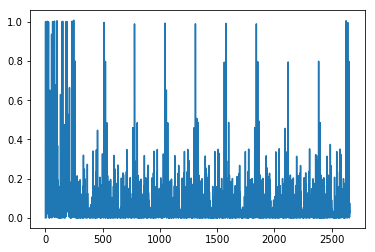

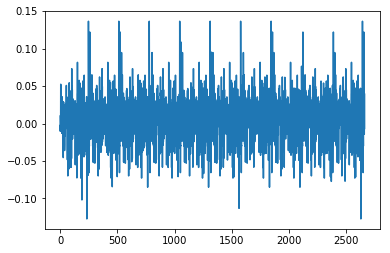

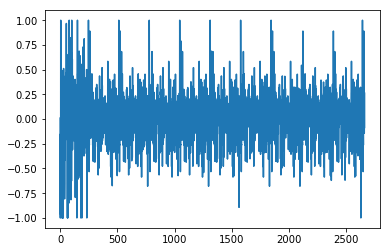

1.15012159588
[ 1.          0.66666667  1.          1.          0.66666667  1.          1.
  0.66666667  0.44444444  0.          0.66666667  1.          1.
  0.66666667  0.          0.66666667  0.88888889  1.          0.66666667
  0.88888889  1.          1.          1.          1.          1.          1.
  0.66666667  0.66666667  0.44444444  1.          1.          1.          1.
  1.          0.66666667  1.          1.          1.          1.
  0.66666667  0.88888889  1.          1.          1.          0.66666667
  0.88888889  1.          1.          1.          1.          1.          1.
  1.          1.          0.66666667  0.88888889  0.11111111  1.
  0.66666667]
Writing away results
1976-09-01 00:00:00


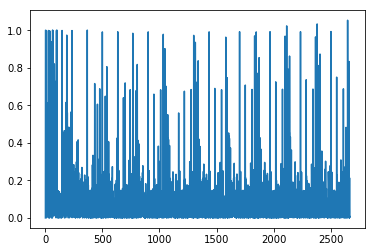

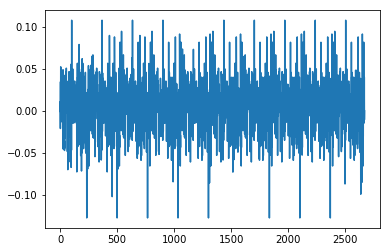

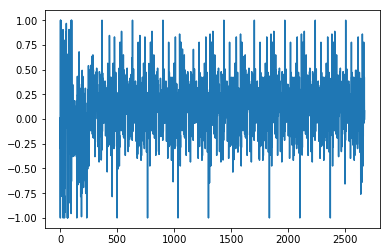

0.996758621646
[ 1.          0.66666667  1.          1.          0.66666667  1.          1.
  0.33333333  0.          1.          0.66666667  0.66666667  1.          0.
  0.33333333  0.33333333  0.66666667  1.          0.33333333  0.66666667
  1.          1.          1.          1.          0.66666667  0.          1.
  0.          0.66666667  1.          1.          1.          0.66666667
  1.          0.66666667  1.          1.          0.          1.
  0.33333333  0.66666667  1.          0.          1.          0.33333333
  0.66666667  1.          1.          1.          1.          1.
  0.66666667  1.          1.          0.33333333  0.66666667  1.          0.
  0.        ]
Writing away results
1976-10-01 00:00:00


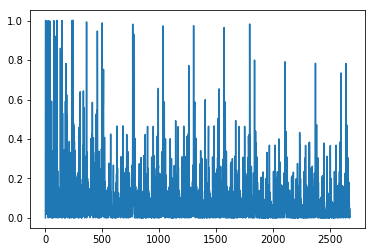

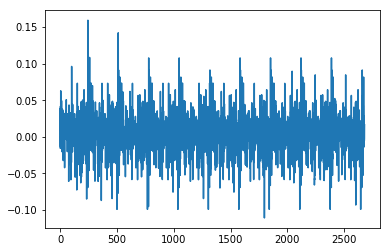

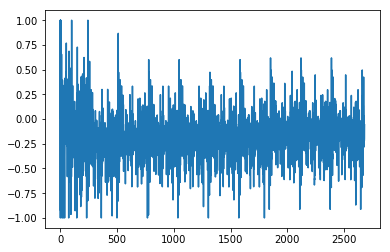

0.897488499467
[ 0.66666667  0.66666667  0.77777778  0.77777778  0.66666667  0.55555556
  0.66666667  0.66666667  0.66666667  0.77777778  0.66666667  0.55555556
  0.66666667  0.66666667  0.77777778  0.66666667  0.66666667  0.66666667
  0.77777778  0.77777778  0.77777778  0.77777778  0.77777778  0.77777778
  0.66666667  0.66666667  0.55555556  0.66666667  0.77777778  1.
  0.77777778  0.66666667  0.55555556  0.77777778  0.77777778  0.77777778
  0.          0.66666667  0.77777778  0.77777778  0.77777778  1.
  0.66666667  0.55555556  0.66666667  0.66666667  0.77777778  0.77777778
  0.77777778  0.77777778  0.77777778  0.11111111  0.55555556  0.66666667
  0.77777778  1.          0.44444444  1.          0.66666667]
Writing away results
1976-11-01 00:00:00


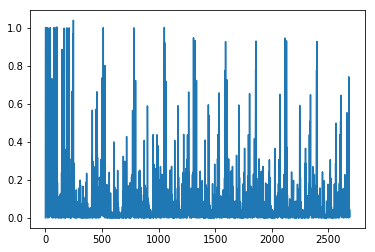

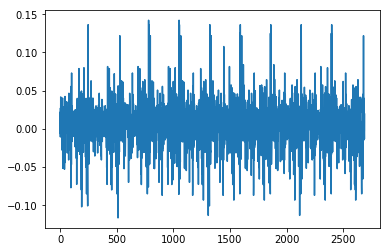

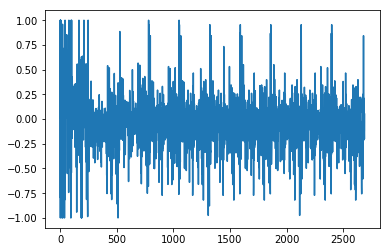

1.13487621452
[ 1.          0.66666667  0.          0.66666667  0.66666667  0.77777778
  0.77777778  0.66666667  0.77777778  1.          0.66666667  0.77777778
  0.66666667  0.77777778  1.          0.66666667  0.77777778  0.77777778
  0.88888889  0.66666667  0.66666667  0.88888889  1.          0.66666667
  0.66666667  0.77777778  1.          0.88888889  0.66666667  0.88888889
  1.          0.66666667  0.88888889  0.66666667  0.66666667  0.22222222
  0.66666667  0.77777778  0.11111111  0.66666667  0.11111111  0.66666667
  0.77777778  1.          0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.44444444  1.          0.66666667  0.77777778  0.77777778
  0.66666667  0.77777778  0.77777778  0.          0.77777778]
Writing away results
1976-12-01 00:00:00


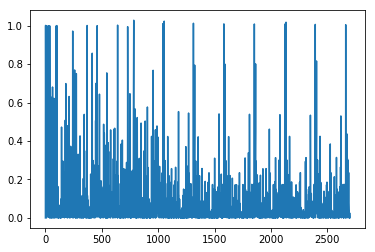

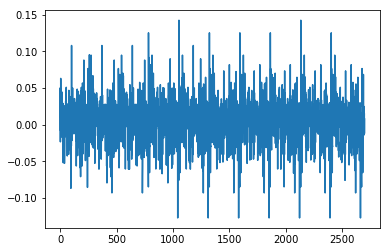

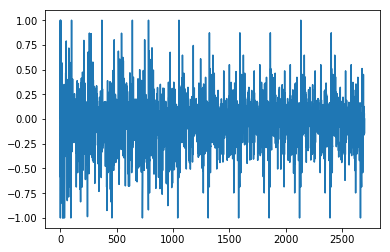

0.933747004619
[ 0.66666667  0.77777778  0.55555556  0.66666667  0.77777778  0.77777778
  0.66666667  0.77777778  0.55555556  0.66666667  0.77777778  0.66666667
  0.77777778  0.55555556  0.66666667  0.33333333  0.          1.          1.
  0.66666667  1.          0.55555556  0.55555556  0.66666667  0.77777778
  0.55555556  1.          0.66666667  1.          0.55555556  0.66666667
  0.33333333  1.          1.          0.55555556  0.66666667  0.77777778
  0.55555556  0.66666667  0.55555556  0.66666667  0.77777778  0.55555556
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  1.
  0.55555556  0.66666667  0.22222222  0.77777778  0.66666667  0.66666667
  0.77777778  0.77777778  0.77777778  0.66666667]
Writing away results
1977-01-01 00:00:00


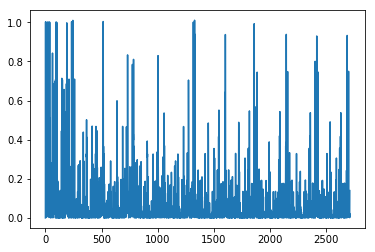

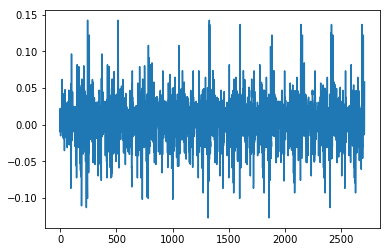

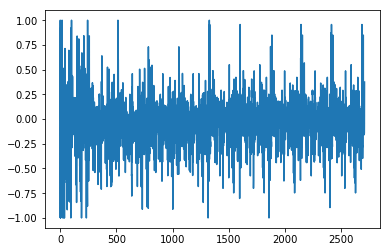

0.946274025705
[ 0.77777778  1.          0.66666667  0.77777778  0.77777778  0.66666667
  0.77777778  1.          0.66666667  0.          0.66666667  0.77777778
  1.          0.66666667  0.11111111  0.22222222  1.          1.
  0.66666667  0.66666667  1.          0.          0.66666667  0.77777778
  1.          0.77777778  0.66666667  0.55555556  1.          0.66666667
  0.77777778  0.66666667  0.66666667  0.          0.66666667  0.77777778
  1.          0.66666667  1.          0.66666667  0.77777778  1.
  0.66666667  0.66666667  0.66666667  0.44444444  0.66666667  0.77777778
  1.          0.66666667  0.88888889  0.77777778  0.66666667  0.55555556
  0.77777778  0.          0.          0.88888889  0.22222222]
Writing away results
1977-02-01 00:00:00


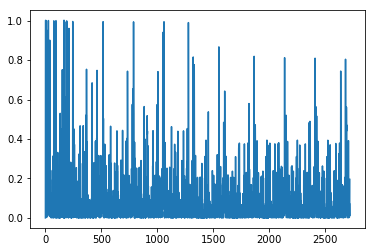

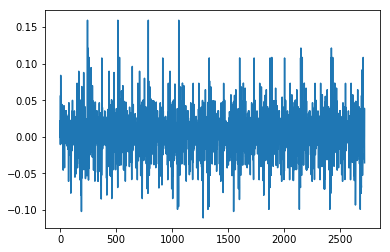

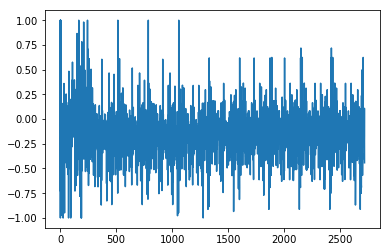

1.11446376502
[ 0.66666667  1.          0.55555556  0.66666667  0.66666667  0.77777778
  0.66666667  0.66666667  0.33333333  0.66666667  0.77777778  0.11111111
  0.66666667  1.          0.77777778  0.77777778  0.77777778  1.
  0.77777778  0.77777778  0.66666667  0.66666667  1.          0.11111111
  0.77777778  0.66666667  0.77777778  0.66666667  0.66666667  0.77777778
  0.77777778  0.77777778  0.11111111  0.66666667  0.77777778  0.77777778
  0.77777778  0.66666667  0.66666667  0.77777778  0.88888889  0.66666667
  0.77777778  0.77777778  0.77777778  0.77777778  0.77777778  0.44444444
  1.          0.66666667  0.77777778  0.66666667  1.          0.11111111
  0.33333333  0.66666667  0.66666667  0.88888889  0.77777778]
Writing away results
1977-03-01 00:00:00


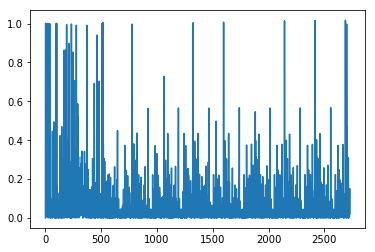

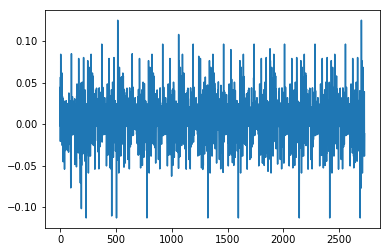

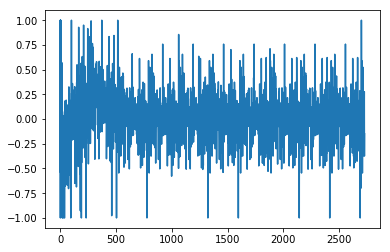

0.999580774899
[ 0.88888889  0.66666667  0.11111111  0.55555556  0.11111111  0.55555556
  0.88888889  0.11111111  0.          0.11111111  0.55555556  0.88888889
  0.66666667  0.55555556  0.55555556  0.88888889  0.88888889  0.88888889
  0.55555556  0.88888889  0.88888889  0.11111111  0.55555556  0.88888889
  0.88888889  0.88888889  0.55555556  0.88888889  0.44444444  0.55555556
  0.88888889  0.11111111  0.88888889  0.11111111  0.55555556  0.88888889
  0.11111111  0.88888889  0.66666667  0.55555556  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.55555556  0.55555556  0.88888889
  0.11111111  0.55555556  0.88888889  0.88888889  0.          0.11111111
  0.11111111  0.66666667  0.55555556  0.55555556  0.88888889]
Writing away results
1977-04-01 00:00:00


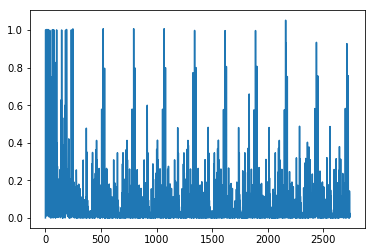

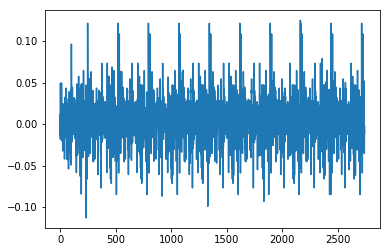

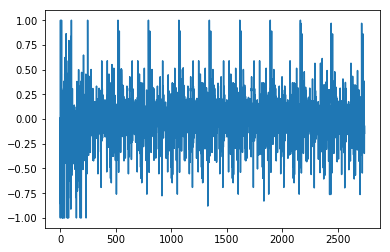

1.05061192393
[ 0.          0.11111111  0.88888889  0.55555556  0.88888889  0.66666667
  0.          0.88888889  0.55555556  0.88888889  0.66666667  0.77777778
  0.88888889  0.88888889  0.88888889  0.66666667  0.66666667  0.88888889
  0.66666667  0.66666667  0.77777778  0.88888889  0.66666667  0.88888889
  0.66666667  0.88888889  0.66666667  0.55555556  0.88888889  0.66666667
  0.          0.66666667  0.77777778  0.88888889  0.66666667  0.44444444
  0.66666667  0.77777778  0.88888889  0.88888889  0.66666667  0.66666667
  0.66666667  0.66666667  0.88888889  0.88888889  0.66666667  0.55555556
  0.          0.88888889  0.66666667  0.          0.          0.11111111
  0.44444444  0.55555556  0.88888889  0.66666667  0.66666667]
Writing away results
1977-05-01 00:00:00


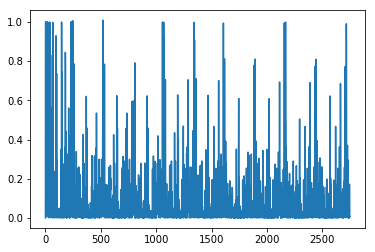

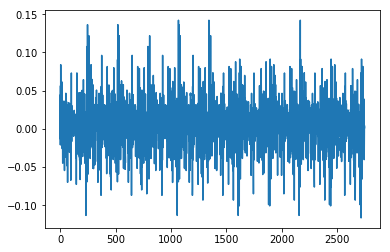

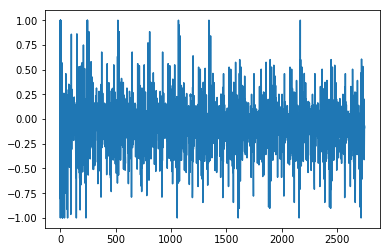

1.07389896262
[ 0.44444444  0.66666667  0.77777778  0.66666667  0.88888889  0.44444444
  0.66666667  0.77777778  0.44444444  0.66666667  0.44444444  0.77777778
  0.77777778  0.66666667  0.66666667  0.77777778  0.66666667  0.66666667
  0.66666667  0.77777778  0.77777778  0.11111111  0.66666667  0.
  0.66666667  0.66666667  0.77777778  0.66666667  1.          0.33333333
  0.66666667  0.77777778  0.77777778  0.11111111  0.66666667  0.66666667
  0.77777778  1.          0.66666667  0.66666667  0.66666667  0.33333333
  0.33333333  0.          0.66666667  0.88888889  0.          0.77777778
  0.66666667  0.22222222  0.33333333  0.44444444  0.44444444  0.44444444
  0.77777778  0.77777778  0.66666667  0.88888889  0.44444444]
Writing away results
1977-06-01 00:00:00


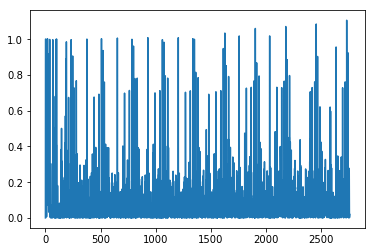

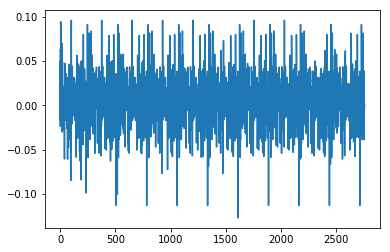

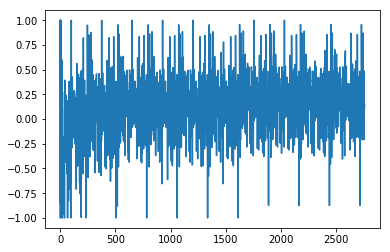

0.949031584337
[ 0.88888889  0.33333333  0.66666667  0.88888889  0.11111111  0.33333333
  0.33333333  0.66666667  0.88888889  0.33333333  0.33333333  0.66666667
  0.66666667  0.88888889  0.88888889  0.66666667  0.11111111  0.88888889
  0.33333333  0.66666667  0.88888889  0.88888889  0.88888889  0.66666667
  0.88888889  0.33333333  0.66666667  0.88888889  0.66666667  0.88888889
  0.33333333  0.66666667  0.88888889  0.11111111  0.88888889  0.33333333
  0.66666667  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.66666667  0.66666667  0.88888889  0.33333333  0.66666667  0.66666667
  0.88888889  0.11111111  0.11111111  0.11111111  0.33333333  0.33333333
  0.66666667  0.88888889  0.11111111  0.11111111  0.33333333]
Writing away results
1977-07-01 00:00:00


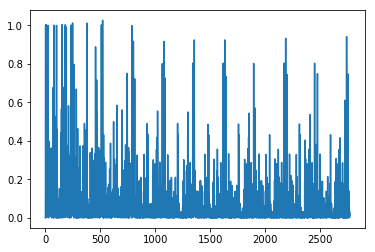

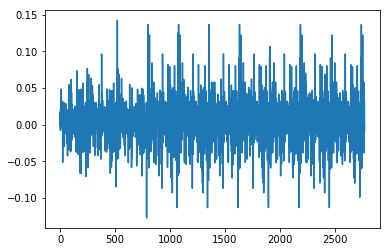

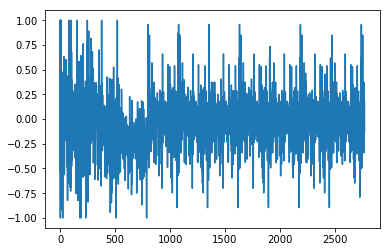

0.971787210126
[ 0.44444444  1.          0.88888889  0.55555556  0.66666667  0.77777778
  1.          0.88888889  0.55555556  0.44444444  1.          1.
  0.88888889  0.88888889  1.          0.55555556  0.88888889  0.77777778
  1.          0.88888889  0.66666667  0.88888889  1.          0.88888889
  0.44444444  1.          0.88888889  1.          0.88888889  0.77777778
  1.          0.88888889  0.55555556  0.88888889  0.55555556  1.
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  1.          0.88888889  0.33333333  0.77777778  0.66666667  0.88888889
  0.11111111  0.55555556  0.55555556  0.55555556  0.44444444  1.
  0.88888889  0.55555556  0.55555556  0.55555556  0.77777778]
Writing away results
1977-08-01 00:00:00


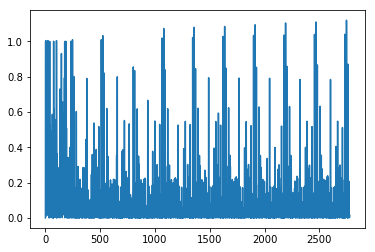

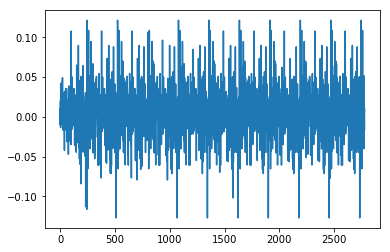

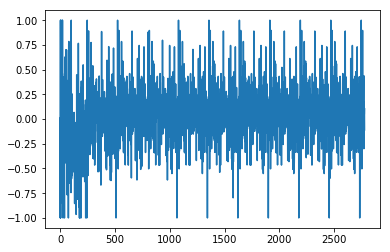

0.955072022397
[ 0.88888889  1.          0.          0.11111111  0.          0.88888889
  1.          0.11111111  0.88888889  0.88888889  0.88888889  1.          1.
  0.88888889  0.          1.          0.          0.88888889  1.          1.
  1.          0.88888889  1.          1.          0.88888889  1.          0.
  1.          0.          0.88888889  1.          0.          1.
  0.11111111  0.88888889  1.          1.          1.          1.          1.
  1.          0.88888889  1.          0.11111111  0.88888889  0.88888889
  1.          0.          0.          0.          0.11111111  0.11111111
  0.88888889  1.          0.          0.          0.11111111  0.
  0.88888889]
Writing away results
1977-09-01 00:00:00


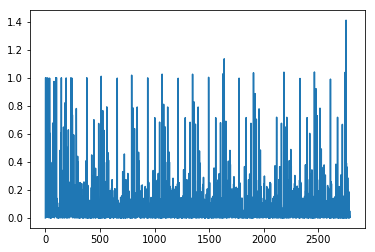

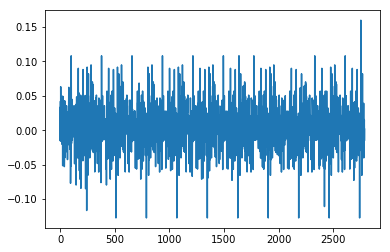

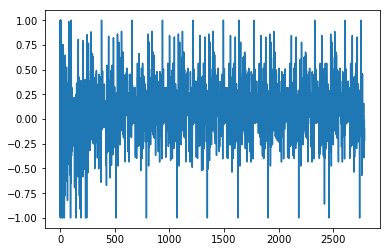

1.00966373388
[ 1.          0.11111111  0.11111111  0.11111111  0.66666667  1.
  0.11111111  0.11111111  0.66666667  1.          1.          1.
  0.66666667  1.          1.          0.11111111  0.66666667  1.          1.
  1.          0.66666667  1.          0.11111111  0.66666667  1.
  0.66666667  1.          0.11111111  0.66666667  1.          0.66666667
  1.          0.11111111  0.66666667  1.          1.          1.          1.
  1.          1.          0.66666667  1.          0.11111111  0.11111111
  0.66666667  1.          0.11111111  0.11111111  0.11111111  0.11111111
  0.11111111  0.66666667  1.          0.11111111  0.11111111  0.11111111
  0.11111111  0.66666667  1.        ]
Writing away results
1977-10-01 00:00:00


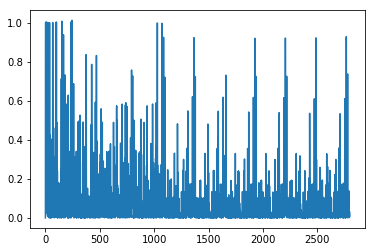

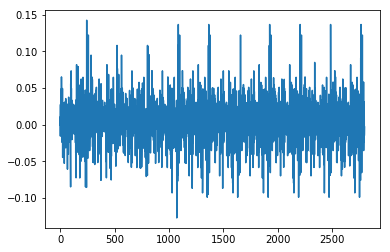

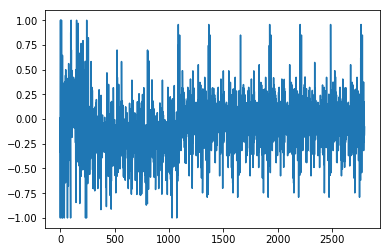

1.09310084729
[ 0.55555556  0.66666667  0.77777778  1.          0.66666667  0.55555556
  1.          1.          1.          0.66666667  1.          1.
  0.55555556  0.66666667  0.77777778  1.          1.          0.66666667
  0.77777778  1.          0.66666667  0.77777778  1.          1.          1.
  0.66666667  0.77777778  1.          1.          1.          0.66666667
  0.77777778  1.          1.          1.          1.          0.66666667
  0.66666667  1.          1.          0.66666667  0.88888889  0.77777778
  0.66666667  0.55555556  0.77777778  0.55555556  0.55555556  0.66666667
  0.77777778  1.          0.66666667  0.66666667  0.55555556  0.55555556
  0.77777778  0.55555556  0.66666667  0.66666667]
Writing away results
1977-11-01 00:00:00


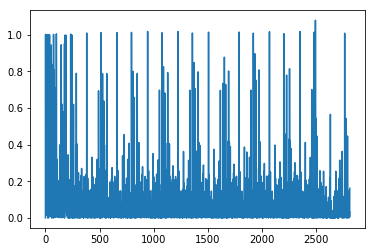

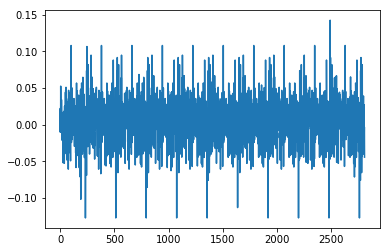

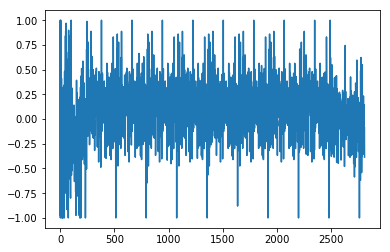

1.04538615694
[ 0.44444444  0.33333333  0.66666667  0.44444444  0.44444444  0.33333333
  1.          1.          1.          1.          0.66666667  0.66666667
  0.44444444  0.44444444  0.66666667  1.          1.          1.
  0.66666667  1.          0.33333333  1.          1.          0.66666667
  1.          0.33333333  0.66666667  1.          0.66666667  0.44444444
  0.44444444  0.66666667  1.          1.          1.          1.          1.
  1.          0.66666667  1.          0.33333333  0.33333333  1.
  0.44444444  0.44444444  0.44444444  0.44444444  0.44444444  0.33333333
  0.66666667  1.          0.44444444  0.44444444  0.44444444  0.33333333
  0.66666667  0.44444444  0.33333333  0.33333333]
Writing away results
1977-12-01 00:00:00


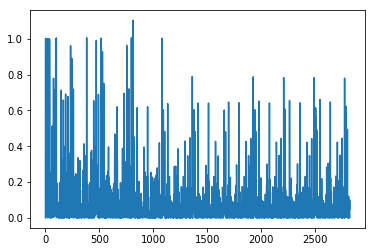

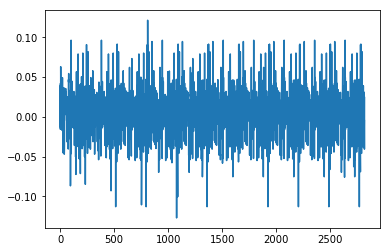

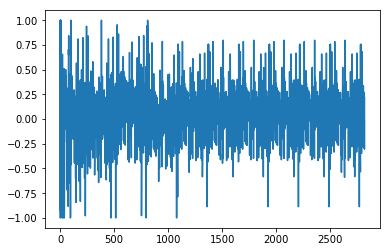

1.21638840528
[ 1.          0.66666667  0.88888889  0.55555556  1.          0.66666667
  0.66666667  0.88888889  1.          0.66666667  0.66666667  0.88888889
  0.55555556  1.          0.66666667  0.66666667  1.          0.66666667
  0.88888889  1.          0.66666667  0.66666667  0.66666667  0.88888889
  1.          0.66666667  0.66666667  0.66666667  0.88888889  0.55555556
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.88888889
  0.66666667  0.66666667  0.88888889  0.55555556  1.          0.66666667
  0.55555556  0.55555556  0.55555556  0.55555556  0.55555556  1.
  0.66666667  0.66666667  0.55555556  0.55555556  0.55555556  0.55555556
  0.66666667  0.55555556  0.88888889  1.          0.66666667]
Writing away results
1978-01-01 00:00:00


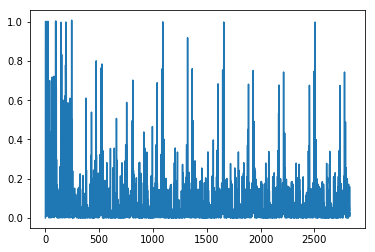

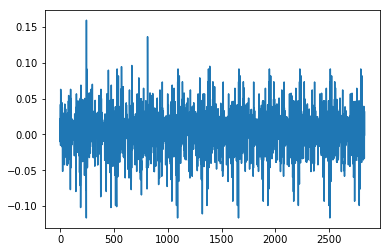

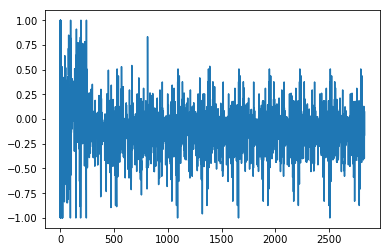

1.22607215895
[ 0.11111111  0.66666667  0.33333333  0.33333333  0.77777778  0.66666667
  0.66666667  0.33333333  0.11111111  0.66666667  0.66666667  0.77777778
  1.          0.11111111  0.66666667  0.77777778  0.66666667  0.66666667
  0.77777778  0.66666667  0.11111111  0.77777778  0.66666667  0.77777778
  0.77777778  0.77777778  0.66666667  0.66666667  0.33333333  0.66666667
  0.66666667  0.77777778  0.66666667  0.          0.          0.11111111
  0.66666667  0.22222222  1.          0.77777778  0.66666667  0.
  0.77777778  0.77777778  0.44444444  0.44444444  1.          0.77777778
  0.66666667  0.66666667  0.44444444  1.          0.11111111  0.44444444
  0.66666667  0.66666667  1.          0.66666667  0.88888889]
Writing away results
1978-02-01 00:00:00


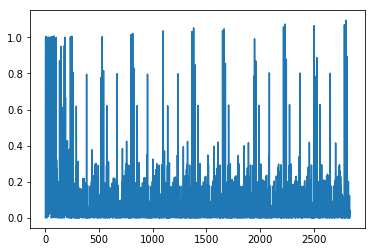

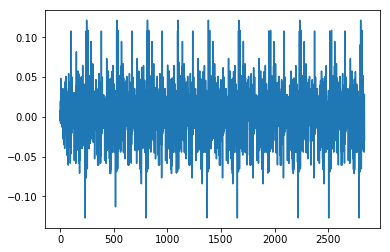

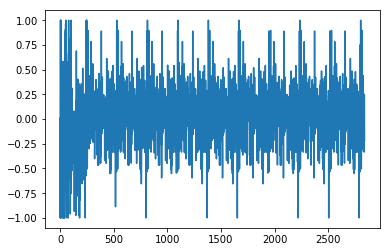

1.36762885073
[ 0.66666667  0.66666667  0.88888889  1.          1.          1.          1.
  0.88888889  0.66666667  0.66666667  0.66666667  0.88888889  1.          1.
  1.          0.88888889  1.          1.          0.88888889  1.
  0.33333333  1.          0.44444444  0.88888889  1.          0.44444444
  0.66666667  0.66666667  0.88888889  1.          1.          1.          1.
  1.          1.          0.88888889  1.          0.66666667  0.88888889
  1.          0.66666667  0.22222222  0.66666667  0.66666667  0.66666667
  0.44444444  0.88888889  1.          0.66666667  0.66666667  0.66666667
  0.44444444  0.88888889  0.66666667  0.88888889  1.          0.88888889
  1.          1.        ]
Writing away results
1978-03-01 00:00:00


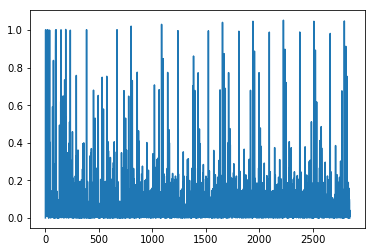

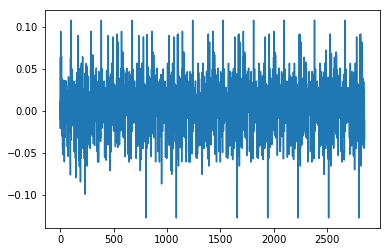

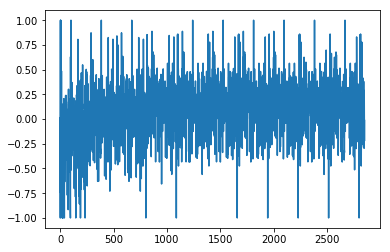

1.21798911754
[ 0.55555556  0.33333333  1.          1.          1.          1.
  0.66666667  0.55555556  0.55555556  0.55555556  0.66666667  1.          1.
  1.          0.66666667  1.          0.33333333  0.66666667  1.
  0.66666667  1.          0.33333333  0.66666667  1.          0.55555556
  1.          0.55555556  0.66666667  1.          1.          1.          1.
  1.          1.          0.66666667  1.          0.33333333  0.33333333
  0.66666667  1.          0.55555556  0.55555556  0.55555556  0.55555556
  0.33333333  0.66666667  1.          0.55555556  0.55555556  0.55555556
  0.33333333  0.66666667  0.55555556  0.66666667  0.33333333  0.66666667
  1.          1.          1.        ]
Writing away results
1978-04-01 00:00:00


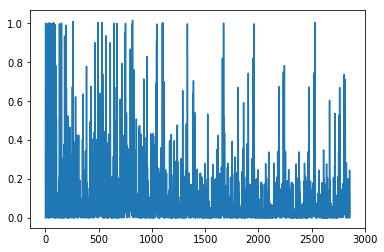

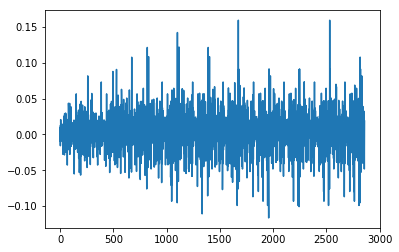

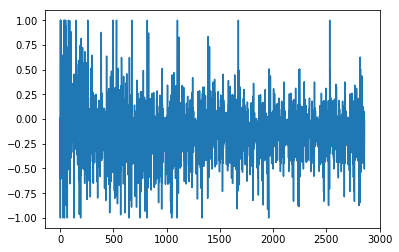

1.22851515599
[ 0.77777778  0.77777778  0.66666667  0.66666667  0.77777778  0.77777778
  0.66666667  0.66666667  0.77777778  0.77777778  0.77777778  0.66666667
  0.77777778  0.66666667  0.66666667  0.77777778  0.66666667  0.77777778
  0.77777778  0.66666667  0.77777778  0.77777778  0.77777778  0.66666667
  0.66666667  0.77777778  0.77777778  0.66666667  0.77777778  0.66666667
  0.77777778  0.77777778  0.77777778  0.66666667  0.66666667  0.11111111
  0.77777778  0.66666667  0.22222222  0.77777778  0.11111111  0.66666667
  0.66666667  0.77777778  0.77777778  0.66666667  0.66666667  0.11111111
  1.          0.77777778  0.66666667  0.66666667  1.          0.77777778
  0.66666667  0.33333333  0.66666667  0.66666667  0.66666667]
Writing away results
1978-05-01 00:00:00


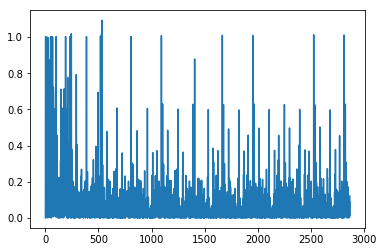

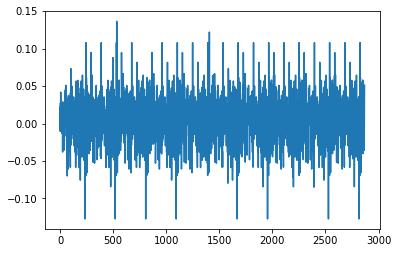

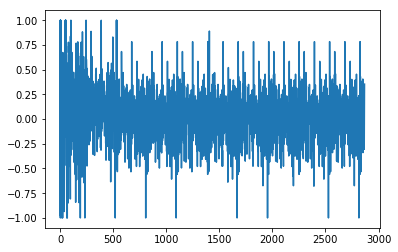

1.30620649569
[ 1.          1.          1.          1.          1.          0.
  0.66666667  0.66666667  0.44444444  1.          1.          1.
  0.44444444  1.          0.55555556  1.          1.          0.44444444
  1.          0.55555556  0.44444444  1.          0.44444444  0.66666667
  0.66666667  0.44444444  1.          1.          1.          1.          1.
  1.          1.          0.66666667  0.66666667  0.55555556  1.
  0.66666667  0.22222222  0.66666667  0.66666667  0.66666667  0.55555556
  0.44444444  1.          0.66666667  0.66666667  0.66666667  0.22222222
  0.44444444  0.66666667  0.66666667  0.55555556  1.          1.          1.
  1.          1.          1.        ]
Writing away results
1978-06-01 00:00:00


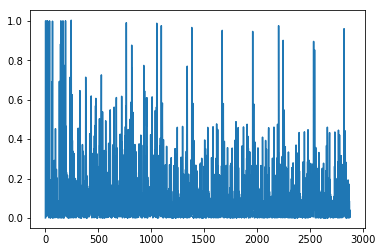

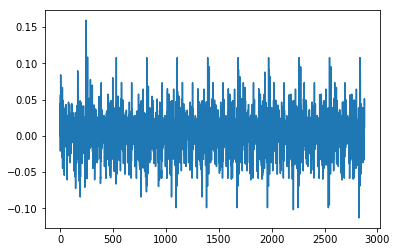

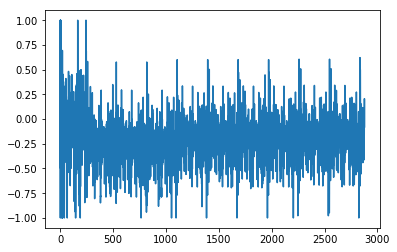

1.3664185755
[ 0.77777778  0.77777778  0.77777778  0.77777778  0.66666667  0.66666667
  0.11111111  0.88888889  0.77777778  0.88888889  0.77777778  0.88888889
  0.66666667  0.77777778  0.77777778  0.77777778  0.          0.66666667
  0.77777778  0.77777778  0.77777778  0.66666667  0.66666667  0.77777778
  0.77777778  0.77777778  0.77777778  0.77777778  0.77777778  0.77777778
  0.77777778  0.88888889  0.66666667  0.66666667  0.77777778  0.22222222
  0.55555556  0.11111111  0.66666667  0.66666667  0.66666667  0.66666667
  0.77777778  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.77777778  0.77777778  0.77777778
  0.77777778  0.77777778  0.77777778  0.77777778  0.77777778]
Writing away results
1978-07-01 00:00:00


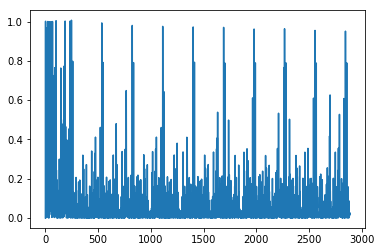

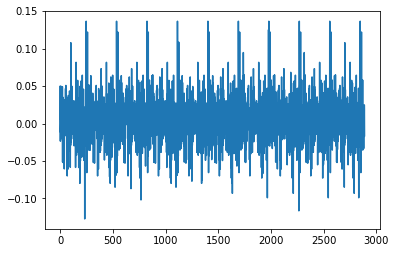

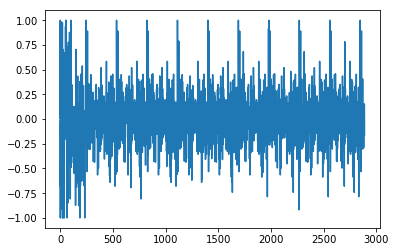

1.40847485208
[ 0.66666667  1.          1.          0.11111111  0.66666667  0.33333333
  1.          1.          1.          1.          1.          0.66666667
  0.55555556  1.          1.          0.11111111  0.66666667  0.22222222
  1.          1.          0.11111111  0.66666667  0.55555556  1.          1.
  1.          1.          1.          1.          1.          1.
  0.66666667  0.55555556  0.22222222  1.          0.11111111  0.77777778
  0.11111111  0.11111111  0.33333333  0.55555556  1.          0.66666667
  0.11111111  0.11111111  0.55555556  0.22222222  0.66666667  0.66666667
  0.55555556  1.          1.          1.          1.          1.          1.
  1.          1.          1.        ]
Writing away results
1978-08-01 00:00:00


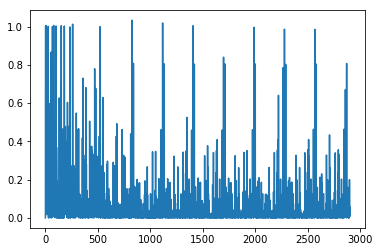

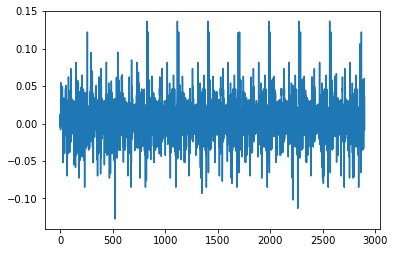

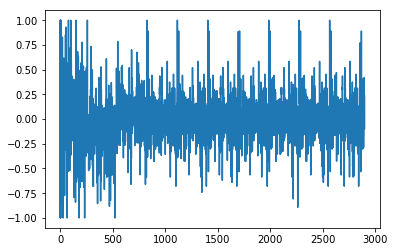

1.25380708445
[ 0.66666667  1.          0.66666667  0.66666667  0.          1.
  0.66666667  0.66666667  0.66666667  1.          0.66666667  0.77777778
  1.          0.66666667  0.          0.66666667  0.          1.
  0.66666667  0.          0.66666667  0.77777778  1.          0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  1.
  0.66666667  0.          1.          0.66666667  0.          0.          0.
  0.          0.11111111  1.          1.          0.66666667  0.          0.
  0.11111111  1.          0.88888889  0.          1.          1.          1.
  0.66666667  1.          0.66666667  0.66666667  1.          0.66666667
  0.66666667  0.66666667]
Writing away results
1978-09-01 00:00:00


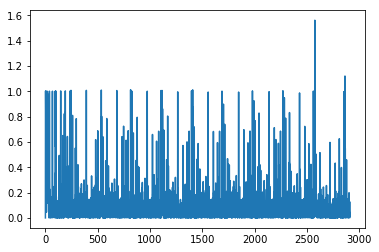

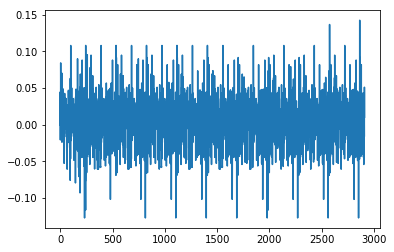

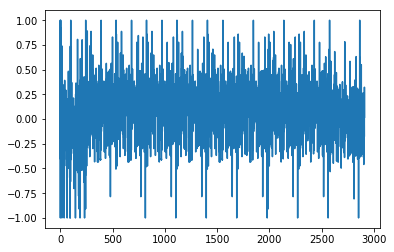

1.33033177365
[ 1.          0.44444444  0.44444444  0.88888889  0.88888889  1.          1.
  1.          0.66666667  1.          0.88888889  1.          1.
  0.66666667  1.          0.88888889  0.88888889  1.          0.66666667
  1.          0.88888889  0.88888889  1.          1.          1.          1.
  1.          1.          0.66666667  1.          0.88888889  0.88888889
  1.          0.44444444  0.66666667  0.44444444  0.44444444  0.44444444
  0.88888889  0.66666667  1.          0.44444444  0.44444444  0.88888889
  0.88888889  0.66666667  0.44444444  0.88888889  0.88888889  1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.        ]
Writing away results
1978-10-01 00:00:00


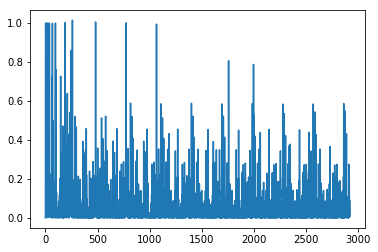

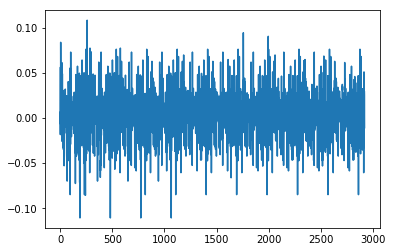

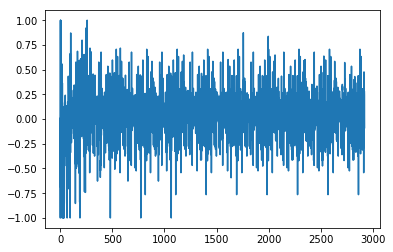

1.39380785374
[ 0.55555556  0.66666667  0.          0.55555556  0.55555556  0.66666667
  0.66666667  0.55555556  0.66666667  1.          0.55555556  0.66666667
  0.55555556  0.66666667  0.11111111  0.55555556  0.66666667  0.55555556
  0.66666667  0.11111111  0.55555556  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.55555556  0.55555556  0.66666667  1.
  0.55555556  0.55555556  0.66666667  0.          0.          0.          0.
  1.          0.55555556  0.66666667  0.66666667  0.          0.          0.
  0.55555556  0.66666667  1.          1.          0.55555556  0.66666667
  0.55555556  0.66666667  0.66666667  0.55555556  0.66666667  0.55555556
  0.55555556  0.66666667  0.55555556]
Writing away results
1978-11-01 00:00:00


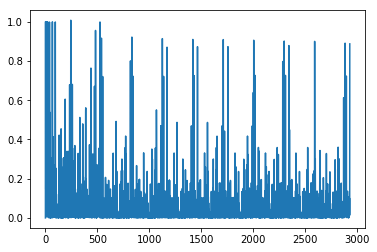

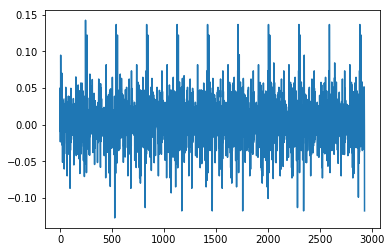

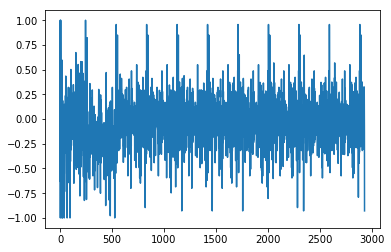

1.52857650977
[ 0.66666667  0.11111111  1.          1.          0.66666667  0.77777778
  1.          0.66666667  0.77777778  1.          1.          0.77777778
  0.66666667  0.22222222  1.          0.88888889  0.44444444  0.66666667
  0.22222222  1.          1.          1.          1.          0.66666667
  0.66666667  1.          1.          0.66666667  0.44444444  0.77777778
  0.66666667  0.44444444  0.11111111  0.11111111  0.44444444  0.44444444
  0.22222222  1.          0.66666667  0.44444444  0.11111111  0.44444444
  0.77777778  0.          0.44444444  1.          1.          1.          1.
  1.          0.66666667  0.66666667  1.          1.          1.          1.
  0.66666667  0.66666667  0.44444444]
Writing away results
1978-12-01 00:00:00


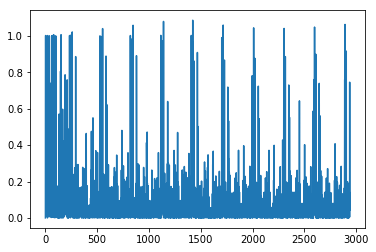

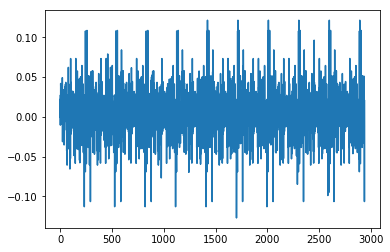

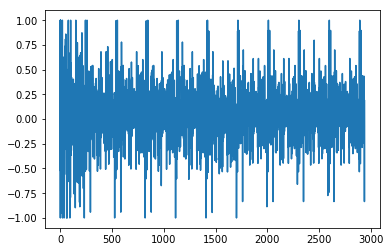

1.48714391778
[ 0.66666667  1.          0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.          0.88888889  0.88888889  0.          0.66666667
  1.          0.88888889  0.88888889  0.          0.66666667  1.
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.66666667  1.          0.          0.88888889
  0.66666667  0.          0.66666667  0.66666667  0.66666667  1.          0.
  0.88888889  0.66666667  0.66666667  0.66666667  0.          0.66666667
  0.66666667  1.          0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.66666667  0.66666667  0.        ]
Writing away results
1979-01-01 00:00:00


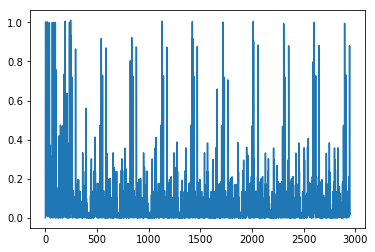

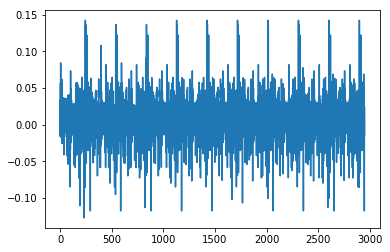

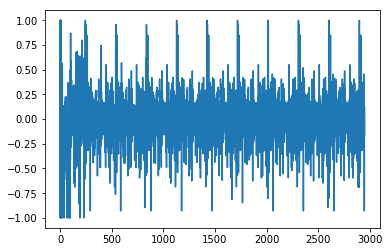

1.46228946762
[ 1.          1.          1.          1.          1.          0.66666667
  0.44444444  1.          1.          0.          0.66666667  0.55555556
  1.          0.66666667  0.88888889  0.88888889  0.88888889  1.          1.
  1.          1.          0.66666667  0.66666667  1.          1.
  0.66666667  0.          0.          0.66666667  0.88888889  0.
  0.88888889  0.88888889  0.88888889  1.          1.          0.66666667
  0.88888889  0.88888889  0.88888889  0.          0.11111111  0.88888889
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          0.66666667  0.66666667
  0.88888889  0.          0.66666667]
Writing away results
1979-02-01 00:00:00


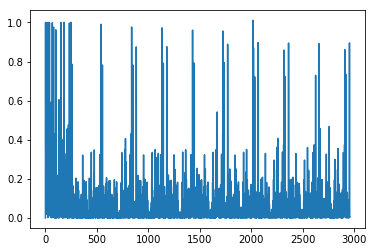

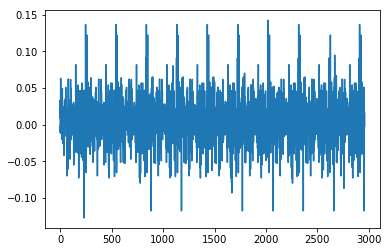

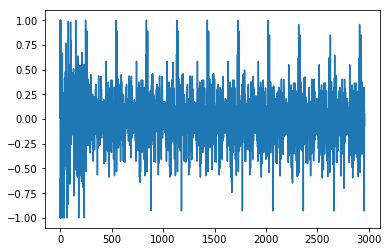

1.59804357236
[ 1.          1.          0.          1.          1.          0.66666667
  1.          1.          0.          0.55555556  0.44444444  1.          1.
  0.          0.55555556  0.44444444  1.          1.          1.          1.
  1.          1.          1.          1.          0.55555556  0.66666667
  0.          1.          0.55555556  0.22222222  0.55555556  0.55555556
  0.55555556  0.66666667  1.          1.          0.55555556  0.55555556
  0.33333333  0.          0.          0.55555556  0.66666667  1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          0.55555556  0.55555556  0.          0.55555556
  0.55555556]
Writing away results
1979-03-01 00:00:00


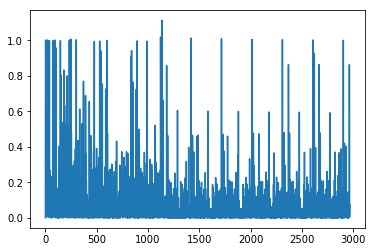

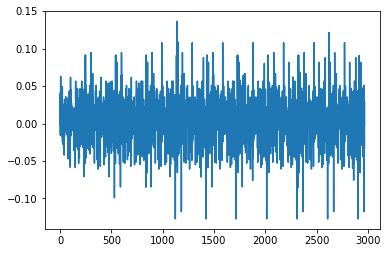

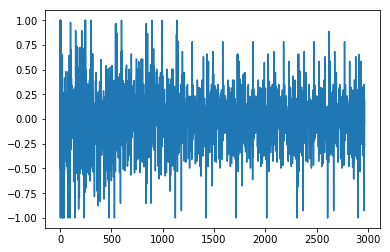

1.10700038628
[ 1.          1.          0.66666667  1.          0.22222222  1.          1.
  0.          1.          0.22222222  0.22222222  1.          0.          1.
  0.55555556  0.66666667  1.          1.          1.          1.          1.
  1.          0.66666667  0.55555556  0.22222222  0.          1.
  0.55555556  0.          0.55555556  0.55555556  0.55555556  0.22222222
  0.66666667  1.          0.55555556  0.55555556  0.55555556  0.
  0.66666667  0.55555556  0.22222222  0.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          0.55555556  0.          1.          0.55555556  0.66666667]
Writing away results
1979-04-01 00:00:00


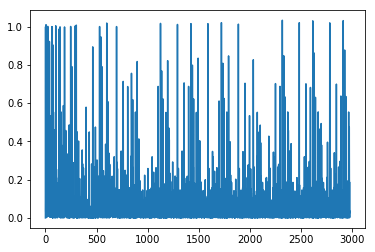

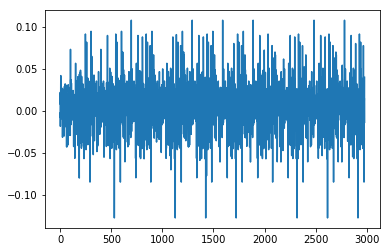

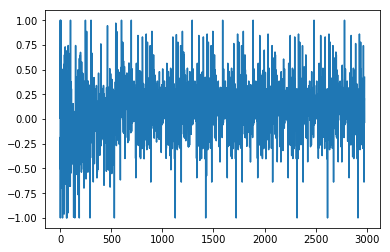

1.26352277035
[ 1.          0.66666667  1.          0.          0.66666667  0.66666667
  0.66666667  1.          0.          0.66666667  0.66666667  0.33333333
  1.          0.          0.66666667  0.66666667  0.66666667  0.66666667
  1.          0.66666667  0.66666667  0.66666667  1.          0.          0.
  0.66666667  1.          0.          0.          0.          1.          0.
  0.66666667  1.          1.          0.          0.          0.
  0.33333333  1.          0.          0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  1.          1.          0.          1.          0.
  0.          1.        ]
Writing away results
1979-05-01 00:00:00


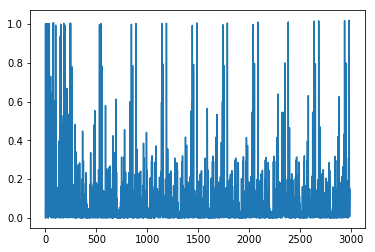

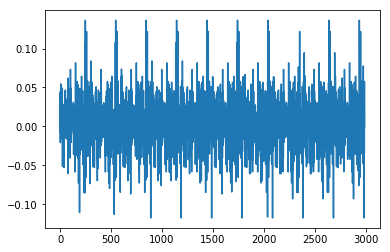

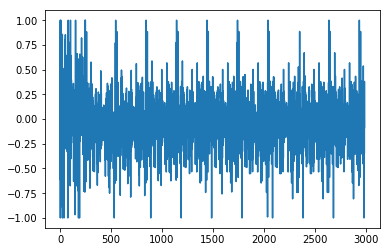

1.44899424941
[ 1.          0.66666667  0.77777778  1.          1.          0.22222222
  0.66666667  0.77777778  0.44444444  0.66666667  1.          0.66666667
  0.77777778  1.          1.          1.          1.          0.66666667
  0.66666667  1.          1.          0.66666667  0.88888889  0.77777778
  0.66666667  0.          0.11111111  0.          0.          0.66666667
  0.77777778  1.          0.66666667  0.          0.          0.77777778
  0.77777778  0.11111111  0.66666667  0.88888889  1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          0.66666667  0.66666667  0.77777778  0.66666667  0.          1.
  0.          0.11111111]
Writing away results
1979-06-01 00:00:00


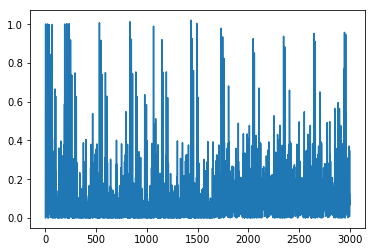

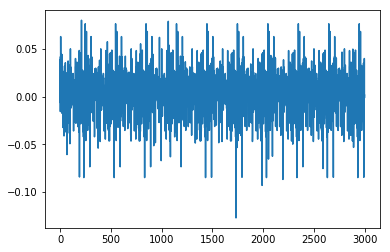

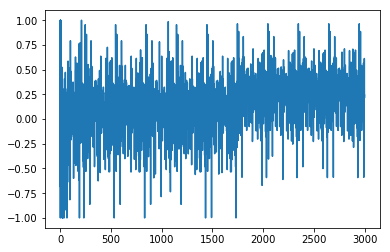

1.0924457631
[ 0.66666667  0.66666667  0.66666667  0.66666667  0.55555556  0.44444444
  0.          0.55555556  0.66666667  0.55555556  0.44444444  0.
  0.55555556  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.55555556  0.44444444  0.          0.          0.55555556
  0.44444444  0.          0.44444444  0.44444444  0.          0.
  0.55555556  0.44444444  0.44444444  0.          0.          0.
  0.55555556  0.44444444  0.          0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.55555556  0.44444444  0.          0.55555556
  0.          0.55555556  0.44444444  0.          0.        ]
Writing away results
1979-07-01 00:00:00


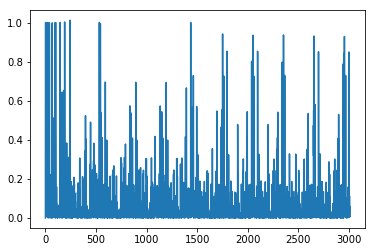

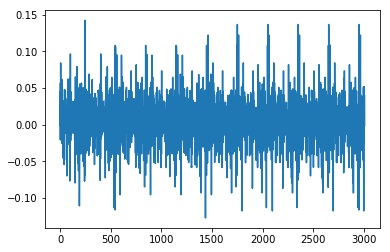

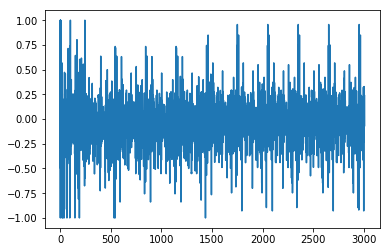

1.15391162445
[ 0.77777778  1.          0.88888889  1.          0.66666667  0.77777778
  0.77777778  0.88888889  0.66666667  0.66666667  0.77777778  1.
  0.66666667  0.88888889  1.          0.55555556  0.88888889  0.88888889
  1.          0.66666667  0.33333333  0.77777778  0.66666667  0.66666667
  0.77777778  0.          0.66666667  0.66666667  0.77777778  1.
  0.66666667  0.66666667  0.          0.77777778  0.77777778  1.
  0.66666667  0.44444444  0.77777778  1.          0.66666667  1.
  0.66666667  0.66666667  1.          0.66666667  0.88888889  1.
  0.66666667  0.66666667  0.66666667  0.77777778  0.66666667  0.44444444
  1.          0.66666667  0.66666667  0.77777778  0.77777778]
Writing away results
1979-08-01 00:00:00


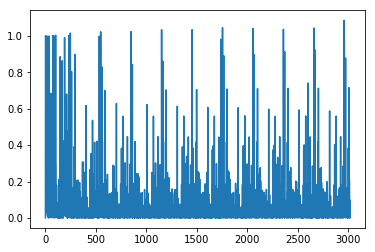

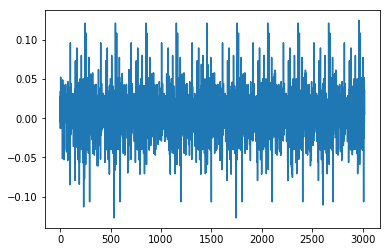

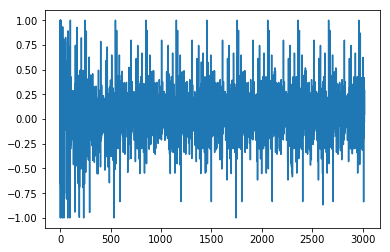

1.11515295613
[ 0.88888889  0.88888889  0.88888889  0.88888889  0.55555556  0.88888889
  0.88888889  0.11111111  0.88888889  1.          0.55555556  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  1.          1.          0.55555556  0.88888889  0.11111111  0.11111111
  0.11111111  0.11111111  1.          0.55555556  0.55555556  0.88888889
  0.11111111  0.11111111  1.          0.11111111  0.11111111  0.11111111
  1.          0.55555556  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  1.          0.11111111  0.88888889  0.11111111  0.11111111
  0.11111111  1.          1.          0.11111111  1.        ]
Writing away results
1979-09-01 00:00:00


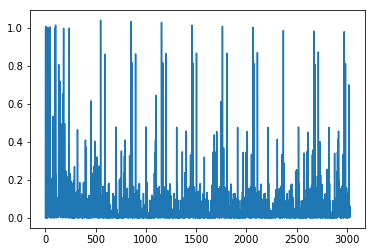

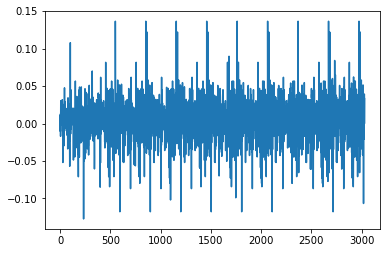

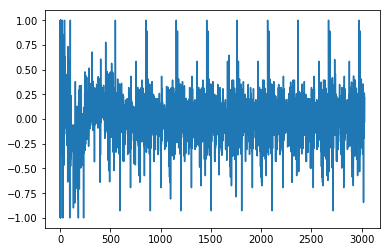

1.26005887548
[ 0.55555556  1.          0.55555556  0.66666667  1.          0.55555556
  0.11111111  1.          0.66666667  1.          1.          0.55555556
  1.          0.55555556  0.55555556  0.55555556  1.          0.55555556
  0.66666667  0.          1.          0.55555556  0.          0.11111111
  0.11111111  0.66666667  0.66666667  1.          0.55555556  0.11111111
  0.11111111  0.66666667  0.66666667  1.          0.11111111  1.
  0.66666667  1.          0.55555556  1.          0.55555556  0.55555556
  1.          0.55555556  0.55555556  1.          0.55555556  1.
  0.55555556  0.          1.          0.11111111  1.          0.11111111
  0.11111111  0.66666667  0.          0.11111111  0.11111111]
Writing away results
1979-10-01 00:00:00


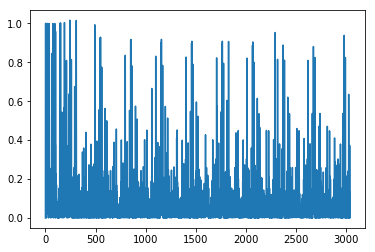

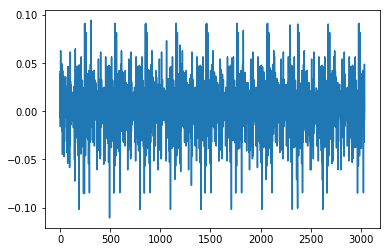

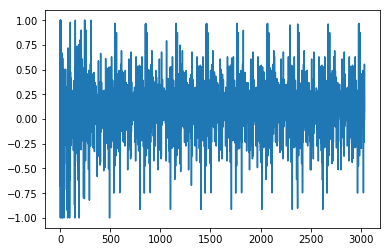

1.3943935049
[ 0.66666667  0.55555556  0.88888889  0.66666667  0.66666667  0.
  0.55555556  0.88888889  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.55555556  0.88888889
  0.          0.66666667  0.55555556  0.          0.55555556  0.55555556
  0.55555556  0.88888889  0.66666667  0.66666667  0.55555556  0.55555556
  0.55555556  0.          0.          0.55555556  0.88888889  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.55555556  0.55555556
  0.          0.55555556  0.55555556  0.          0.55555556  0.55555556
  0.55555556  0.          0.55555556  0.55555556  0.88888889]
Writing away results
1979-11-01 00:00:00


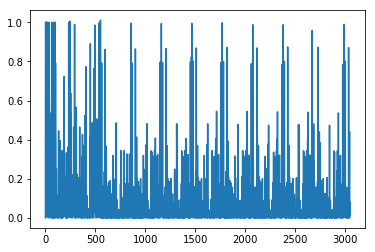

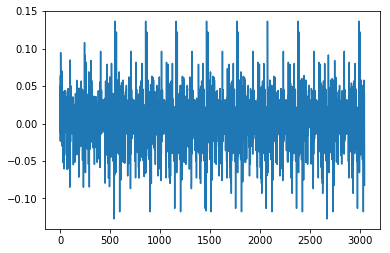

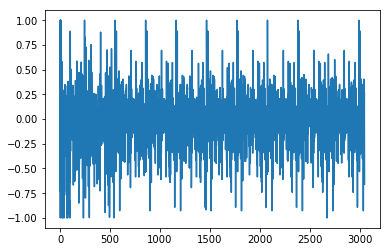

1.11826771484
[ 0.88888889  0.11111111  0.66666667  0.88888889  1.          0.88888889
  0.11111111  1.          1.          0.66666667  1.          0.88888889
  0.66666667  1.          1.          0.88888889  0.11111111  0.77777778
  1.          0.88888889  0.77777778  0.          0.11111111  0.11111111
  0.11111111  1.          1.          0.88888889  0.11111111  0.11111111
  0.11111111  1.          0.88888889  0.66666667  0.33333333  1.          1.
  1.          1.          1.          1.          1.          1.          1.
  0.88888889  0.88888889  0.88888889  0.11111111  0.88888889  0.11111111
  1.          0.11111111  0.11111111  0.11111111  0.          0.88888889
  0.11111111  0.66666667  0.66666667]
Writing away results
1979-12-01 00:00:00


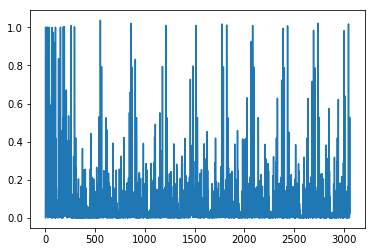

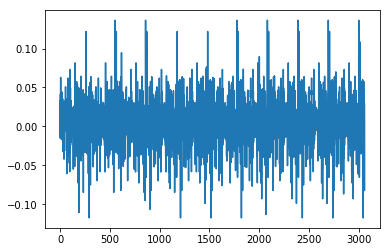

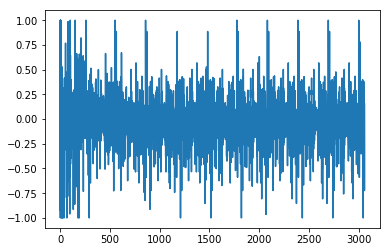

1.32857936298
[ 0.77777778  0.55555556  0.66666667  1.          0.66666667  0.77777778
  1.          1.          0.66666667  0.66666667  0.66666667  0.66666667
  1.          1.          0.66666667  0.77777778  0.          0.66666667
  0.11111111  0.          0.          0.          0.77777778  0.55555556
  1.          0.66666667  0.11111111  0.77777778  0.77777778  0.          0.
  0.66666667  0.55555556  1.          1.          1.          1.
  0.66666667  0.66666667  1.          0.66666667  1.          1.
  0.66666667  0.66666667  0.11111111  0.55555556  0.66666667  0.11111111
  1.          0.11111111  0.77777778  0.          0.          0.66666667
  0.11111111  1.          1.          1.        ]
Writing away results
1980-01-01 00:00:00


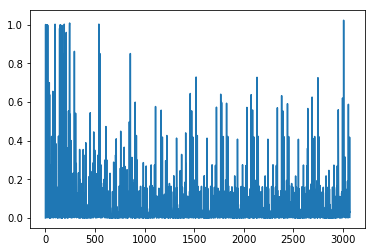

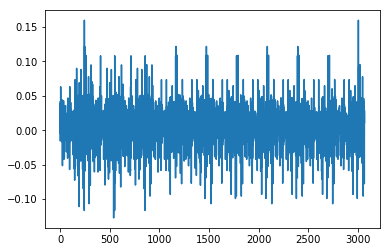

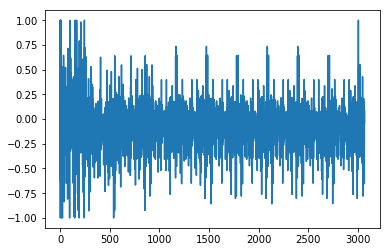

1.17590521714
[ 0.77777778  0.          0.66666667  0.66666667  0.77777778  0.88888889
  0.88888889  0.77777778  0.55555556  0.          0.77777778  0.77777778
  0.66666667  0.66666667  1.          0.77777778  0.66666667  0.44444444
  1.          0.66666667  0.66666667  0.66666667  0.88888889  0.77777778
  0.66666667  0.66666667  0.66666667  1.          0.77777778  0.66666667
  0.66666667  0.88888889  0.77777778  0.66666667  0.88888889  0.88888889
  0.66666667  0.88888889  0.77777778  0.88888889  0.77777778  0.66666667
  0.          0.66666667  0.66666667  1.          0.66666667  0.88888889
  0.66666667  0.66666667  0.66666667  1.          0.          0.66666667
  0.88888889  0.77777778  0.77777778  0.66666667  0.66666667]
Writing away results
1980-02-01 00:00:00


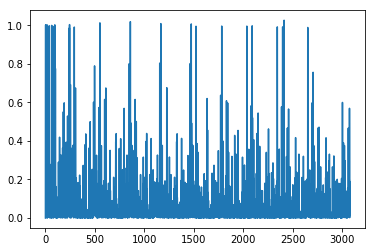

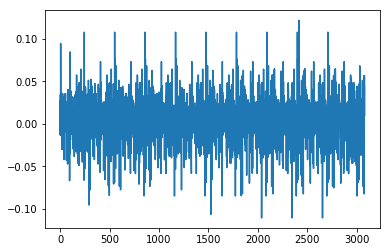

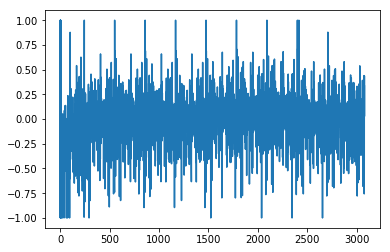

1.24030281596
[ 0.55555556  0.55555556  0.66666667  1.          1.          0.55555556
  0.55555556  0.55555556  0.66666667  1.          0.55555556  0.55555556
  0.66666667  1.          0.          0.55555556  0.66666667  0.88888889
  0.66666667  0.66666667  0.66666667  1.          0.55555556  0.66666667
  0.66666667  0.66666667  0.66666667  0.          0.55555556  0.66666667
  1.          1.          0.55555556  1.          0.55555556  0.66666667
  0.66666667  0.55555556  1.          0.55555556  0.55555556  0.66666667
  0.55555556  0.66666667  0.          0.66666667  0.66666667  0.55555556
  0.66666667  0.66666667  0.66666667  0.          0.66666667  0.66666667
  1.          1.          0.55555556  0.66666667  0.66666667]
Writing away results
1980-03-01 00:00:00


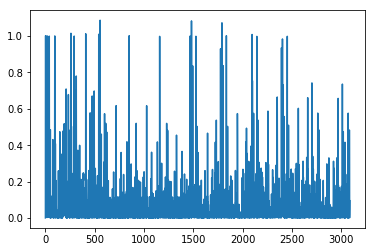

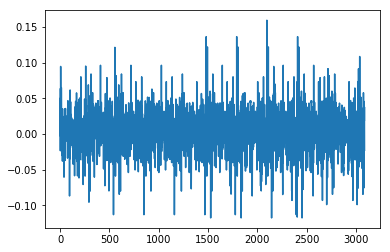

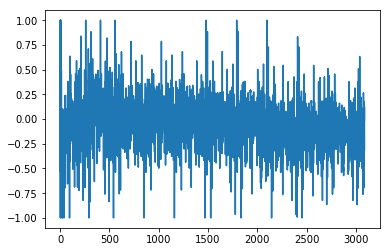

1.39089660935
[ 0.66666667  0.66666667  0.77777778  0.88888889  0.66666667  0.66666667
  0.66666667  0.33333333  0.77777778  0.55555556  0.66666667  0.66666667
  0.          0.77777778  0.66666667  1.          0.77777778  0.44444444
  0.44444444  0.44444444  0.77777778  0.77777778  0.66666667  0.66666667
  0.44444444  0.44444444  0.77777778  0.66666667  0.88888889  0.77777778
  0.77777778  0.66666667  0.88888889  0.66666667  0.66666667  0.88888889
  0.66666667  0.88888889  1.          0.66666667  0.66666667  0.66666667
  0.44444444  0.77777778  0.66666667  0.44444444  0.88888889  0.44444444
  0.44444444  0.44444444  0.77777778  0.66666667  0.44444444  0.77777778
  0.88888889  0.66666667  0.66666667  0.88888889  0.88888889]
Writing away results
1980-04-01 00:00:00


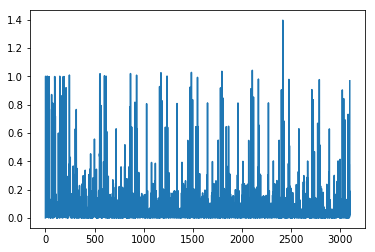

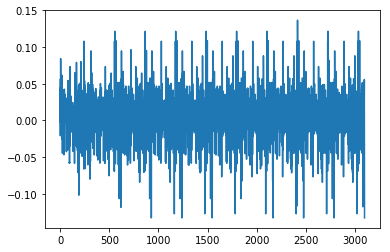

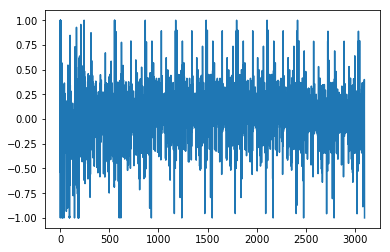

1.29473697605
[ 1.          0.66666667  0.88888889  0.88888889  0.88888889  0.88888889
  1.          1.          0.88888889  0.88888889  1.          0.33333333
  0.33333333  0.88888889  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.33333333  0.88888889  0.88888889  0.66666667  0.66666667
  0.66666667  0.33333333  0.88888889  0.66666667  1.          0.33333333
  0.88888889  1.          0.88888889  1.          1.          0.88888889
  1.          0.88888889  0.88888889  1.          0.88888889  1.
  0.33333333  1.          0.66666667  0.88888889  0.66666667  0.66666667
  0.66666667  0.          1.          0.66666667  1.          0.33333333
  0.88888889  1.          1.          1.          0.88888889]
Writing away results
1980-05-01 00:00:00


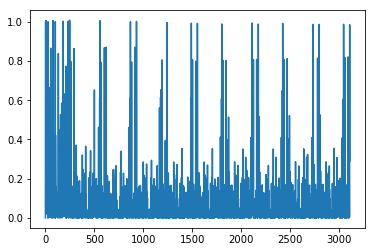

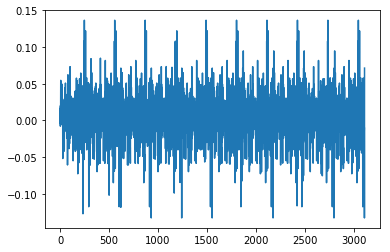

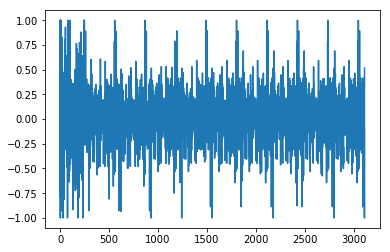

1.31606032432
[ 0.22222222  1.          1.          1.          1.          0.44444444
  1.          1.          1.          0.66666667  0.22222222  0.11111111
  1.          0.66666667  0.22222222  0.44444444  0.66666667  0.66666667
  1.          1.          0.66666667  0.66666667  0.66666667  0.66666667
  0.11111111  0.44444444  0.66666667  1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  0.44444444  0.66666667  0.66666667  0.11111111  0.66666667  0.66666667
  1.          0.66666667  0.66666667  0.22222222  0.44444444  0.66666667
  0.66666667  1.          1.          1.          0.66666667  0.66666667
  1.          1.          1.        ]
Writing away results
1980-06-01 00:00:00


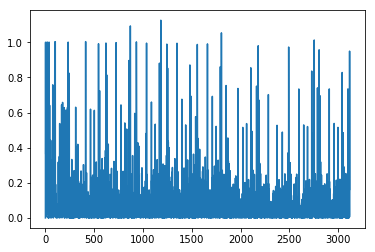

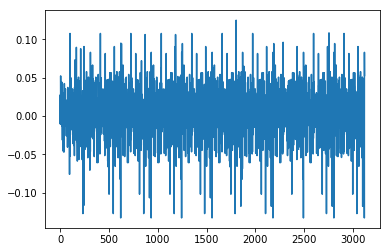

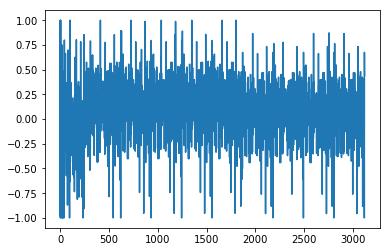

1.46618825411
[ 0.88888889  1.          1.          1.          1.          1.
  0.22222222  0.22222222  0.55555556  0.88888889  0.22222222  1.
  0.55555556  0.22222222  0.55555556  0.55555556  0.55555556  0.88888889
  0.22222222  1.          0.55555556  0.55555556  0.55555556  0.88888889
  0.22222222  0.55555556  0.88888889  0.88888889  1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          0.55555556  0.22222222  1.          0.55555556  0.22222222
  0.55555556  0.55555556  0.55555556  0.22222222  0.55555556  0.55555556
  1.          0.88888889  1.          1.          0.55555556  1.
  0.88888889  1.          1.        ]
Writing away results
1980-07-01 00:00:00


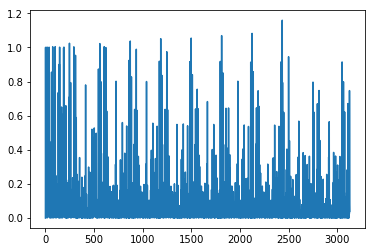

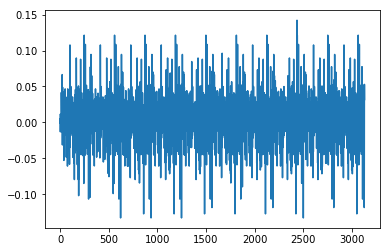

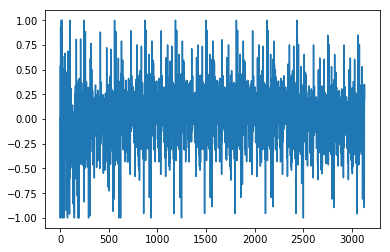

1.3030956331
[ 0.88888889  0.88888889  0.88888889  1.          1.          0.88888889
  0.88888889  1.          0.22222222  0.66666667  0.88888889  1.
  0.22222222  0.22222222  0.22222222  1.          0.66666667  0.88888889
  0.88888889  1.          0.22222222  0.22222222  0.22222222  0.88888889
  1.          1.          0.66666667  0.88888889  1.          0.88888889
  1.          1.          0.88888889  1.          0.88888889  0.88888889
  1.          0.88888889  1.          0.22222222  1.          0.22222222
  0.88888889  1.          0.22222222  0.22222222  0.22222222  1.
  0.22222222  0.66666667  0.66666667  0.88888889  1.          1.          1.
  0.66666667  0.88888889  1.          1.        ]
Writing away results
1980-08-01 00:00:00


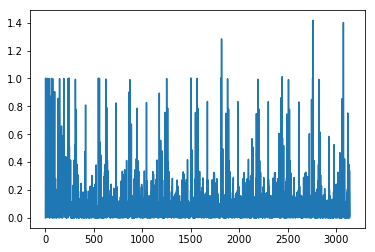

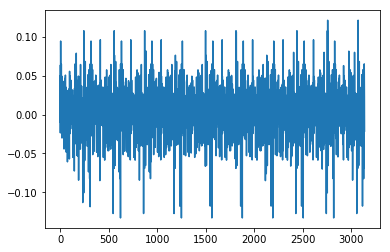

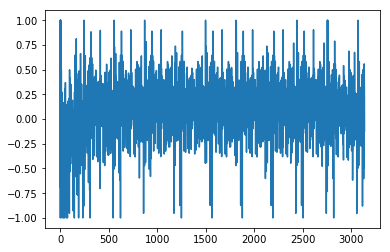

1.36855181597
[ 1.          1.          1.          0.88888889  1.          0.55555556
  0.88888889  0.66666667  0.          0.55555556  0.66666667  0.55555556
  0.66666667  0.66666667  0.66666667  0.          0.55555556  0.55555556
  0.66666667  0.66666667  0.66666667  0.          0.55555556  0.66666667
  0.88888889  1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          0.88888889
  0.66666667  0.55555556  0.88888889  0.66666667  0.55555556  0.66666667
  0.66666667  0.66666667  0.55555556  0.88888889  0.66666667  0.88888889
  1.          0.55555556  1.          0.88888889  1.          1.          1.
  1.          0.88888889  1.        ]
Writing away results
1980-09-01 00:00:00


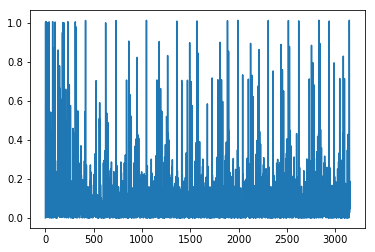

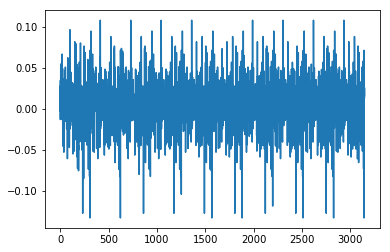

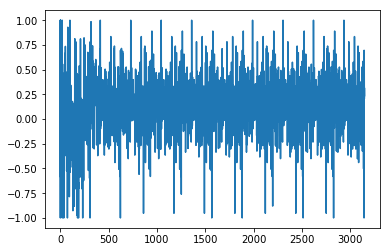

1.24708799582
[ 1.          1.          1.          1.          0.55555556  1.
  0.22222222  0.22222222  1.          0.44444444  0.44444444  0.44444444
  0.44444444  0.66666667  0.22222222  0.55555556  1.          0.44444444
  0.44444444  0.22222222  0.22222222  0.55555556  0.44444444  0.66666667
  0.22222222  1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          0.44444444  1.
  0.22222222  1.          0.22222222  0.55555556  0.44444444  0.44444444
  0.22222222  0.44444444  0.44444444  0.22222222  0.55555556  0.22222222
  0.55555556  1.          0.55555556  1.          0.22222222  1.          1.
  1.          0.22222222  1.        ]
Writing away results
1980-10-01 00:00:00


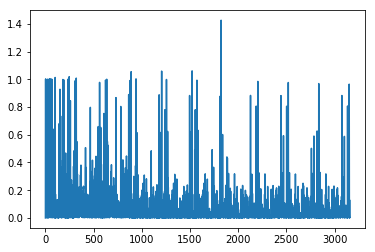

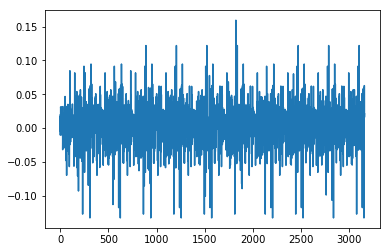

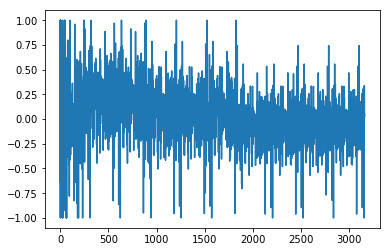

1.14989824032
[ 0.55555556  1.          1.          0.66666667  0.55555556  0.
  0.22222222  0.66666667  0.          0.          0.          0.
  0.55555556  1.          0.66666667  0.66666667  0.          0.          0.
  0.          0.66666667  0.          0.55555556  1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  0.55555556  0.66666667  0.55555556  0.          0.55555556  0.
  0.66666667  0.          0.          0.          0.          0.55555556
  0.          1.          1.          0.66666667  0.55555556  0.55555556
  1.          1.          1.          0.55555556  1.          1.          1.
  0.55555556]
Writing away results
1980-11-01 00:00:00


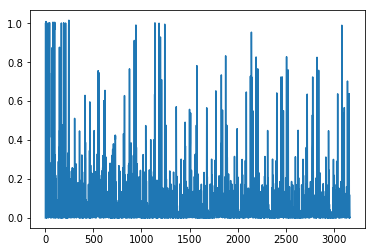

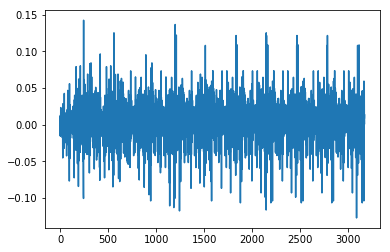

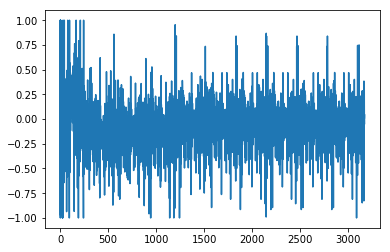

1.17305853468
[ 0.77777778  0.77777778  0.66666667  0.66666667  0.44444444  0.77777778
  0.66666667  0.66666667  0.33333333  0.          0.66666667  0.66666667
  0.44444444  0.88888889  0.66666667  0.66666667  0.66666667  0.66666667
  0.77777778  0.66666667  0.66666667  0.88888889  0.77777778  0.88888889
  0.77777778  0.88888889  0.66666667  0.66666667  0.88888889  0.88888889
  0.77777778  0.88888889  0.          0.66666667  0.66666667  0.22222222
  0.66666667  0.22222222  0.66666667  0.66666667  0.66666667  0.77777778
  0.          0.66666667  0.66666667  0.88888889  0.77777778  0.88888889
  0.66666667  0.66666667  0.88888889  0.77777778  0.66666667  0.66666667
  0.66666667  0.77777778  0.88888889  0.66666667  0.66666667]
Writing away results
1980-12-01 00:00:00


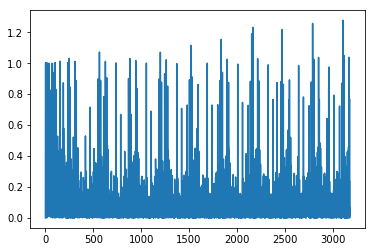

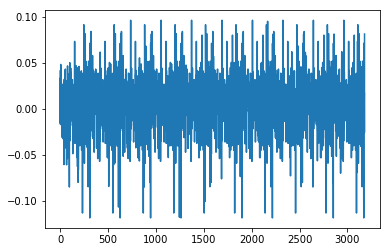

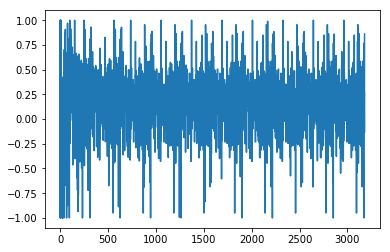

1.22183401632
[ 0.88888889  0.88888889  0.88888889  0.11111111  0.66666667  0.88888889
  0.44444444  0.11111111  0.44444444  0.44444444  0.11111111  0.66666667
  0.66666667  0.88888889  0.44444444  0.11111111  0.11111111  0.66666667
  0.44444444  0.44444444  0.11111111  0.66666667  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.11111111  0.66666667  0.88888889
  0.11111111  0.66666667  0.44444444  0.11111111  0.11111111  0.44444444
  0.11111111  0.11111111  0.66666667  0.88888889  0.88888889  0.88888889
  0.11111111  0.88888889  0.66666667  0.88888889  0.88888889  0.88888889
  0.66666667  0.88888889  0.88888889  0.44444444  0.11111111]
Writing away results
1981-01-01 00:00:00


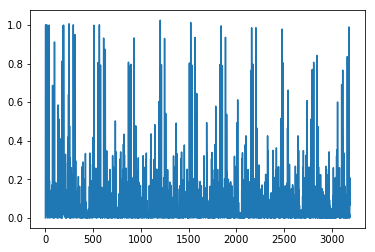

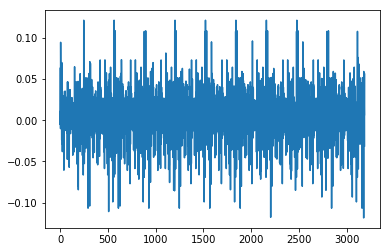

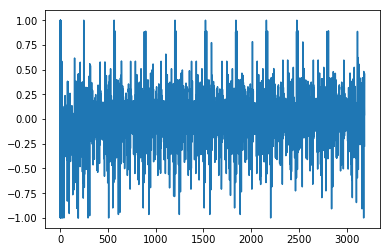

1.5732045703
[ 0.88888889  0.66666667  0.22222222  0.          0.66666667  0.66666667
  0.          0.66666667  0.66666667  0.66666667  0.22222222  0.88888889
  0.66666667  0.66666667  0.66666667  0.22222222  0.          0.
  0.66666667  0.22222222  0.77777778  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.66666667  0.66666667  0.66666667  0.          0.66666667  0.
  0.88888889  0.66666667  0.66666667  0.          0.          0.66666667
  0.66666667  0.22222222  0.          0.88888889  0.66666667  0.88888889
  0.88888889  0.88888889  0.88888889  0.66666667  0.66666667  0.88888889
  0.88888889  0.66666667  0.66666667  0.66666667  0.22222222]
Writing away results
1981-02-01 00:00:00


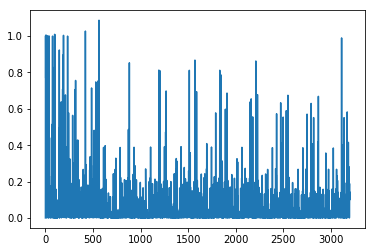

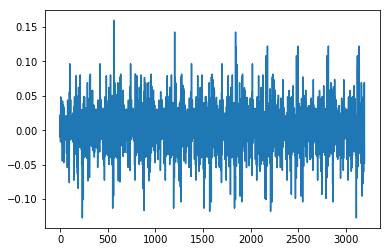

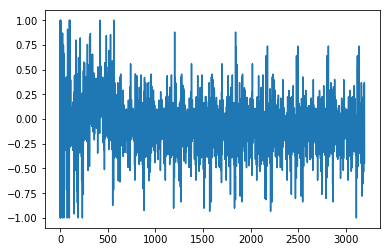

1.38190828429
[ 0.66666667  0.          0.77777778  0.66666667  0.66666667  0.77777778
  0.66666667  0.66666667  0.66666667  1.          1.          0.66666667
  0.66666667  0.66666667  0.66666667  1.          0.66666667  0.66666667
  0.66666667  1.          1.          0.77777778  1.          0.66666667
  1.          0.77777778  1.          0.77777778  0.77777778  0.55555556
  0.66666667  0.66666667  1.          0.66666667  0.55555556  0.66666667
  0.66666667  0.66666667  0.          0.77777778  0.66666667  0.66666667
  1.          1.          0.66666667  0.66666667  0.66666667  1.
  0.77777778  1.          0.66666667  0.66666667  1.          1.
  0.66666667  0.66666667  0.66666667  1.          1.        ]
Writing away results
1981-03-01 00:00:00


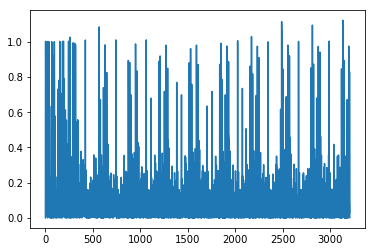

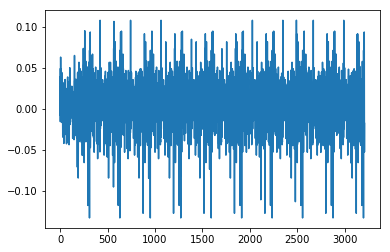

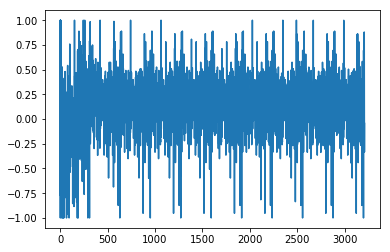

1.39569665982
[ 0.66666667  0.66666667  1.          0.44444444  0.44444444  0.44444444
  0.44444444  0.33333333  0.66666667  0.66666667  1.          0.44444444
  0.44444444  0.66666667  0.66666667  0.44444444  0.44444444  0.66666667
  0.66666667  1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.
  0.66666667  1.          0.44444444  0.66666667  0.44444444  0.44444444
  0.66666667  0.44444444  0.44444444  0.44444444  0.66666667  0.66666667
  1.          1.          0.66666667  1.          0.66666667  1.          1.
  1.          0.66666667  1.          1.          0.44444444  1.
  0.66666667  0.66666667  1.        ]
Writing away results
1981-04-01 00:00:00


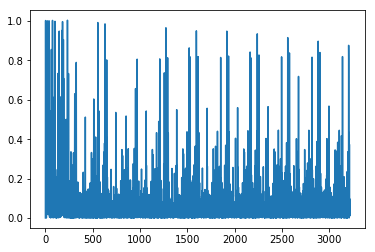

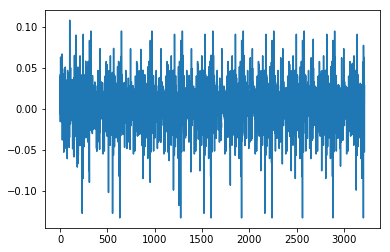

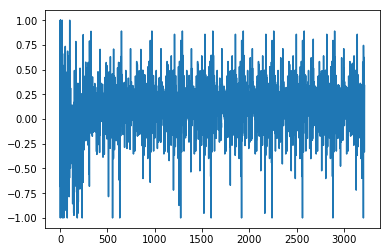

1.66503995051
[ 0.22222222  0.22222222  0.55555556  0.22222222  0.55555556  0.55555556
  0.66666667  1.          0.22222222  0.22222222  0.55555556  0.55555556
  0.55555556  1.          0.22222222  0.55555556  0.66666667  1.
  0.66666667  0.66666667  0.22222222  0.66666667  0.66666667  1.
  0.66666667  1.          0.66666667  1.          0.22222222  0.66666667
  0.22222222  0.66666667  0.55555556  0.22222222  0.55555556  0.55555556
  0.55555556  0.22222222  0.66666667  0.55555556  0.66666667  1.
  0.22222222  0.66666667  0.66666667  0.66666667  1.          0.22222222
  0.66666667  0.66666667  1.          0.22222222  0.66666667  0.22222222
  0.66666667  0.66666667  1.          1.          0.66666667]
Writing away results
1981-05-01 00:00:00


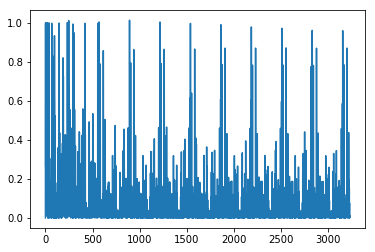

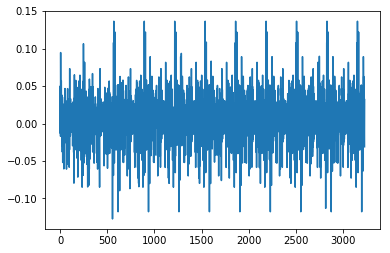

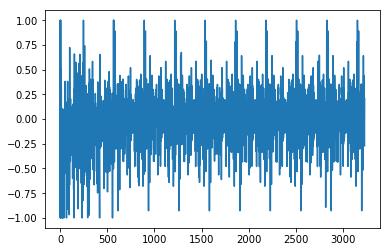

1.67135015602
[ 1.          0.66666667  0.11111111  0.11111111  0.11111111  0.66666667
  0.33333333  1.          1.          0.66666667  0.66666667  0.66666667
  0.          0.11111111  0.66666667  1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  0.66666667  0.11111111  0.66666667  0.11111111  1.          0.66666667
  1.          0.66666667  0.66666667  0.          0.11111111  0.66666667
  0.66666667  1.          0.22222222  1.          0.66666667  1.          1.
  1.          1.          0.66666667  0.66666667  1.          1.
  0.66666667  0.66666667  0.66666667  0.33333333  1.          1.          1.
  1.        ]
Writing away results
1981-06-01 00:00:00


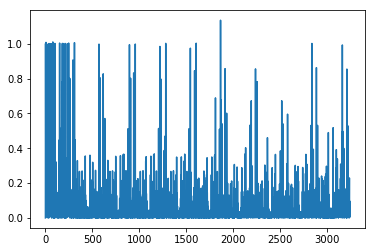

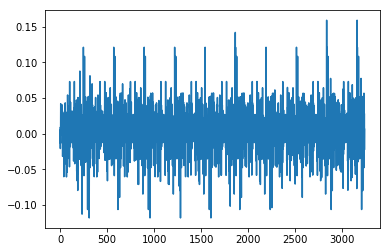

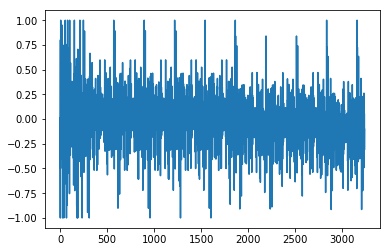

1.65965781091
[ 0.66666667  0.          1.          1.          1.          1.
  0.88888889  0.88888889  1.          1.          1.          0.55555556
  0.          1.          0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.66666667  0.66666667  0.66666667  1.          0.66666667
  1.          0.88888889  1.          1.          1.          0.
  0.66666667  1.          0.88888889  0.88888889  0.88888889  0.66666667
  0.88888889  0.88888889  0.88888889  0.88888889  0.66666667  0.88888889
  0.88888889  0.88888889  0.88888889  1.          0.66666667  0.44444444
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889]
Writing away results
1981-07-01 00:00:00


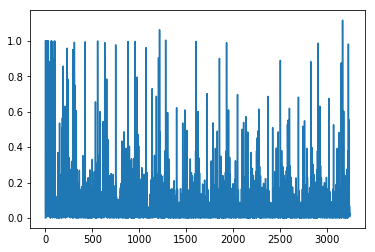

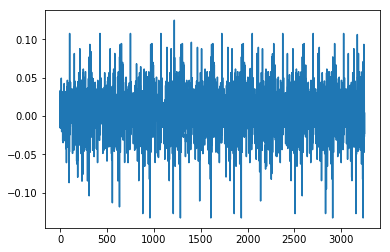

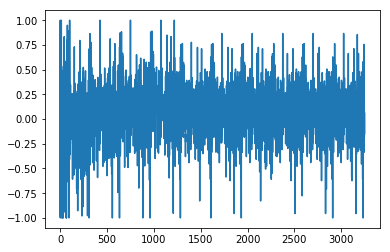

1.57178565302
[ 0.33333333  0.33333333  0.33333333  0.66666667  0.66666667  0.44444444
  1.          0.33333333  0.33333333  0.66666667  0.66666667  0.33333333
  0.33333333  0.66666667  0.66666667  1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          0.66666667  1.          0.33333333  0.44444444  0.33333333
  0.33333333  0.66666667  0.33333333  1.          0.33333333  0.66666667
  0.66666667  1.          1.          0.66666667  0.66666667  0.66666667
  1.          1.          1.          0.66666667  1.          1.
  0.33333333  1.          0.66666667  0.66666667  1.          1.          1.
  1.          1.        ]
Writing away results
1981-08-01 00:00:00


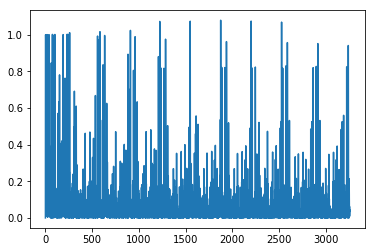

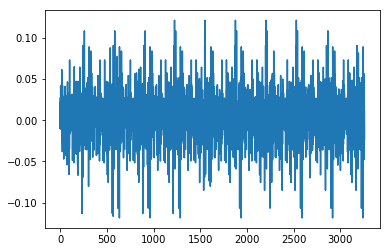

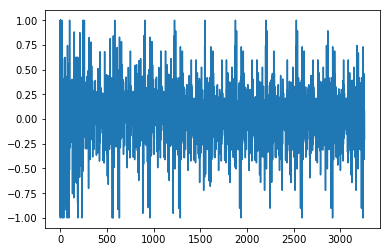

1.70690497845
[ 0.11111111  0.55555556  0.55555556  0.55555556  0.88888889  0.66666667
  0.55555556  0.55555556  0.55555556  0.11111111  0.11111111  0.55555556
  0.66666667  0.88888889  0.88888889  0.88888889  0.88888889  0.66666667
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.11111111
  0.66666667  0.66666667  0.11111111  0.66666667  0.55555556  0.11111111
  0.55555556  0.55555556  0.55555556  0.11111111  0.66666667  0.55555556
  0.88888889  0.88888889  0.88888889  0.66666667  0.66666667  0.88888889
  0.88888889  0.88888889  0.66666667  0.66666667  0.88888889  0.88888889
  0.66666667  0.11111111  0.66666667  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.66666667  0.88888889]
Writing away results
1981-09-01 00:00:00


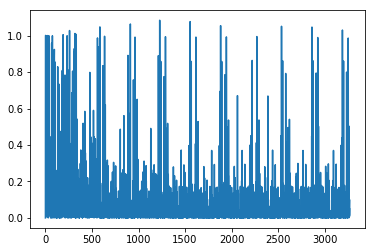

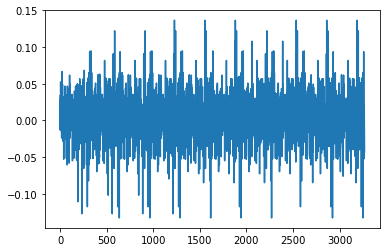

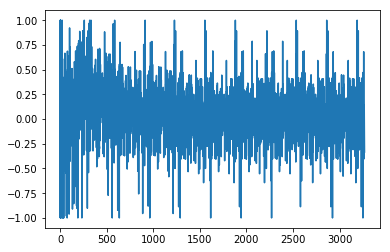

1.84462273476
[ 0.55555556  0.66666667  0.44444444  1.          0.55555556  0.55555556
  0.55555556  0.66666667  0.          0.55555556  0.55555556  0.66666667
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          0.55555556  0.55555556  0.66666667
  0.          0.66666667  0.55555556  0.          0.55555556  0.66666667
  0.          0.          0.66666667  0.55555556  1.          1.          1.
  0.55555556  0.66666667  1.          1.          1.          0.55555556
  1.          1.          1.          1.          0.55555556  0.66666667
  1.          1.          1.          1.          1.          1.          1.
  1.          1.        ]
Writing away results
1981-10-01 00:00:00


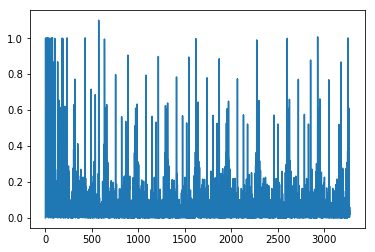

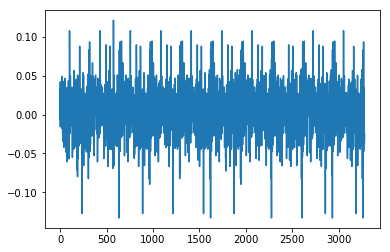

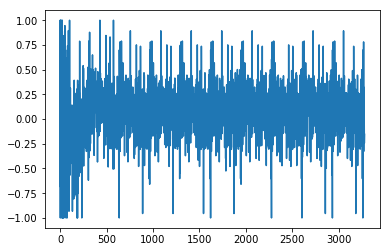

1.49862479945
[ 0.44444444  0.44444444  0.22222222  1.          0.          0.
  0.44444444  0.44444444  0.22222222  0.          0.44444444  0.44444444
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          0.22222222
  1.          0.44444444  0.22222222  0.          0.          0.44444444
  0.22222222  1.          0.44444444  0.44444444  0.44444444  0.22222222
  1.          0.44444444  1.          0.44444444  1.          1.          1.
  0.44444444  0.22222222  1.          0.22222222  1.          0.44444444
  0.44444444  1.          1.          1.          1.          1.          1.
  0.22222222  1.        ]
Writing away results
1981-11-01 00:00:00


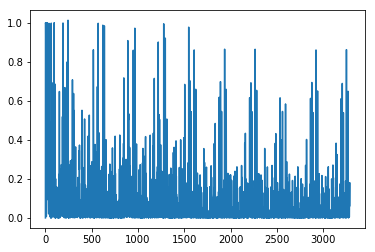

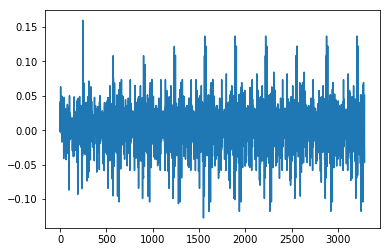

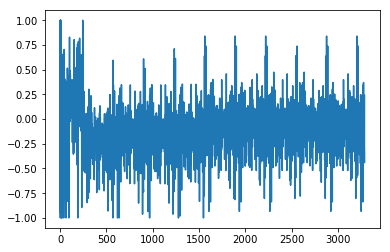

1.54779946194
[ 0.66666667  1.          0.66666667  0.66666667  0.66666667  0.66666667
  1.          1.          0.66666667  0.66666667  0.77777778  1.
  0.77777778  1.          0.88888889  0.88888889  0.77777778  0.77777778
  0.77777778  0.77777778  0.88888889  0.66666667  0.66666667  0.11111111
  0.66666667  0.33333333  0.66666667  0.66666667  0.66666667  0.33333333
  0.          0.66666667  0.66666667  1.          0.77777778  1.
  0.66666667  0.66666667  1.          0.77777778  1.          0.66666667
  0.66666667  1.          1.          0.66666667  0.66666667  0.66666667
  0.77777778  1.          1.          0.88888889  0.77777778  1.
  0.88888889  0.88888889  1.          0.66666667  0.33333333]
Writing away results
1981-12-01 00:00:00


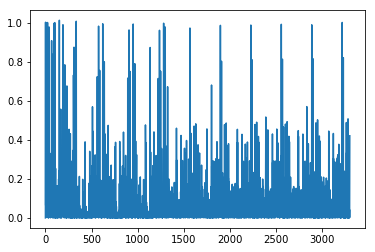

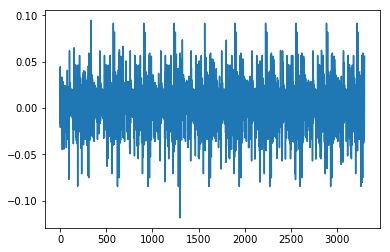

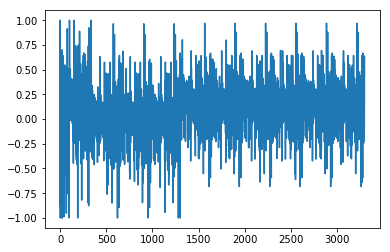

1.52494023769
[ 0.66666667  0.55555556  0.55555556  0.11111111  0.11111111  0.11111111
  0.66666667  0.55555556  0.11111111  1.          0.66666667  0.55555556
  0.66666667  0.55555556  0.55555556  0.66666667  0.55555556  0.66666667
  0.66666667  0.55555556  0.66666667  0.55555556  0.11111111  0.55555556
  0.11111111  0.66666667  0.55555556  0.11111111  0.11111111  0.11111111
  0.55555556  0.11111111  0.11111111  1.          0.66666667  0.55555556
  0.11111111  0.55555556  0.66666667  0.66666667  0.55555556  0.55555556
  1.          0.66666667  0.55555556  0.11111111  0.55555556  1.
  0.66666667  0.66666667  0.55555556  0.55555556  0.66666667  0.55555556
  0.55555556  0.66666667  0.55555556  0.11111111  0.66666667]
Writing away results
1982-01-01 00:00:00


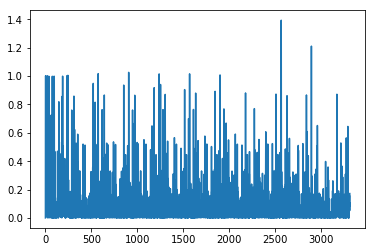

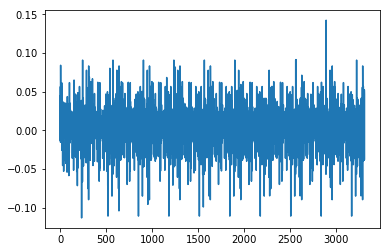

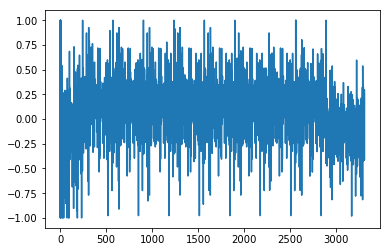

1.55391517472
[ 0.55555556  0.55555556  0.55555556  1.          0.22222222  0.22222222
  0.55555556  1.          0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.55555556  0.55555556  0.22222222  0.55555556  1.
  0.22222222  0.55555556  0.55555556  1.          0.22222222  0.55555556
  0.55555556  1.          0.66666667  0.22222222  0.66666667  0.55555556
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.55555556  0.55555556  1.          0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.22222222  0.55555556  0.22222222  0.22222222  0.66666667]
Writing away results
1982-02-01 00:00:00


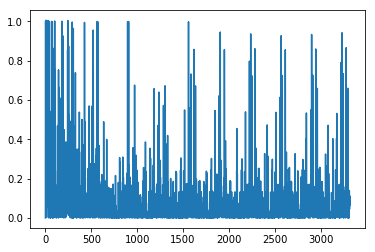

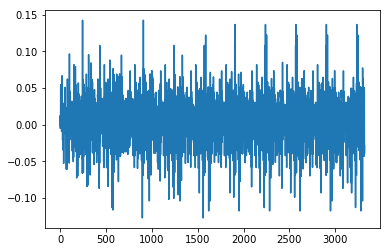

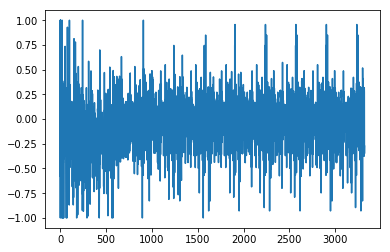

1.94340471538
[ 0.66666667  0.66666667  0.66666667  0.77777778  1.          0.66666667
  0.66666667  0.77777778  1.          1.          1.          0.66666667
  0.66666667  1.          1.          1.          1.          0.44444444
  0.66666667  0.66666667  0.77777778  0.66666667  0.33333333  1.
  0.66666667  0.66666667  0.33333333  0.33333333  0.66666667  0.33333333
  1.          0.77777778  1.          0.66666667  0.66666667  1.
  0.77777778  1.          0.66666667  0.66666667  0.77777778  1.
  0.66666667  0.66666667  0.66666667  0.77777778  1.          1.
  0.66666667  1.          1.          0.66666667  0.66666667  1.
  0.66666667  0.33333333  1.          0.66666667  1.        ]
Writing away results
1982-03-01 00:00:00


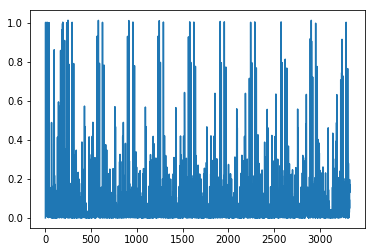

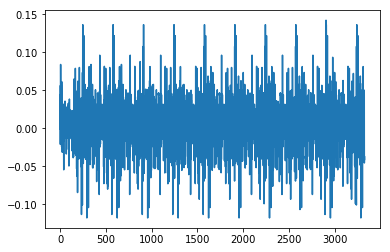

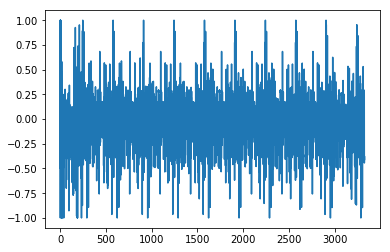

2.11053424076
[ 0.66666667  0.66666667  0.77777778  1.          0.66666667  0.66666667
  0.77777778  1.          0.88888889  1.          0.88888889  0.88888889
  1.          0.88888889  0.77777778  1.          0.88888889  0.66666667
  0.66666667  0.77777778  0.66666667  0.77777778  1.          0.88888889
  0.66666667  0.77777778  0.77777778  0.66666667  0.66666667  1.
  0.77777778  1.          0.88888889  1.          1.          0.77777778
  1.          0.66666667  0.66666667  1.          1.          0.66666667
  0.66666667  0.66666667  0.77777778  1.          1.          1.          1.
  1.          0.88888889  0.88888889  1.          0.66666667  0.77777778
  1.          0.88888889  1.          0.66666667]
Writing away results
1982-04-01 00:00:00


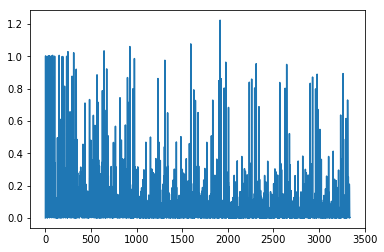

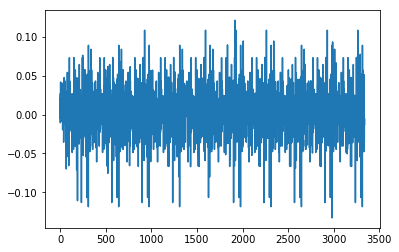

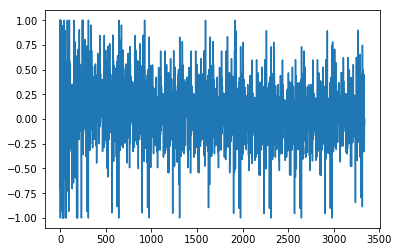

1.78894011925
[ 0.44444444  0.11111111  0.11111111  0.44444444  0.66666667  0.88888889
  0.88888889  0.88888889  0.88888889  0.66666667  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.11111111  0.66666667  0.66666667
  0.11111111  0.66666667  0.44444444  0.11111111  0.44444444  0.44444444
  0.44444444  0.11111111  0.66666667  0.44444444  0.88888889  0.88888889
  0.88888889  0.66666667  0.66666667  0.88888889  0.88888889  0.88888889
  0.66666667  0.66666667  0.88888889  0.88888889  0.66666667  0.11111111
  0.66666667  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.66666667  0.88888889  0.11111111  0.66666667  0.11111111
  0.66666667  0.66666667  0.11111111  0.66666667  0.88888889]
Writing away results
1982-05-01 00:00:00


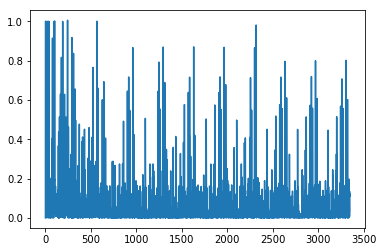

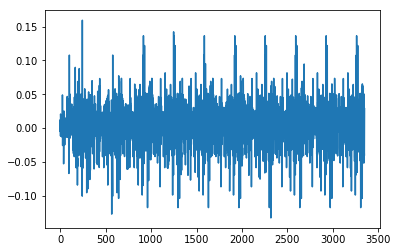

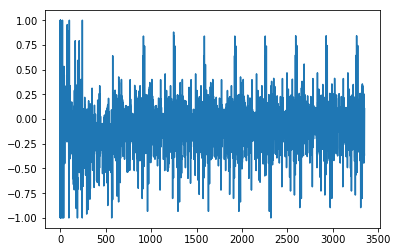

2.19752437671
[ 0.77777778  0.66666667  0.66666667  0.66666667  0.77777778  1.
  0.77777778  1.          1.          0.77777778  1.          1.
  0.77777778  1.          0.55555556  0.66666667  0.66666667  0.22222222
  0.66666667  0.44444444  0.66666667  0.66666667  0.66666667  0.44444444
  0.22222222  0.66666667  0.66666667  0.66666667  0.77777778  1.
  0.66666667  0.66666667  1.          0.77777778  1.          0.66666667
  0.66666667  0.77777778  1.          0.66666667  0.66666667  0.66666667
  0.44444444  1.          1.          1.          1.          1.          1.
  0.44444444  1.          0.66666667  0.77777778  0.66666667  0.44444444
  1.          0.66666667  0.77777778  1.        ]
Writing away results
1982-06-01 00:00:00


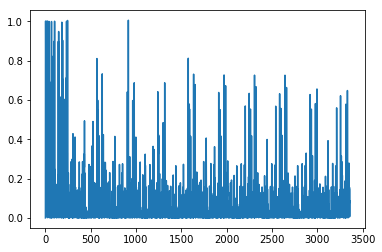

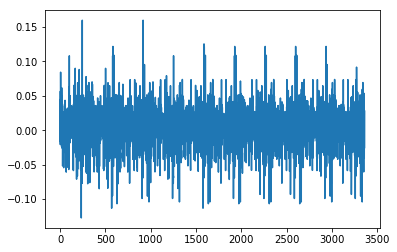

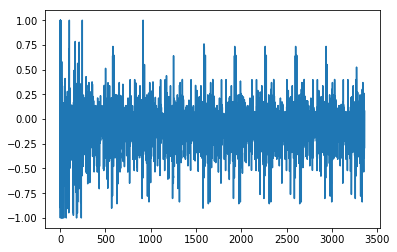

2.1323440933
[ 0.66666667  0.66666667  0.66666667  0.77777778  0.88888889  0.77777778
  0.88888889  0.66666667  0.77777778  0.77777778  0.77777778  0.77777778
  0.77777778  0.55555556  0.66666667  0.66666667  0.77777778  0.66666667
  0.33333333  0.66666667  0.66666667  0.66666667  0.22222222  0.55555556
  0.66666667  0.66666667  0.77777778  0.77777778  0.66666667  0.66666667
  0.66666667  0.88888889  0.77777778  0.88888889  0.66666667  0.66666667
  0.77777778  0.88888889  0.66666667  0.66666667  0.66666667  0.77777778
  0.77777778  0.88888889  0.66666667  0.77777778  0.77777778  0.66666667
  0.77777778  0.88888889  0.66666667  0.33333333  0.66666667  0.11111111
  0.88888889  0.66666667  0.77777778  0.77777778  0.55555556]
Writing away results
1982-07-01 00:00:00


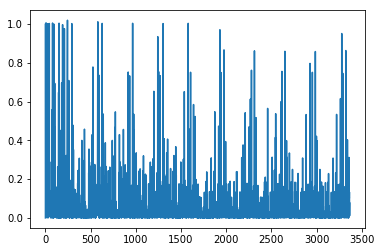

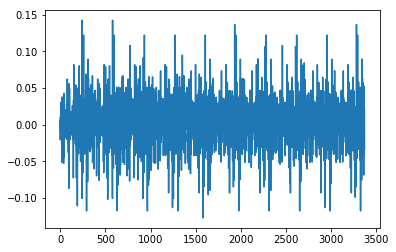

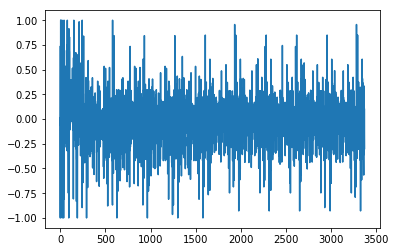

2.09741483245
[ 0.66666667  0.66666667  0.77777778  1.          0.66666667  1.
  0.66666667  0.66666667  1.          0.66666667  0.77777778  0.66666667
  0.66666667  0.66666667  0.66666667  0.77777778  0.66666667  0.77777778
  1.          0.11111111  0.44444444  0.77777778  0.11111111  0.66666667
  0.11111111  1.          0.77777778  1.          0.66666667  1.          1.
  0.77777778  1.          0.66666667  0.66666667  1.          1.
  0.66666667  0.11111111  0.66666667  0.77777778  1.          1.
  0.66666667  0.66666667  1.          0.66666667  0.66666667  1.
  0.66666667  0.77777778  1.          0.66666667  1.          0.66666667
  0.77777778  1.          0.66666667  0.66666667]
Writing away results
1982-08-01 00:00:00


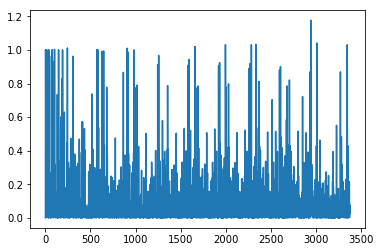

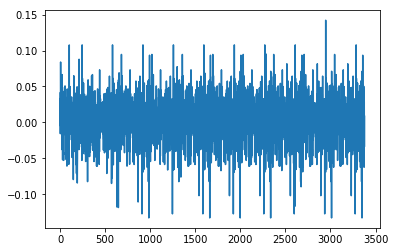

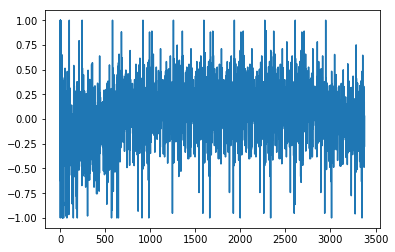

1.95490621461
[ 0.88888889  0.88888889  1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          0.66666667
  0.66666667  0.44444444  0.66666667  0.88888889  0.44444444  0.66666667
  0.66666667  0.88888889  0.44444444  0.66666667  0.66666667  0.88888889
  1.          0.44444444  1.          0.88888889  1.          1.          1.
  1.          1.          0.88888889  1.          1.          0.66666667
  0.66666667  0.88888889  1.          1.          1.          1.          1.
  1.          1.          0.44444444  1.          0.22222222  0.44444444
  1.          0.44444444  1.          1.          1.          1.          1.
  1.        ]
Writing away results
1982-09-01 00:00:00


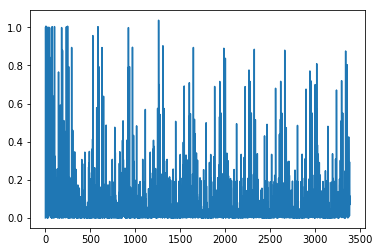

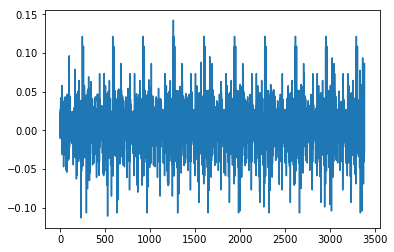

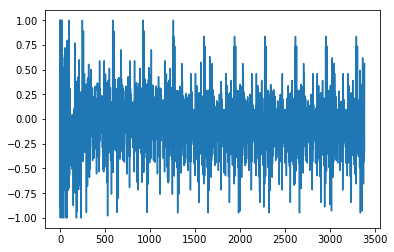

2.05287448403
[ 0.77777778  0.88888889  1.          0.88888889  0.66666667  0.66666667
  0.88888889  1.          0.77777778  0.88888889  1.          0.66666667
  0.66666667  0.77777778  0.66666667  0.77777778  0.88888889  0.66666667
  0.66666667  0.77777778  0.77777778  0.66666667  0.66666667  0.88888889
  0.77777778  0.88888889  0.66666667  0.66666667  0.88888889  0.77777778
  0.88888889  0.66666667  0.66666667  0.77777778  0.88888889  0.66666667
  0.66666667  0.66666667  0.77777778  0.88888889  0.88888889  0.66666667
  0.88888889  0.88888889  0.66666667  0.66666667  0.88888889  0.66666667
  0.77777778  0.88888889  0.66666667  0.88888889  0.66666667  0.77777778
  0.88888889  0.66666667  0.66666667  0.66666667  0.77777778]
Writing away results
1982-10-01 00:00:00


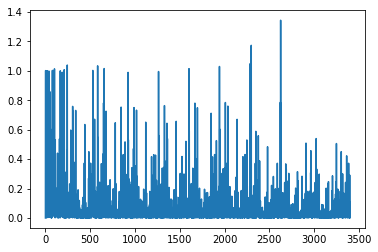

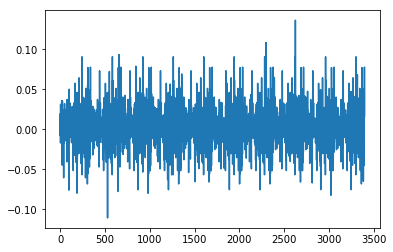

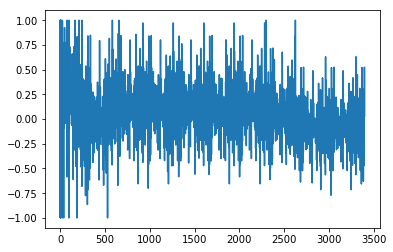

1.55798830829
[ 0.66666667  0.33333333  0.33333333  0.66666667  0.33333333  0.33333333
  0.66666667  0.33333333  0.33333333  0.33333333  0.66666667  0.66666667
  0.88888889  0.66666667  0.55555556  0.44444444  0.55555556  0.66666667
  0.55555556  0.44444444  0.66666667  0.55555556  0.66666667  0.22222222
  0.33333333  0.66666667  0.66666667  0.66666667  0.22222222  0.33333333
  0.66666667  0.66666667  0.22222222  0.33333333  0.33333333  0.55555556
  0.66666667  0.22222222  0.22222222  0.33333333  0.66666667  0.22222222
  0.33333333  0.66666667  0.33333333  0.33333333  0.66666667  0.55555556
  0.66666667  0.55555556  0.44444444  0.66666667  0.22222222  0.33333333
  0.33333333  0.66666667  0.66666667  0.22222222  0.33333333]
Writing away results
1982-11-01 00:00:00


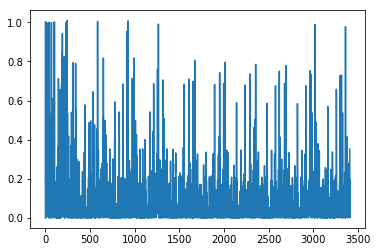

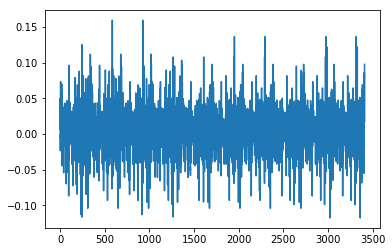

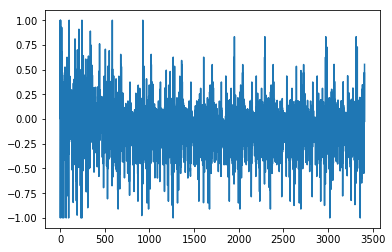

1.53047732774
[ 0.77777778  1.          0.66666667  0.77777778  0.77777778  0.77777778
  0.77777778  1.          0.          0.66666667  0.66666667  0.77777778
  0.66666667  0.          0.66666667  0.66666667  0.66666667  0.11111111
  0.77777778  0.66666667  0.66666667  1.          0.77777778  1.
  0.66666667  0.66666667  1.          0.77777778  1.          0.66666667
  0.66666667  0.77777778  1.          0.66666667  0.66666667  0.66666667
  0.77777778  1.          1.          0.66666667  1.          1.
  0.66666667  0.66666667  1.          0.66666667  0.          0.66666667
  0.88888889  1.          0.66666667  0.77777778  1.          0.66666667
  0.66666667  0.88888889  0.77777778  0.77777778  0.77777778]
Writing away results
1982-12-01 00:00:00


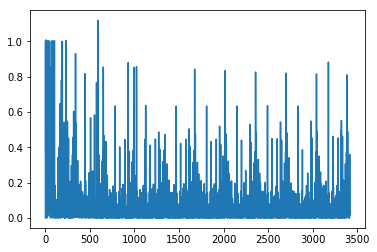

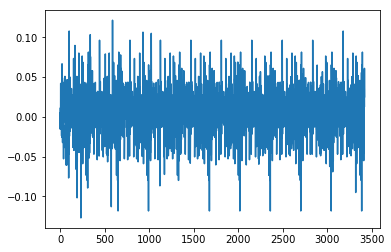

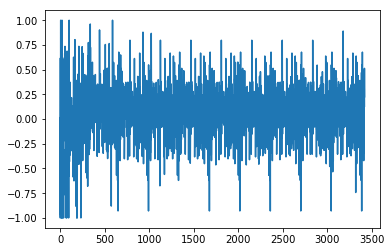

1.26004809124
[ 0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.          0.88888889
  0.22222222  0.55555556  0.          0.          0.          0.55555556
  0.          0.          0.88888889  0.22222222  0.55555556  0.88888889
  0.88888889  0.88888889  0.22222222  0.88888889  0.88888889  0.88888889
  0.22222222  0.55555556  0.88888889  0.          0.88888889  0.22222222
  0.22222222  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.55555556  0.88888889  0.22222222  0.55555556  0.22222222
  0.55555556  0.88888889  0.22222222  0.88888889  0.88888889  0.88888889
  0.88888889  0.22222222  0.88888889  0.88888889  0.55555556]
Writing away results
1983-01-01 00:00:00


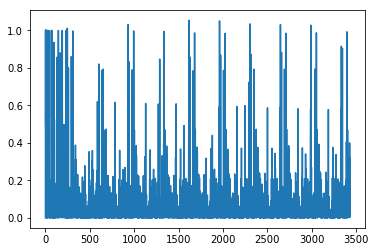

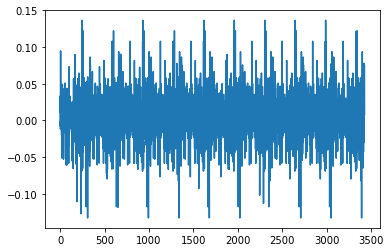

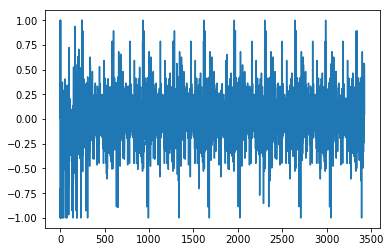

1.29890681522
[ 1.          1.          1.          1.          1.          1.          1.
  1.          0.66666667  0.88888889  1.          0.44444444  0.88888889
  0.66666667  0.66666667  0.55555556  0.33333333  0.66666667  0.66666667
  1.          0.44444444  1.          1.          0.44444444  1.
  0.44444444  1.          1.          1.          0.44444444  1.          1.
  0.66666667  0.66666667  0.44444444  1.          1.          1.          1.
  1.          1.          1.          1.          1.          0.44444444
  1.          0.66666667  0.88888889  1.          0.44444444  1.          1.
  1.          0.66666667  0.44444444  1.          1.          0.66666667
  0.66666667]
Writing away results
1983-02-01 00:00:00


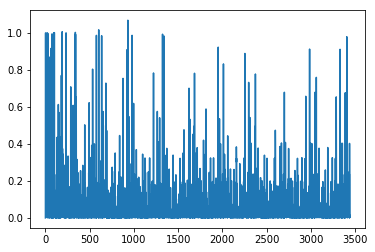

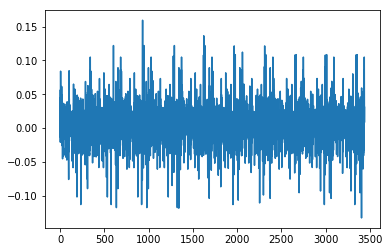

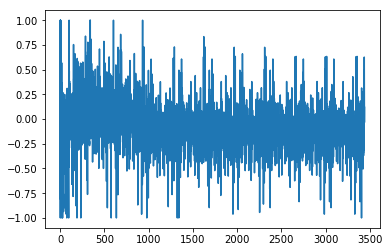

1.39743007296
[ 0.88888889  0.77777778  0.88888889  0.77777778  0.88888889  0.55555556
  0.66666667  0.66666667  0.          0.66666667  0.33333333  0.66666667
  0.66666667  0.66666667  0.77777778  0.          0.66666667  0.66666667
  1.          0.88888889  0.66666667  0.66666667  0.66666667  0.88888889
  0.77777778  0.88888889  0.66666667  0.66666667  0.88888889  0.88888889
  0.66666667  0.66666667  0.66666667  0.88888889  0.88888889  0.88888889
  0.66666667  0.88888889  0.88888889  0.88888889  0.88888889  0.66666667
  0.66666667  0.88888889  0.66666667  0.33333333  0.88888889  0.66666667
  0.77777778  0.88888889  0.55555556  0.66666667  0.66666667  0.77777778
  0.77777778  0.77777778  0.66666667  0.66666667  0.66666667]
Writing away results
1983-03-01 00:00:00


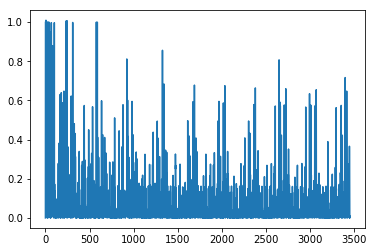

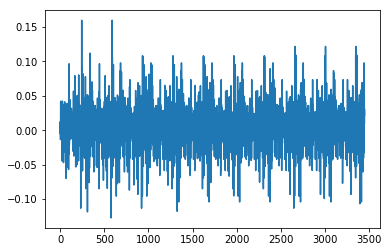

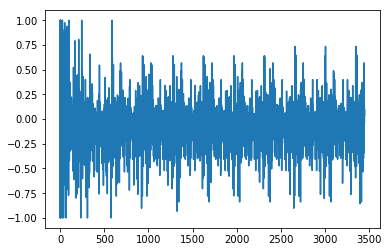

1.4840725
[ 0.88888889  0.88888889  0.77777778  0.88888889  0.          0.66666667
  0.66666667  0.77777778  0.66666667  0.55555556  0.66666667  0.66666667
  0.66666667  0.11111111  0.77777778  0.66666667  0.66666667  0.88888889
  0.77777778  0.88888889  0.66666667  0.66666667  0.88888889  0.77777778
  0.88888889  0.66666667  0.66666667  0.77777778  0.88888889  0.66666667
  0.66666667  0.66666667  0.77777778  0.88888889  0.88888889  0.66666667
  0.88888889  0.88888889  0.66666667  0.66666667  0.88888889  0.66666667
  0.55555556  0.66666667  0.66666667  0.88888889  0.66666667  0.77777778
  0.88888889  0.66666667  0.66666667  0.66666667  0.77777778  0.77777778
  0.77777778  0.66666667  0.66666667  0.66666667  0.77777778]
Writing away results
1983-04-01 00:00:00


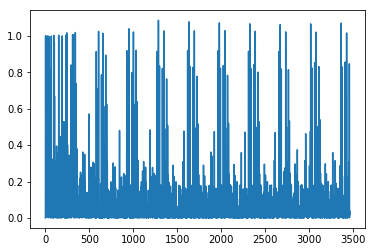

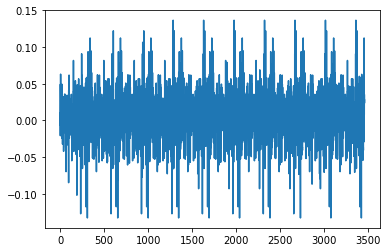

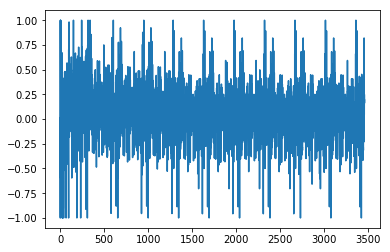

1.25790615118
[ 1.          1.          1.          0.66666667  0.55555556  0.55555556
  0.33333333  0.55555556  0.55555556  0.66666667  0.55555556  0.55555556
  0.55555556  0.66666667  0.55555556  0.55555556  1.          1.          1.
  0.55555556  0.55555556  1.          1.          1.          0.55555556
  0.55555556  1.          1.          1.          0.55555556  0.55555556
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          0.55555556  0.33333333  1.          0.55555556
  1.          1.          1.          1.          1.          0.55555556
  0.55555556  1.          1.          1.          0.66666667  0.55555556
  0.55555556  1.          1.        ]
Writing away results
1983-05-01 00:00:00


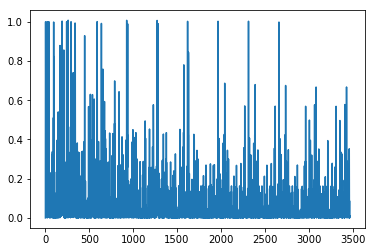

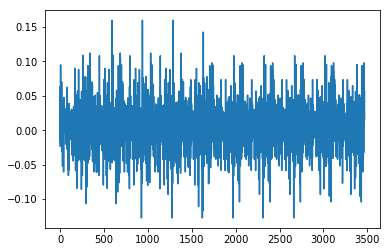

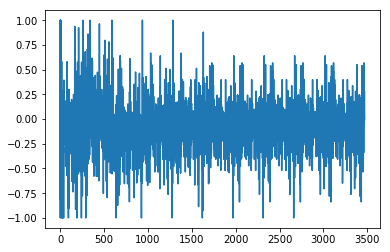

1.23951188997
[ 0.77777778  1.          1.          0.66666667  0.66666667  0.77777778
  0.66666667  0.55555556  0.33333333  0.66666667  0.66666667  0.77777778
  0.77777778  0.66666667  0.66666667  0.77777778  0.77777778  0.88888889
  0.66666667  0.66666667  0.88888889  0.77777778  1.          0.66666667
  0.66666667  0.77777778  0.88888889  0.66666667  0.66666667  0.66666667
  0.77777778  0.77777778  0.88888889  0.66666667  0.88888889  0.77777778
  0.66666667  0.66666667  0.33333333  0.66666667  0.77777778  0.66666667
  0.66666667  0.77777778  0.66666667  0.77777778  0.77777778  0.66666667
  0.66666667  0.66666667  0.77777778  0.77777778  1.          0.66666667
  0.66666667  0.66666667  0.77777778  0.77777778  0.88888889]
Writing away results
1983-06-01 00:00:00


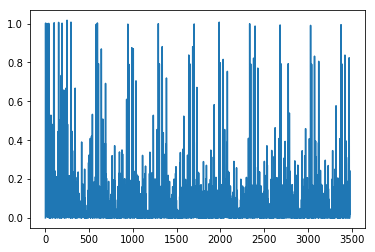

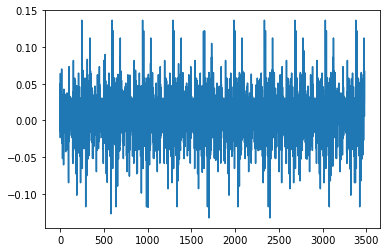

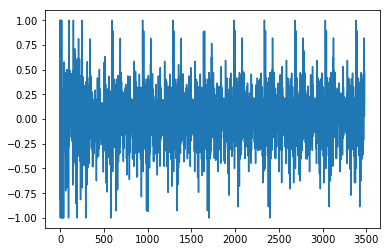

1.17622964775
[ 1.          0.66666667  0.66666667  0.66666667  0.          0.66666667
  0.11111111  1.          0.66666667  0.          0.          0.
  0.66666667  0.          1.          1.          1.          0.66666667
  1.          1.          1.          1.          0.66666667  1.          1.
  1.          0.66666667  0.55555556  0.66666667  1.          1.          1.
  1.          1.          1.          1.          1.          1.
  0.66666667  0.          1.          0.66666667  1.          0.66666667
  1.          1.          0.66666667  0.66666667  0.66666667  1.          1.
  1.          0.55555556  0.66666667  0.66666667  1.          1.          1.
  0.66666667]
Writing away results
1983-07-01 00:00:00


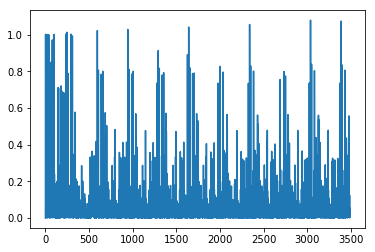

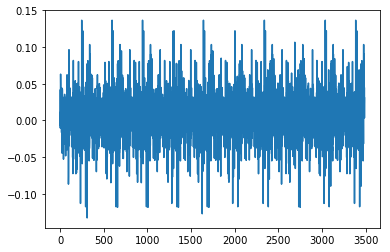

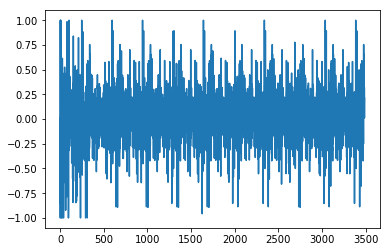

1.5720993434
[ 0.88888889  0.88888889  0.88888889  0.22222222  0.88888889  0.22222222
  1.          0.88888889  0.22222222  0.22222222  0.33333333  0.88888889
  0.22222222  1.          0.66666667  1.          0.88888889  1.          1.
  1.          1.          0.88888889  0.88888889  1.          1.
  0.88888889  0.33333333  0.88888889  0.66666667  1.          1.
  0.88888889  1.          1.          0.88888889  0.88888889  1.
  0.88888889  0.          1.          0.88888889  1.          0.88888889
  0.66666667  1.          0.88888889  0.88888889  0.88888889  1.          1.
  0.33333333  0.33333333  0.88888889  0.22222222  1.          1.
  0.88888889  0.88888889  0.88888889]
Writing away results
1983-08-01 00:00:00


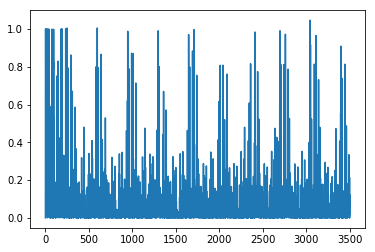

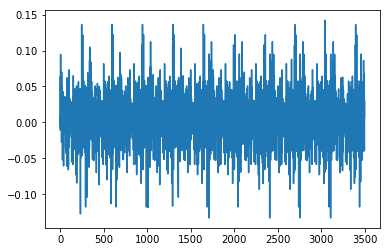

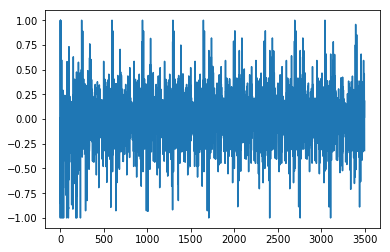

1.36848399511
[ 0.66666667  0.66666667  0.          0.66666667  0.88888889  0.
  0.66666667  0.66666667  0.66666667  0.          0.66666667  0.66666667
  1.          1.          1.          0.66666667  1.          1.          1.
  1.          0.66666667  1.          1.          1.          1.
  0.66666667  0.66666667  1.          1.          1.          1.          1.
  1.          1.          1.          1.          0.66666667  0.          1.
  0.66666667  1.          1.          1.          1.          0.66666667
  0.66666667  0.66666667  1.          1.          1.          0.
  0.66666667  0.66666667  0.33333333  1.          1.          1.
  0.66666667  1.        ]
Writing away results
1983-09-01 00:00:00


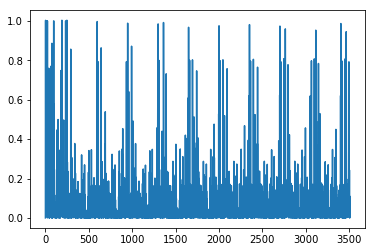

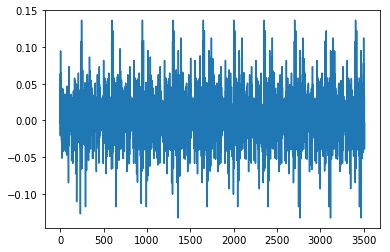

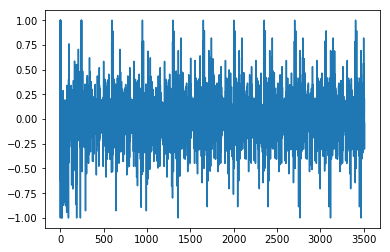

1.3810945436
[ 0.66666667  0.          0.66666667  0.          0.          0.66666667
  0.66666667  0.66666667  0.          0.66666667  0.66666667  1.          1.
  1.          0.66666667  1.          1.          1.          1.
  0.66666667  1.          1.          1.          0.66666667  0.
  0.66666667  1.          1.          1.          1.          1.          1.
  1.          1.          1.          0.66666667  0.          1.
  0.66666667  1.          1.          1.          1.          1.
  0.66666667  0.66666667  1.          1.          1.          0.
  0.66666667  0.66666667  1.          1.          1.          1.
  0.66666667  1.          1.        ]
Writing away results
1983-10-01 00:00:00


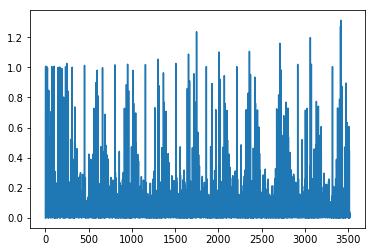

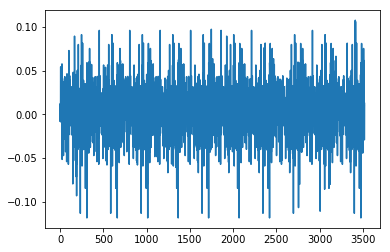

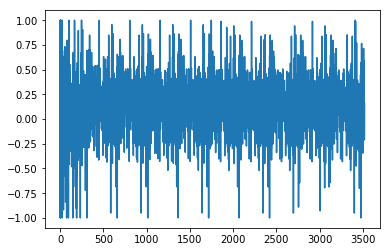

1.33289434516
[ 0.33333333  0.88888889  0.44444444  0.66666667  0.33333333  0.33333333
  0.33333333  0.66666667  0.33333333  0.33333333  0.88888889  0.44444444
  0.66666667  0.88888889  0.88888889  0.88888889  0.44444444  0.66666667
  0.88888889  0.88888889  0.44444444  0.66666667  0.88888889  0.33333333
  0.88888889  0.44444444  0.44444444  0.88888889  0.88888889  0.88888889
  0.66666667  0.88888889  0.88888889  0.66666667  0.88888889  0.44444444
  0.66666667  0.88888889  0.66666667  0.88888889  0.44444444  0.66666667
  0.88888889  0.88888889  0.88888889  0.44444444  0.88888889  0.66666667
  0.66666667  0.33333333  0.33333333  0.44444444  0.66666667  0.88888889
  0.88888889  0.88888889  0.88888889  0.44444444  0.66666667]
Writing away results
1983-11-01 00:00:00


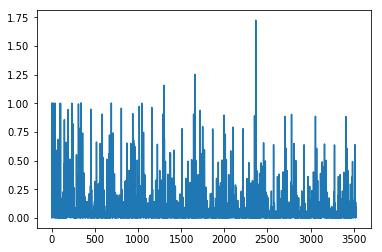

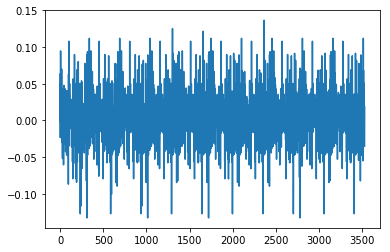

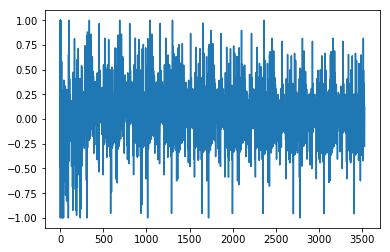

1.43521516266
[ 1.          1.          0.11111111  0.11111111  0.11111111  0.33333333
  0.11111111  1.          1.          0.66666667  0.33333333  0.66666667
  1.          1.          1.          0.33333333  0.66666667  1.          1.
  0.33333333  0.66666667  1.          0.11111111  1.          1.
  0.66666667  0.66666667  1.          1.          0.66666667  1.          1.
  0.11111111  1.          0.33333333  0.66666667  1.          0.66666667
  1.          0.33333333  0.66666667  1.          1.          1.
  0.33333333  0.66666667  0.66666667  0.11111111  1.          1.
  0.33333333  0.66666667  0.66666667  0.66666667  1.          0.66666667
  0.33333333  0.11111111  1.        ]
Writing away results
1983-12-01 00:00:00


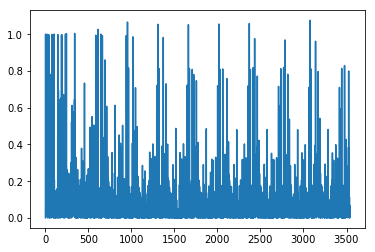

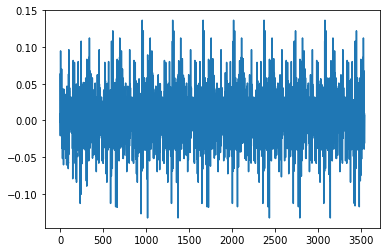

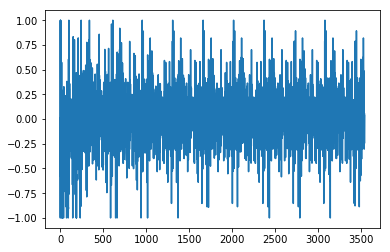

1.3699085681
[ 0.66666667  0.22222222  0.66666667  0.66666667  0.66666667  0.22222222
  0.88888889  0.66666667  1.          1.          1.          0.88888889
  1.          1.          1.          1.          0.88888889  1.          1.
  1.          0.88888889  0.66666667  0.88888889  1.          1.          1.
  1.          1.          1.          0.88888889  1.          0.22222222
  0.88888889  0.66666667  1.          0.88888889  1.          0.88888889
  1.          1.          0.88888889  0.88888889  0.88888889  1.          1.
  1.          0.22222222  0.66666667  0.66666667  1.          1.          1.
  0.88888889  0.88888889  1.          1.          0.22222222  0.88888889
  1.        ]
Writing away results
1984-01-01 00:00:00


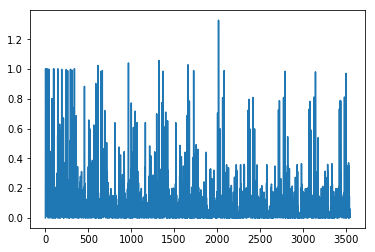

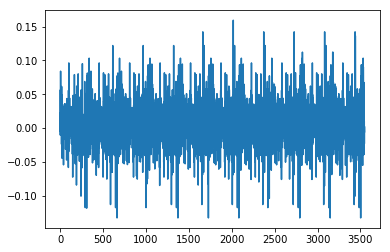

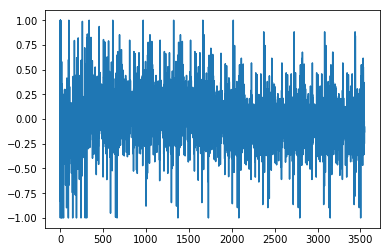

1.28719387062
[ 0.33333333  0.88888889  0.88888889  0.88888889  0.33333333  0.88888889
  0.88888889  1.          1.          1.          0.88888889  0.88888889
  1.          1.          1.          0.88888889  1.          1.          1.
  1.          0.88888889  0.88888889  1.          1.          1.          1.
  1.          1.          1.          1.          0.33333333  0.88888889
  0.22222222  0.33333333  0.88888889  0.33333333  1.          1.          1.
  1.          0.88888889  0.88888889  1.          1.          1.
  0.33333333  0.88888889  0.88888889  0.77777778  1.          1.          1.
  0.88888889  1.          1.          0.33333333  0.88888889  0.77777778
  0.33333333]
Writing away results
1984-02-01 00:00:00


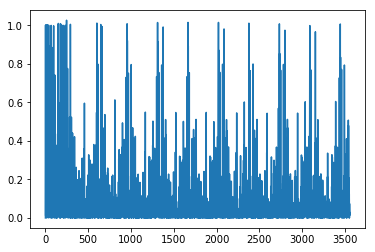

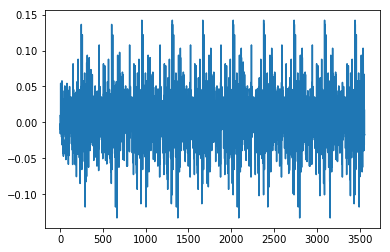

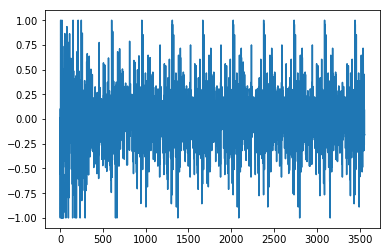

1.52221016145
[ 0.88888889  0.88888889  0.88888889  0.77777778  0.88888889  0.88888889
  0.66666667  0.66666667  1.          1.          0.66666667  0.66666667
  0.66666667  1.          1.          0.66666667  0.66666667  1.          1.
  0.88888889  0.88888889  0.66666667  1.          1.          1.
  0.66666667  1.          1.          0.66666667  1.          1.
  0.11111111  1.          0.88888889  1.          1.          0.66666667
  1.          1.          1.          0.88888889  0.66666667  1.          1.
  1.          0.88888889  0.88888889  0.66666667  1.          1.          1.
  0.88888889  0.66666667  0.66666667  1.          1.          0.66666667
  1.          1.        ]
Writing away results
1984-03-01 00:00:00


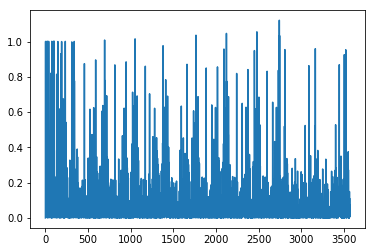

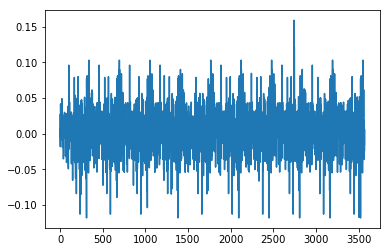

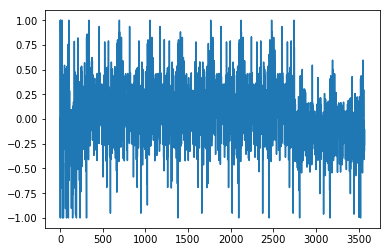

1.23841127999
[ 0.22222222  0.22222222  0.33333333  0.88888889  0.22222222  0.66666667
  0.66666667  0.33333333  0.88888889  0.66666667  0.66666667  0.66666667
  0.88888889  0.88888889  0.88888889  0.66666667  0.33333333  0.88888889
  0.33333333  0.88888889  0.66666667  0.66666667  0.88888889  0.88888889
  0.88888889  0.66666667  0.88888889  0.88888889  0.33333333  0.88888889
  0.11111111  0.33333333  0.88888889  0.33333333  0.88888889  0.66666667
  0.66666667  0.88888889  0.88888889  0.88888889  0.66666667  0.66666667
  0.88888889  0.33333333  0.33333333  0.22222222  0.66666667  0.66666667
  0.88888889  0.88888889  0.88888889  0.66666667  0.66666667  0.33333333
  0.88888889  0.66666667  0.33333333  0.88888889  0.66666667]
Writing away results
1984-04-01 00:00:00


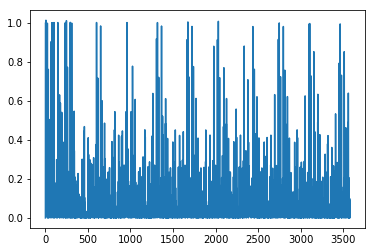

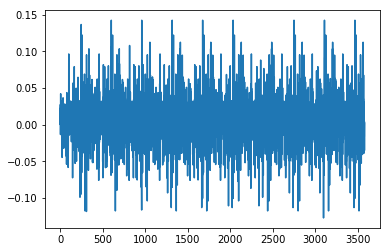

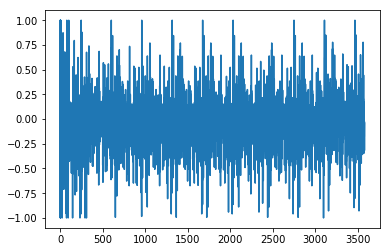

2.02215994779
[ 0.          0.          0.88888889  0.88888889  1.          1.          1.
  0.88888889  1.          1.          1.          1.          0.88888889
  1.          1.          1.          0.66666667  0.66666667  0.88888889
  1.          1.          1.          1.          1.          1.          1.
  1.          0.66666667  0.88888889  0.22222222  0.66666667  0.88888889
  1.          1.          1.          1.          0.66666667  0.88888889
  0.88888889  1.          1.          0.          0.66666667  0.88888889
  0.88888889  1.          1.          1.          0.66666667  0.88888889
  1.          0.77777778  0.66666667  0.88888889  1.          0.77777778
  0.88888889  1.          0.77777778]
Writing away results
1984-05-01 00:00:00


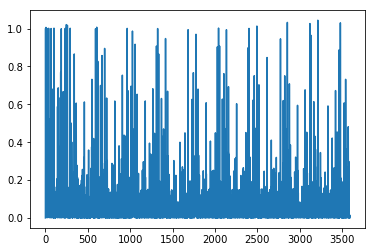

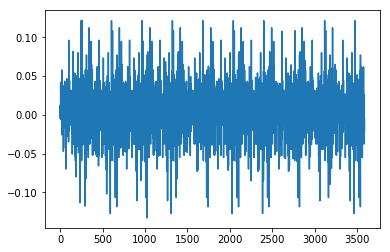

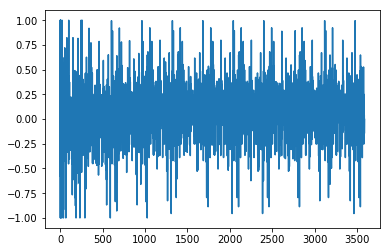

1.36736761709
[ 0.33333333  0.33333333  0.33333333  0.88888889  1.          0.88888889
  0.88888889  0.44444444  1.          1.          0.88888889  0.88888889
  0.88888889  1.          0.88888889  0.88888889  0.33333333  0.44444444
  1.          1.          0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.33333333  0.88888889
  1.          0.22222222  0.88888889  1.          0.88888889  0.88888889
  0.88888889  0.44444444  1.          0.88888889  0.88888889  0.33333333
  0.33333333  0.44444444  0.44444444  0.88888889  0.88888889  0.88888889
  0.33333333  0.88888889  1.          0.88888889  0.88888889  1.          1.
  0.88888889  1.          1.          0.88888889]
Writing away results
1984-06-01 00:00:00


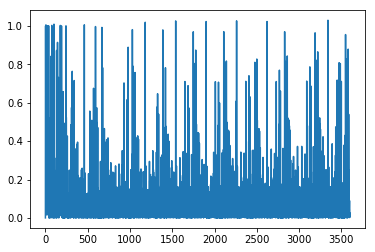

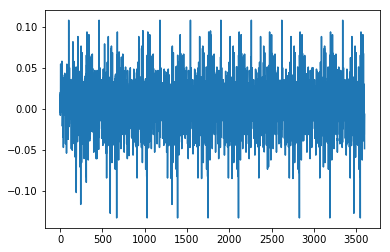

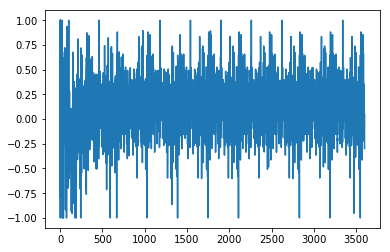

1.54632889418
[ 0.44444444  0.44444444  1.          0.66666667  0.55555556  1.
  0.44444444  1.          0.66666667  1.          1.          1.
  0.66666667  0.55555556  1.          0.44444444  1.          0.66666667
  0.66666667  1.          1.          1.          1.          1.          1.
  0.55555556  1.          0.66666667  0.55555556  0.66666667  0.55555556
  1.          0.66666667  0.55555556  1.          1.          1.
  0.66666667  1.          1.          0.55555556  0.44444444  0.44444444
  0.66666667  0.66666667  1.          1.          1.          1.
  0.66666667  0.55555556  1.          0.66666667  0.55555556  1.          1.
  0.66666667  1.          1.        ]
Writing away results
1984-07-01 00:00:00


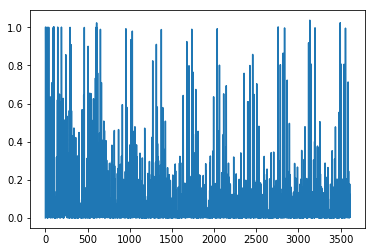

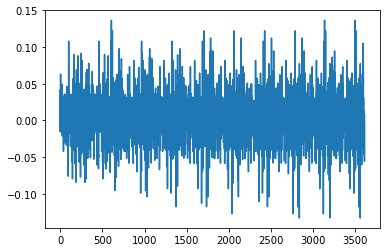

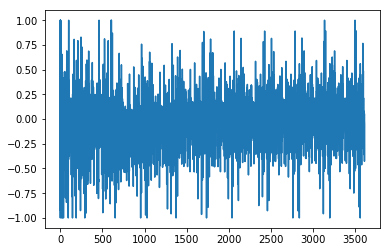

1.7060437783
[ 0.66666667  1.          1.          1.          0.66666667  1.          1.
  1.          1.          0.66666667  0.66666667  1.          1.
  0.66666667  0.66666667  0.66666667  1.          1.          1.          1.
  1.          1.          1.          1.          1.          0.66666667
  0.88888889  1.          0.66666667  1.          1.          1.          1.
  0.66666667  0.66666667  0.66666667  1.          1.          1.
  0.66666667  0.66666667  0.66666667  1.          1.          1.          1.
  0.66666667  1.          1.          1.          0.66666667  0.77777778
  1.          0.66666667  1.          1.          1.          0.66666667
  1.        ]
Writing away results
1984-08-01 00:00:00


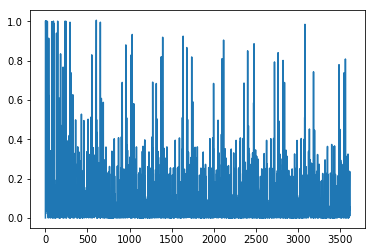

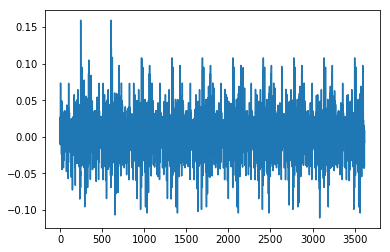

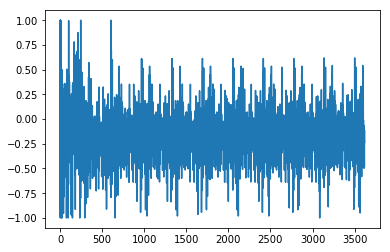

1.47435607036
[ 0.77777778  0.77777778  0.66666667  0.66666667  0.66666667  0.77777778
  0.77777778  0.77777778  0.66666667  0.66666667  0.77777778  0.77777778
  0.66666667  0.66666667  0.66666667  0.77777778  0.77777778  0.77777778
  0.77777778  0.77777778  0.77777778  0.77777778  0.77777778  0.66666667
  0.66666667  0.66666667  0.66666667  1.          0.11111111  0.77777778
  0.77777778  0.77777778  0.77777778  0.33333333  0.77777778  0.77777778
  0.77777778  0.77777778  0.66666667  0.66666667  0.66666667  0.77777778
  0.77777778  0.77777778  0.44444444  0.55555556  0.77777778  0.77777778
  0.66666667  0.66666667  0.77777778  0.77777778  0.55555556  0.77777778
  0.77777778  0.77777778  0.77777778  0.77777778  0.77777778]
Writing away results
1984-09-01 00:00:00


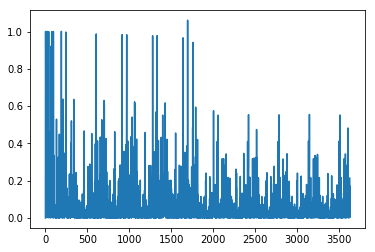

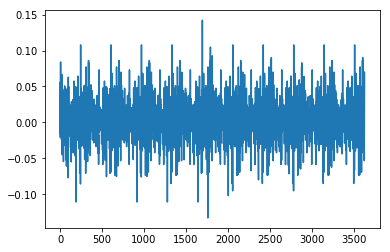

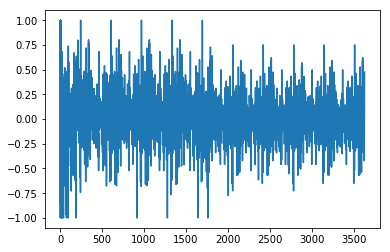

1.64881744781
[ 0.55555556  0.55555556  0.66666667  0.66666667  0.55555556  0.55555556
  0.55555556  0.66666667  0.66666667  0.55555556  0.55555556  0.66666667
  0.66666667  0.66666667  0.55555556  0.55555556  0.55555556  0.55555556
  0.55555556  0.55555556  0.44444444  0.55555556  0.33333333  0.66666667
  0.22222222  0.33333333  0.66666667  0.33333333  0.66666667  0.55555556
  0.55555556  0.44444444  0.66666667  0.66666667  0.55555556  0.55555556
  0.33333333  0.33333333  0.66666667  0.66666667  0.55555556  0.55555556
  0.55555556  0.33333333  0.66666667  1.          0.55555556  0.33333333
  0.66666667  0.55555556  0.33333333  0.66666667  0.66666667  0.55555556
  0.33333333  0.66666667  0.55555556  0.55555556  0.55555556]
Writing away results
1984-10-01 00:00:00


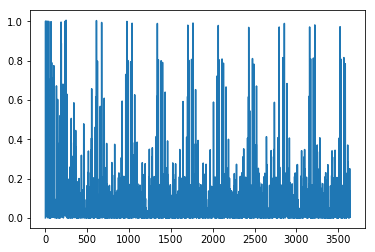

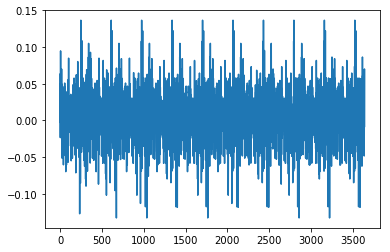

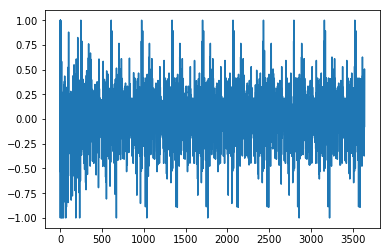

1.62326175748
[ 1.          0.66666667  0.66666667  0.88888889  0.88888889  1.
  0.66666667  0.66666667  0.88888889  1.          1.          0.66666667
  0.66666667  0.88888889  1.          1.          1.          1.          1.
  1.          0.88888889  1.          0.66666667  0.22222222  1.
  0.66666667  1.          0.66666667  0.88888889  1.          1.
  0.66666667  0.66666667  0.88888889  1.          1.          0.66666667
  0.66666667  0.66666667  0.88888889  1.          1.          1.
  0.66666667  0.88888889  0.88888889  1.          0.66666667  0.88888889
  1.          0.66666667  0.66666667  0.88888889  1.          0.66666667
  1.          1.          1.          0.88888889]
Writing away results
1984-11-01 00:00:00


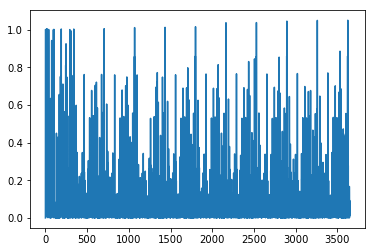

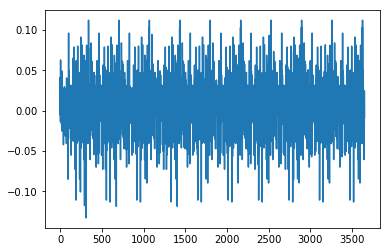

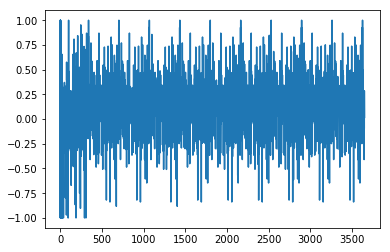

1.71170394424
[ 0.88888889  0.88888889  1.          1.          0.66666667  0.88888889
  0.88888889  1.          0.66666667  0.88888889  0.22222222  0.88888889
  1.          1.          0.66666667  0.88888889  0.88888889  0.66666667
  0.88888889  0.88888889  0.66666667  0.88888889  1.          0.66666667
  0.88888889  0.66666667  0.88888889  1.          0.66666667  0.88888889
  0.88888889  0.88888889  1.          0.66666667  0.66666667  0.22222222
  0.22222222  0.22222222  1.          0.66666667  0.66666667  0.66666667
  0.88888889  1.          1.          0.66666667  0.88888889  1.
  0.66666667  0.88888889  0.88888889  1.          0.66666667  0.88888889
  1.          0.66666667  0.88888889  1.          0.66666667]
Writing away results
1984-12-01 00:00:00


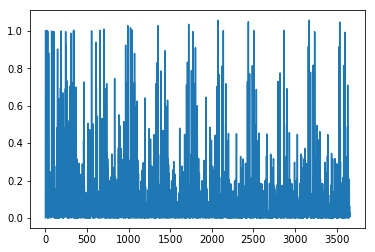

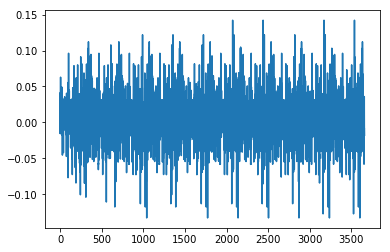

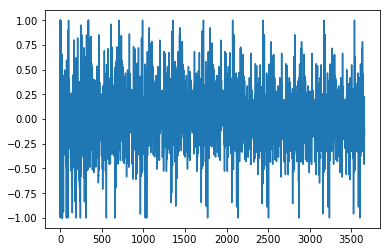

1.59198093436
[ 1.          1.          1.          1.          0.88888889  1.          1.
  1.          0.88888889  0.88888889  0.88888889  1.          1.          1.
  1.          1.          1.          1.          1.          0.66666667
  0.88888889  0.44444444  0.66666667  0.88888889  0.66666667  1.          1.
  1.          0.88888889  0.88888889  0.88888889  1.          1.          1.
  0.66666667  0.88888889  0.88888889  0.33333333  1.          1.          1.
  0.88888889  1.          1.          0.66666667  0.88888889  1.
  0.66666667  0.88888889  1.          1.          0.66666667  0.88888889
  1.          1.          1.          1.          1.          0.88888889]
Writing away results
1985-01-01 00:00:00


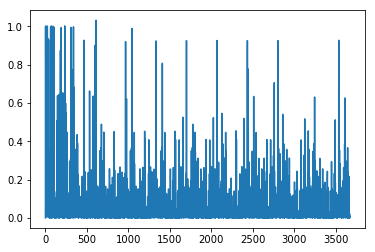

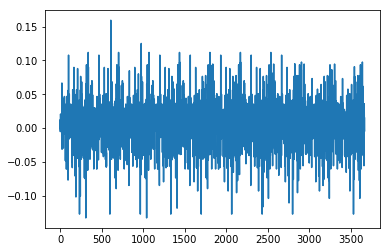

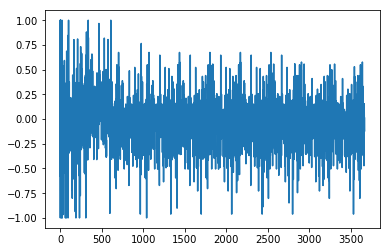

1.45639923509
[ 0.66666667  0.77777778  0.66666667  0.66666667  0.66666667  0.88888889
  0.88888889  0.66666667  0.66666667  0.66666667  0.77777778  0.77777778
  0.66666667  0.66666667  0.66666667  0.88888889  0.66666667  0.66666667
  0.55555556  0.66666667  0.77777778  0.66666667  0.66666667  0.55555556
  0.66666667  0.77777778  0.55555556  0.66666667  1.          0.66666667
  0.77777778  0.77777778  1.          0.33333333  0.66666667  0.66666667
  0.77777778  0.55555556  0.66666667  0.66666667  1.          0.77777778
  0.77777778  0.33333333  0.66666667  0.77777778  0.77777778  0.66666667
  0.66666667  0.77777778  0.66666667  0.66666667  0.77777778  0.66666667
  0.66666667  0.88888889  0.55555556  0.66666667  0.66666667]
Writing away results
1985-02-01 00:00:00


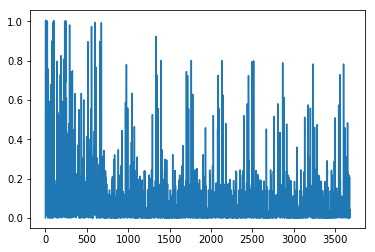

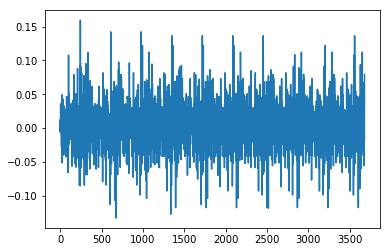

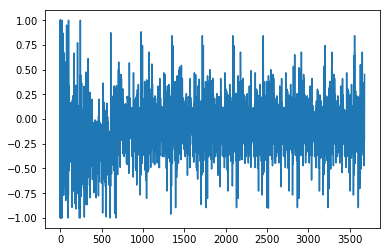

1.6697729643
[ 0.77777778  1.          0.66666667  0.66666667  1.          1.
  0.66666667  0.66666667  0.66666667  1.          1.          1.
  0.66666667  1.          1.          0.66666667  1.          0.66666667
  0.66666667  0.11111111  0.66666667  0.11111111  1.          0.66666667
  0.77777778  1.          0.66666667  0.66666667  0.44444444  0.77777778
  1.          0.11111111  0.66666667  0.66666667  0.66666667  1.          1.
  1.          0.66666667  0.11111111  0.44444444  0.77777778  0.66666667
  0.66666667  0.77777778  0.77777778  0.66666667  0.77777778  0.77777778
  0.66666667  0.66666667  1.          1.          0.66666667  1.          1.
  0.66666667  0.66666667  0.77777778]
Writing away results
1985-03-01 00:00:00


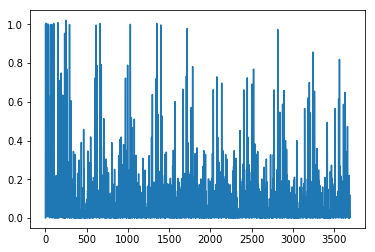

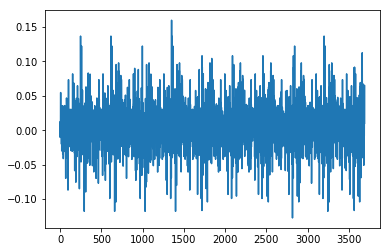

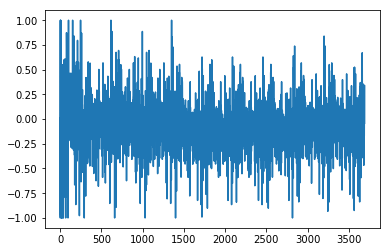

1.2973845254
[ 1.          0.66666667  0.66666667  1.          1.          0.66666667
  0.66666667  0.66666667  1.          1.          1.          1.          1.
  1.          1.          1.          0.66666667  0.66666667  0.55555556
  0.66666667  1.          0.11111111  1.          0.77777778  1.
  0.88888889  0.66666667  0.77777778  0.77777778  0.77777778  0.88888889
  0.66666667  0.66666667  0.55555556  1.          1.          1.
  0.66666667  0.22222222  1.          0.77777778  0.66666667  0.66666667
  0.77777778  0.77777778  0.66666667  0.77777778  0.77777778  0.66666667
  1.          1.          1.          1.          1.          1.
  0.66666667  0.66666667  0.77777778  0.88888889]
Writing away results
1985-04-01 00:00:00


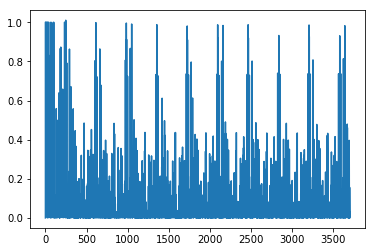

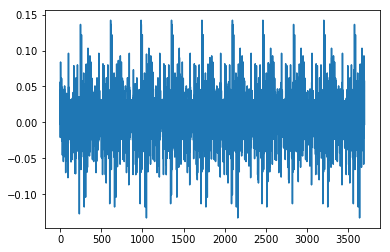

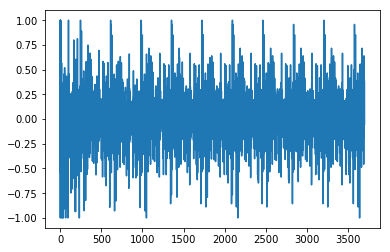

1.48315365394
[ 0.88888889  0.88888889  0.66666667  1.          0.88888889  0.88888889
  0.88888889  0.66666667  1.          1.          1.          1.          1.
  1.          0.88888889  1.          0.88888889  0.          1.
  0.88888889  1.          0.88888889  0.66666667  1.          0.88888889
  0.88888889  0.88888889  0.66666667  1.          1.          0.88888889
  0.88888889  0.88888889  0.66666667  1.          1.          1.
  0.88888889  1.          0.66666667  1.          0.88888889  0.66666667
  1.          0.88888889  0.88888889  0.66666667  1.          0.88888889
  1.          1.          1.          0.66666667  1.          0.88888889
  0.88888889  0.66666667  0.          0.88888889]
Writing away results
1985-05-01 00:00:00


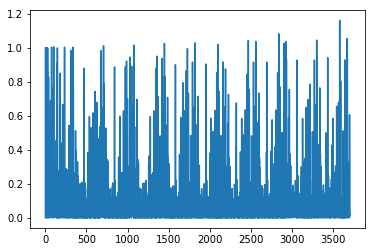

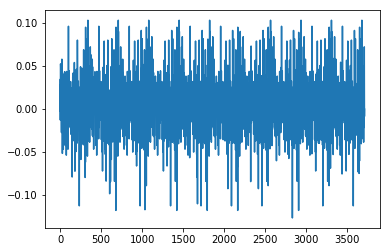

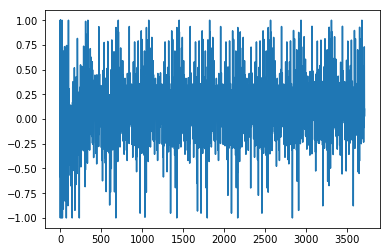

1.34192524702
[ 0.88888889  0.66666667  0.66666667  0.88888889  0.          0.88888889
  0.88888889  0.66666667  0.66666667  0.88888889  0.88888889  0.66666667
  0.88888889  0.88888889  0.          0.88888889  0.          0.66666667
  0.88888889  0.66666667  0.88888889  0.66666667  0.66666667  0.88888889
  0.88888889  0.88888889  0.66666667  0.66666667  0.66666667  0.          0.
  0.88888889  0.66666667  0.66666667  0.66666667  0.88888889  0.88888889
  0.66666667  0.66666667  0.          0.88888889  0.66666667  0.66666667
  0.88888889  0.88888889  0.66666667  0.66666667  0.88888889  0.66666667
  0.66666667  0.88888889  0.66666667  0.66666667  0.88888889  0.88888889
  0.11111111  0.          0.88888889  0.88888889]
Writing away results
1985-06-01 00:00:00


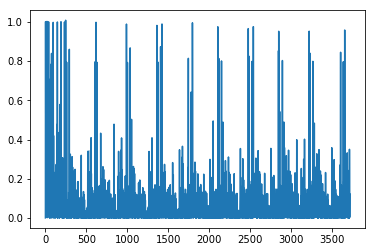

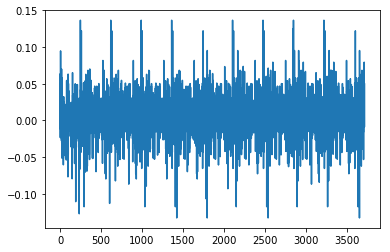

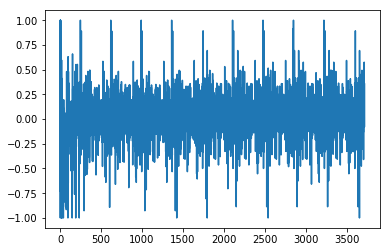

1.2809544265
[ 1.          1.          1.          0.          0.44444444  0.33333333
  1.          1.          1.          1.          1.          1.          1.
  1.          0.44444444  0.33333333  1.          0.66666667  1.          1.
  0.33333333  1.          1.          0.44444444  0.44444444  0.33333333
  1.          1.          0.          0.          0.66666667  0.33333333
  1.          1.          1.          0.44444444  1.          0.33333333
  1.          0.44444444  0.33333333  1.          0.44444444  1.
  0.33333333  1.          0.44444444  1.          1.          1.
  0.33333333  1.          1.          0.44444444  0.33333333  0.
  0.44444444  0.66666667  0.33333333]
Writing away results
1985-07-01 00:00:00


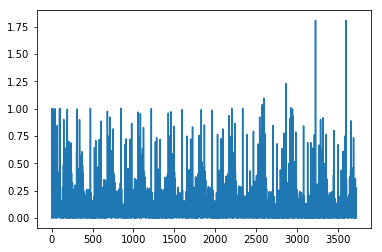

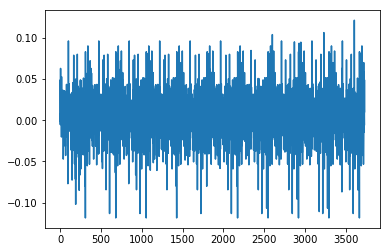

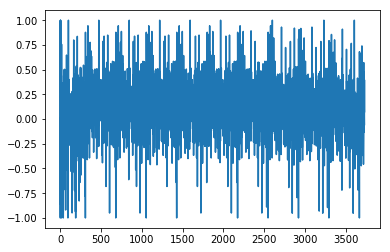

1.22370387572
[ 0.88888889  0.88888889  0.22222222  0.88888889  0.66666667  0.66666667
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.22222222  0.88888889  0.22222222  0.88888889  0.66666667  0.22222222
  0.88888889  0.66666667  0.88888889  0.88888889  0.88888889  0.88888889
  0.66666667  0.88888889  0.88888889  0.22222222  0.22222222  0.66666667
  0.66666667  0.66666667  0.88888889  0.88888889  0.88888889  0.66666667
  0.66666667  0.22222222  0.88888889  0.66666667  0.22222222  0.88888889
  0.88888889  0.66666667  0.88888889  0.88888889  0.66666667  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.66666667
  0.22222222  0.22222222  0.66666667  0.22222222  0.88888889]
Writing away results
1985-08-01 00:00:00


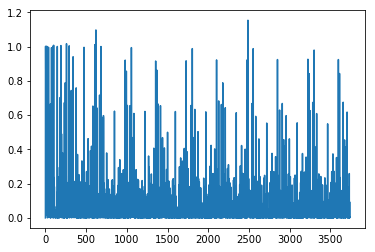

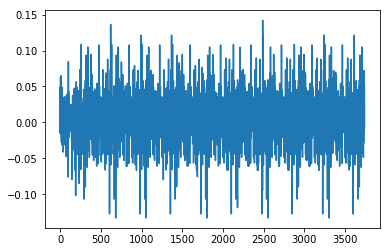

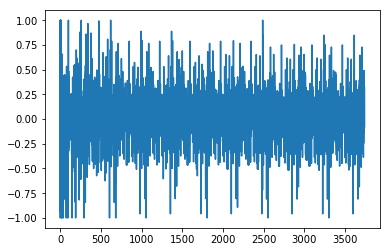

1.45778930291
[ 1.          0.44444444  1.          0.88888889  0.88888889  0.88888889
  1.          0.88888889  0.88888889  1.          1.          0.66666667
  1.          0.33333333  0.88888889  1.          0.88888889  1.
  0.88888889  0.88888889  1.          1.          1.          0.88888889
  0.88888889  0.88888889  0.66666667  0.44444444  0.44444444  0.88888889
  0.88888889  1.          1.          1.          0.88888889  0.88888889
  0.66666667  1.          0.44444444  0.88888889  1.          1.
  0.88888889  1.          1.          0.88888889  0.88888889  1.
  0.88888889  0.88888889  1.          1.          0.44444444  0.66666667
  1.          0.44444444  0.33333333  1.          0.88888889]
Writing away results
1985-09-01 00:00:00


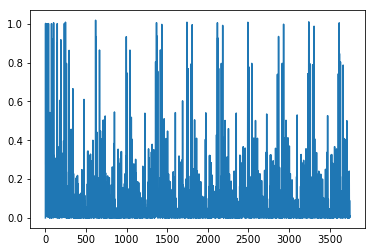

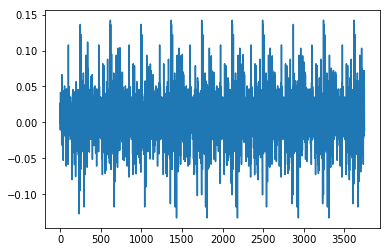

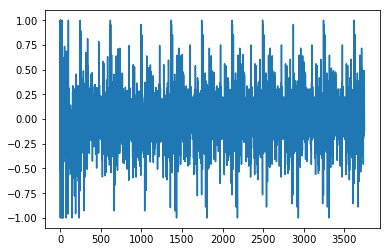

1.24003301178
[ 0.88888889  0.88888889  0.66666667  1.          1.          1.          1.
  1.          1.          1.          1.          1.          0.44444444
  1.          0.66666667  0.44444444  1.          0.44444444  1.          1.
  1.          0.66666667  0.44444444  1.          1.          1.
  0.88888889  0.88888889  0.44444444  1.          1.          1.
  0.66666667  1.          0.44444444  1.          1.          0.44444444
  0.44444444  1.          0.66666667  0.44444444  1.          1.          1.
  1.          1.          0.44444444  1.          1.          1.
  0.88888889  0.          1.          0.66666667  0.77777778  1.
  0.44444444  1.        ]
Writing away results
1985-10-01 00:00:00


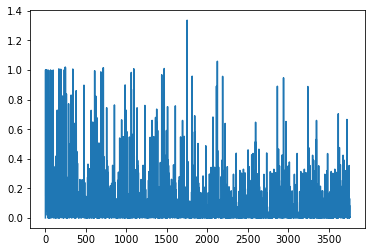

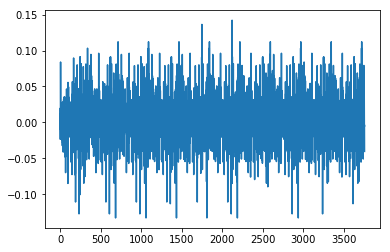

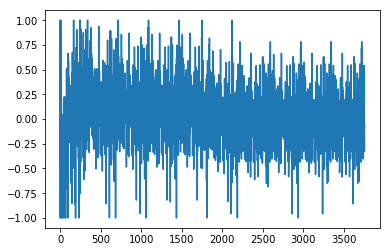

1.28821659854
[ 0.88888889  1.          1.          0.66666667  1.          1.
  0.66666667  0.88888889  1.          0.66666667  0.88888889  0.55555556
  0.66666667  0.88888889  0.66666667  0.88888889  1.          0.66666667
  0.88888889  0.88888889  0.88888889  1.          1.          0.66666667
  0.66666667  0.88888889  0.55555556  1.          1.          0.66666667
  0.88888889  0.88888889  1.          1.          0.66666667  0.88888889
  1.          0.66666667  0.88888889  1.          1.          0.66666667
  0.88888889  1.          0.66666667  1.          1.          0.66666667
  0.88888889  0.88888889  1.          0.66666667  0.88888889  0.55555556
  0.55555556  0.88888889  1.          0.66666667  0.88888889]
Writing away results
1985-11-01 00:00:00


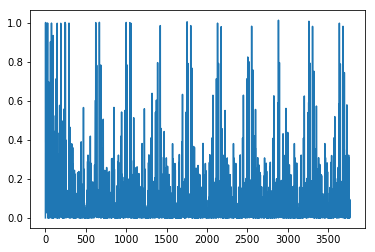

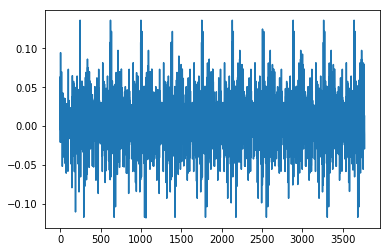

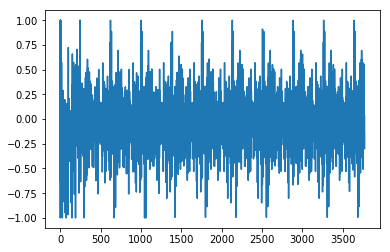

1.27190754786
[ 0.44444444  1.          1.          1.          1.          1.          1.
  0.66666667  1.          0.66666667  0.77777778  1.          0.66666667
  1.          1.          0.77777778  1.          0.66666667  0.66666667
  0.66666667  0.77777778  1.          0.88888889  0.66666667  0.66666667
  0.66666667  0.77777778  1.          1.          1.          0.66666667
  1.          0.77777778  1.          0.66666667  0.77777778  1.
  0.66666667  0.44444444  0.77777778  1.          0.66666667  1.          1.
  1.          0.77777778  1.          0.66666667  0.66666667  0.77777778
  0.77777778  0.66666667  0.77777778  0.77777778  0.66666667  0.77777778
  1.          0.66666667  0.66666667]
Writing away results
1985-12-01 00:00:00


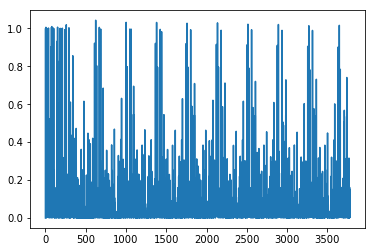

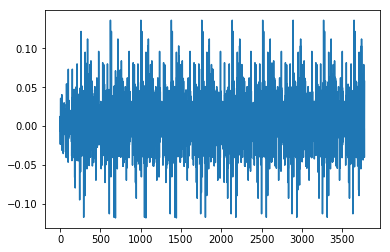

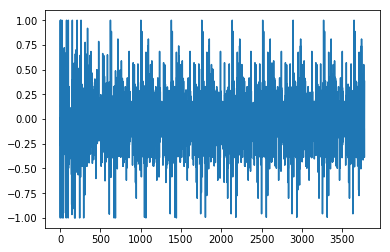

1.61017539455
[ 1.          1.          1.          1.          1.          0.88888889
  0.88888889  1.          0.88888889  0.33333333  1.          0.88888889
  1.          0.88888889  1.          1.          0.88888889  0.88888889
  0.88888889  1.          1.          0.          0.          0.88888889
  0.33333333  1.          1.          1.          0.88888889  0.88888889
  1.          0.77777778  0.          0.88888889  0.77777778  1.
  0.88888889  0.88888889  1.          1.          0.88888889  1.          1.
  1.          1.          1.          0.88888889  0.88888889  0.77777778
  0.          0.88888889  0.33333333  0.          0.88888889  1.          1.
  0.88888889  0.          0.33333333]
Writing away results
1986-01-01 00:00:00


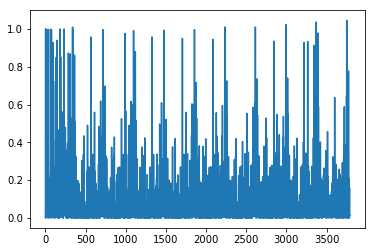

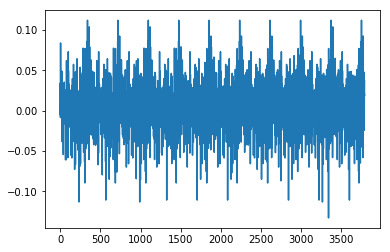

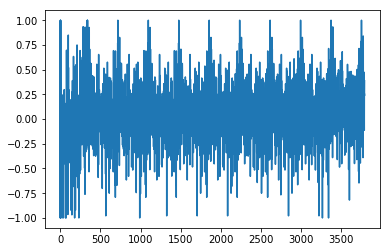

1.33958205939
[ 1.          0.66666667  1.          1.          0.66666667  0.66666667
  0.33333333  0.66666667  0.88888889  0.33333333  0.66666667  0.33333333
  0.66666667  1.          0.33333333  0.66666667  0.66666667  0.66666667
  1.          1.          0.33333333  0.33333333  0.66666667  0.66666667
  1.          1.          0.66666667  0.66666667  0.66666667  1.          1.
  0.33333333  0.66666667  1.          0.33333333  0.66666667  1.          1.
  0.33333333  0.66666667  1.          1.          0.66666667  1.
  0.33333333  0.66666667  0.66666667  1.          0.33333333  0.66666667
  0.66666667  0.33333333  0.66666667  1.          0.33333333  0.66666667
  0.33333333  0.          1.        ]
Writing away results
1986-02-01 00:00:00


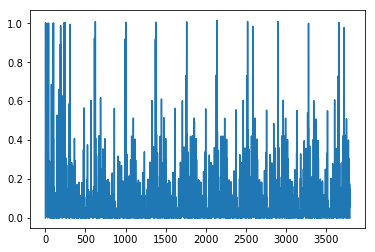

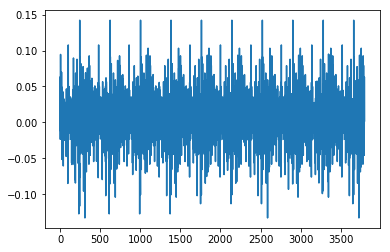

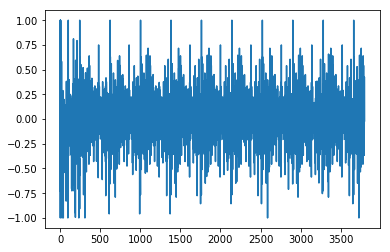

1.12585065933
[ 1.          1.          0.66666667  1.          1.          0.66666667
  1.          0.44444444  0.66666667  0.88888889  0.66666667  1.
  0.44444444  0.66666667  1.          1.          1.          0.44444444
  1.          1.          0.66666667  0.88888889  0.88888889  0.44444444
  0.66666667  1.          1.          1.          1.          0.44444444
  0.66666667  1.          0.44444444  0.66666667  1.          1.
  0.44444444  1.          1.          0.44444444  1.          1.
  0.44444444  0.66666667  1.          1.          0.44444444  0.          1.
  0.88888889  0.          1.          0.44444444  0.66666667  0.88888889
  0.88888889  0.88888889  0.88888889  0.44444444]
Writing away results
1986-03-01 00:00:00


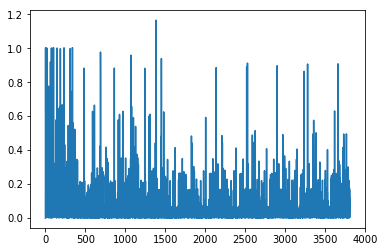

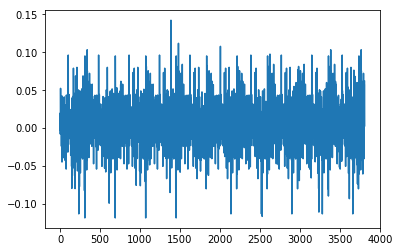

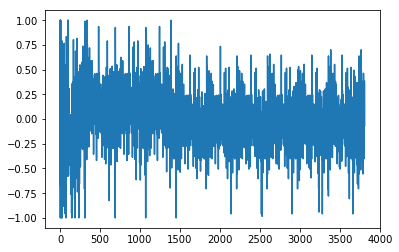

1.10509503559
[ 0.88888889  0.88888889  0.88888889  0.88888889  0.          0.88888889
  0.66666667  0.88888889  0.88888889  0.55555556  0.88888889  0.44444444
  0.88888889  0.88888889  0.88888889  0.88888889  0.44444444  0.88888889
  0.88888889  0.          0.88888889  0.77777778  0.77777778  0.44444444
  0.88888889  0.88888889  0.88888889  0.88888889  1.          0.
  0.88888889  0.44444444  0.11111111  0.88888889  0.88888889  0.22222222
  0.88888889  0.88888889  0.44444444  0.88888889  0.88888889  0.44444444
  0.88888889  0.88888889  0.88888889  0.44444444  0.          0.88888889
  0.77777778  0.          0.88888889  1.          0.88888889  0.66666667
  0.          0.          0.77777778  0.44444444  0.88888889]
Writing away results
1986-04-01 00:00:00


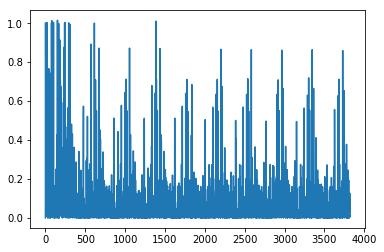

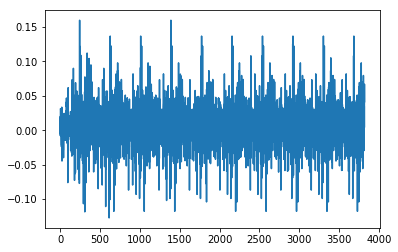

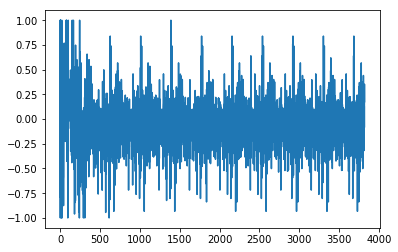

1.46406739226
[ 1.          1.          1.          1.          0.66666667  0.77777778
  0.66666667  0.33333333  1.          0.66666667  0.77777778  1.
  0.66666667  0.66666667  0.66666667  0.77777778  0.77777778  0.22222222
  0.66666667  0.66666667  0.66666667  0.77777778  1.          0.22222222
  0.66666667  0.33333333  0.66666667  0.77777778  0.66666667  0.66666667
  0.77777778  0.77777778  0.66666667  0.44444444  0.77777778  0.66666667
  0.66666667  0.88888889  1.          0.66666667  0.77777778  1.
  0.66666667  0.66666667  0.77777778  0.          0.66666667  0.77777778
  0.77777778  0.66666667  0.77777778  1.          0.66666667  0.66666667
  0.66666667  0.88888889  0.77777778  1.          1.        ]
Writing away results
1986-05-01 00:00:00


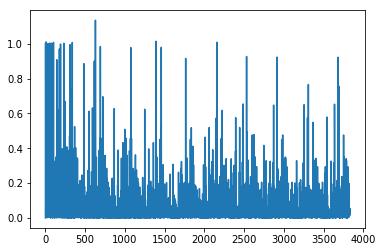

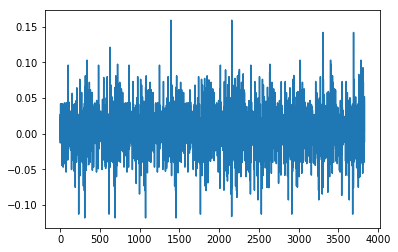

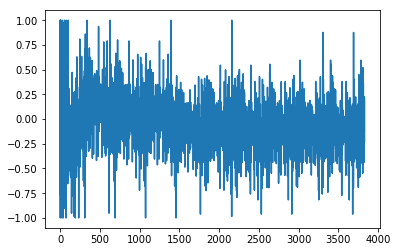

1.24161313288
[ 0.66666667  0.66666667  0.88888889  0.66666667  0.11111111  0.88888889
  0.88888889  0.77777778  0.66666667  0.77777778  0.55555556  0.66666667
  0.66666667  0.66666667  0.77777778  0.77777778  0.66666667  0.88888889
  0.88888889  0.88888889  0.77777778  0.77777778  0.66666667  0.66666667
  0.66666667  0.77777778  0.77777778  0.66666667  0.66666667  0.77777778
  0.77777778  0.66666667  0.77777778  0.77777778  0.66666667  0.66666667
  0.77777778  0.66666667  0.66666667  0.77777778  0.55555556  0.66666667
  0.88888889  0.77777778  0.22222222  0.88888889  0.11111111  0.77777778
  0.66666667  0.77777778  0.55555556  0.88888889  0.88888889  0.88888889
  0.77777778  0.77777778  0.55555556  0.66666667  0.77777778]
Writing away results
1986-06-01 00:00:00


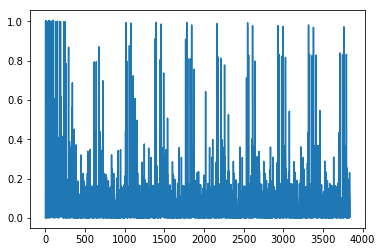

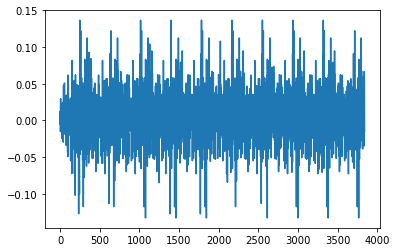

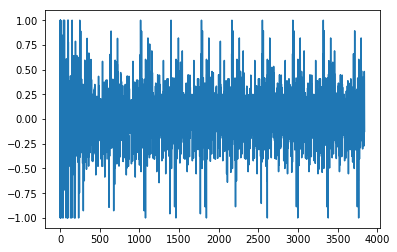

1.17658270659
[ 1.          0.22222222  0.55555556  0.22222222  1.          0.55555556
  1.          1.          1.          1.          1.          0.55555556
  0.55555556  1.          1.          1.          0.22222222  0.55555556
  0.55555556  1.          1.          1.          1.          0.55555556
  1.          1.          0.22222222  0.55555556  1.          1.
  0.55555556  1.          1.          1.          0.55555556  1.          1.
  1.          1.          1.          0.55555556  0.55555556  0.55555556
  0.22222222  0.55555556  0.55555556  0.22222222  1.          1.          1.
  0.55555556  0.55555556  0.55555556  0.11111111  1.          1.          1.
  1.          1.        ]
Writing away results
1986-07-01 00:00:00


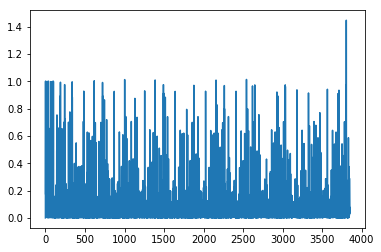

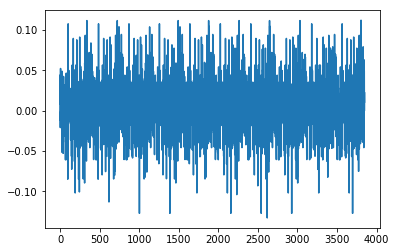

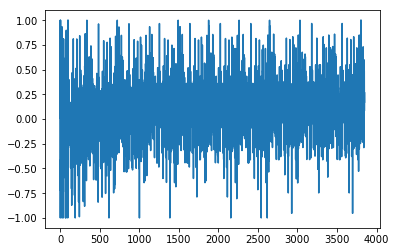

1.2527239445
[ 0.66666667  1.          0.88888889  0.66666667  1.          0.66666667
  1.          0.88888889  0.66666667  1.          1.          1.
  0.88888889  0.66666667  0.66666667  0.66666667  1.          1.
  0.88888889  0.66666667  0.66666667  0.66666667  1.          0.88888889
  0.88888889  0.66666667  1.          0.88888889  0.66666667  1.          1.
  0.88888889  0.66666667  1.          0.88888889  0.66666667  1.
  0.88888889  0.66666667  1.          1.          0.88888889  0.66666667
  1.          1.          0.          1.          0.88888889  0.66666667
  1.          0.          0.          0.88888889  0.88888889  0.66666667
  1.          0.66666667  0.66666667  1.        ]
Writing away results
1986-08-01 00:00:00


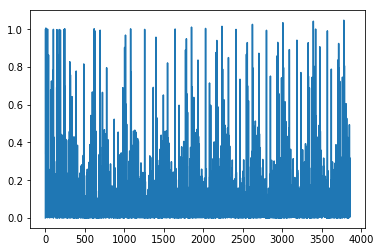

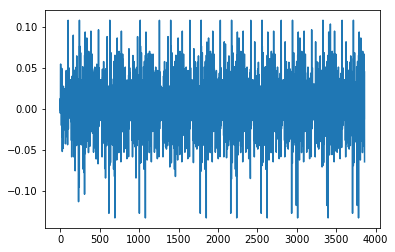

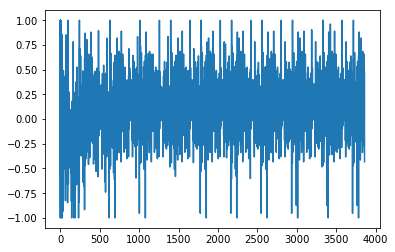

1.14499062223
[ 1.          0.22222222  0.55555556  0.66666667  0.55555556  1.          1.
  1.          1.          1.          1.          0.22222222  1.          1.
  0.55555556  0.66666667  0.66666667  0.22222222  1.          1.          1.
  1.          1.          0.22222222  0.55555556  1.          0.22222222
  0.55555556  1.          1.          0.22222222  1.          1.          1.
  1.          1.          1.          1.          1.          0.66666667
  0.22222222  0.55555556  0.66666667  0.66666667  0.22222222  1.
  0.22222222  0.55555556  0.66666667  0.66666667  0.66666667  0.66666667
  0.22222222  1.          1.          1.          1.          1.
  0.22222222]
Writing away results
1986-09-01 00:00:00


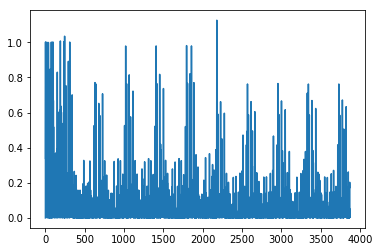

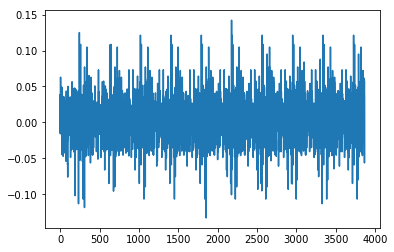

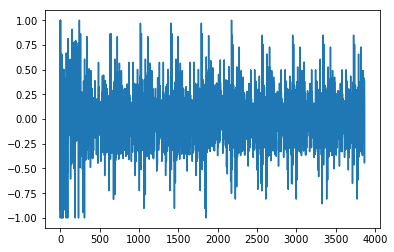

1.25768296755
[ 0.33333333  0.88888889  0.66666667  0.88888889  0.66666667  0.88888889
  0.88888889  0.66666667  0.66666667  0.66666667  0.88888889  0.88888889
  0.88888889  0.33333333  0.33333333  0.33333333  0.88888889  0.88888889
  0.88888889  0.66666667  0.66666667  0.88888889  0.88888889  0.88888889
  0.66666667  0.55555556  0.88888889  0.66666667  0.66666667  0.88888889
  0.66666667  0.66666667  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.66666667  0.66666667  0.55555556  0.          0.66666667
  0.33333333  0.          0.66666667  0.88888889  0.88888889  0.33333333
  0.33333333  0.33333333  0.11111111  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.66666667  0.          0.66666667]
Writing away results
1986-10-01 00:00:00


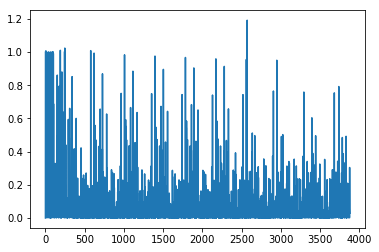

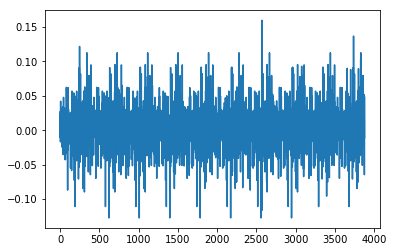

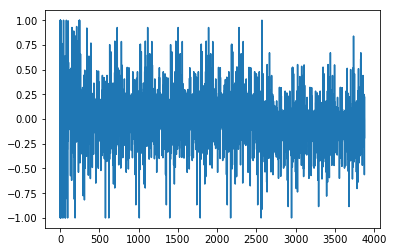

1.09781554371
[ 0.66666667  0.55555556  0.          1.          1.          0.66666667
  0.66666667  0.55555556  0.55555556  1.          0.66666667  0.66666667
  0.          0.55555556  0.55555556  1.          0.66666667  0.66666667
  0.66666667  0.55555556  1.          1.          0.          0.55555556
  1.          0.          0.55555556  1.          0.          0.66666667
  0.55555556  1.          0.66666667  0.66666667  1.          0.66666667
  0.55555556  0.55555556  1.          0.          0.55555556  0.55555556
  0.          0.66666667  1.          0.66666667  0.55555556  0.55555556
  0.55555556  1.          1.          0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.          0.66666667  0.55555556]
Writing away results
1986-11-01 00:00:00


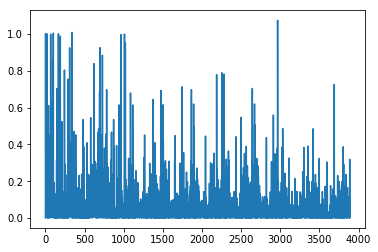

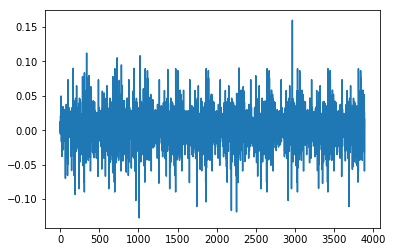

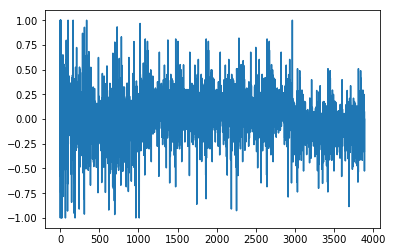

1.20061495923
[ 0.66666667  0.33333333  0.66666667  0.44444444  0.33333333  0.66666667
  0.66666667  0.66666667  0.44444444  0.44444444  0.66666667  0.11111111
  0.11111111  0.22222222  0.44444444  0.44444444  0.66666667  0.66666667
  0.66666667  0.44444444  0.44444444  0.11111111  0.66666667  0.44444444
  0.33333333  0.66666667  0.66666667  0.44444444  0.66666667  0.66666667
  0.44444444  0.66666667  0.66666667  0.44444444  0.33333333  0.66666667
  0.66666667  0.44444444  0.11111111  0.66666667  0.22222222  0.11111111
  0.66666667  0.44444444  0.33333333  0.11111111  0.11111111  0.22222222
  0.22222222  0.44444444  0.33333333  0.66666667  0.44444444  0.66666667
  0.66666667  0.11111111  0.66666667  0.66666667  0.33333333]
Writing away results
1986-12-01 00:00:00


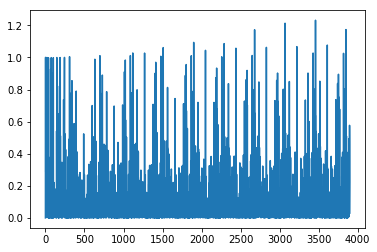

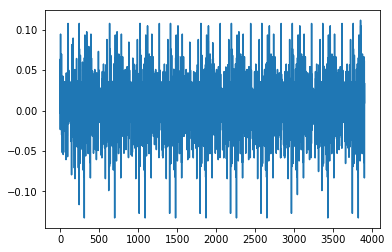

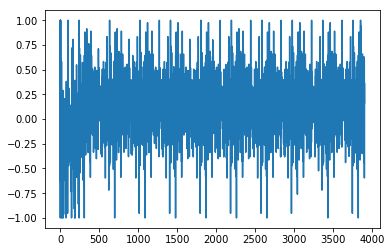

1.30806812586
[ 0.55555556  1.          1.          0.55555556  1.          1.          1.
  1.          1.          1.          0.55555556  0.66666667  0.66666667
  0.88888889  0.55555556  1.          1.          1.          1.          1.
  0.55555556  1.          0.88888889  0.55555556  1.          1.
  0.55555556  1.          1.          1.          1.          1.          1.
  0.55555556  1.          0.66666667  0.66666667  0.55555556  0.66666667
  0.66666667  0.55555556  1.          1.          0.55555556  0.66666667
  0.66666667  0.66666667  0.66666667  0.88888889  1.          1.          1.
  1.          1.          0.55555556  1.          1.          0.55555556
  1.        ]
Writing away results
1987-01-01 00:00:00


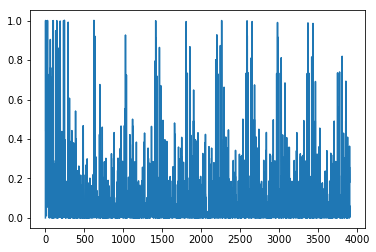

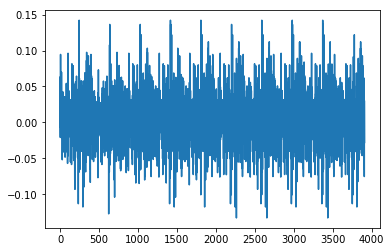

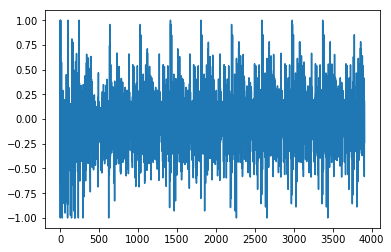

1.22097602276
[ 1.          1.          1.          1.          0.88888889  0.88888889
  1.          1.          1.          0.88888889  0.88888889  0.88888889
  0.77777778  1.          1.          1.          0.88888889  1.          1.
  1.          0.88888889  1.          1.          0.88888889  0.88888889
  1.          1.          0.88888889  1.          1.          1.          1.
  1.          0.88888889  0.88888889  0.77777778  0.11111111  0.88888889
  0.88888889  0.11111111  1.          1.          1.          0.88888889
  0.88888889  0.88888889  0.77777778  1.          1.          1.          1.
  1.          1.          1.          1.          0.88888889  1.          1.
  0.88888889]
Writing away results
1987-02-01 00:00:00


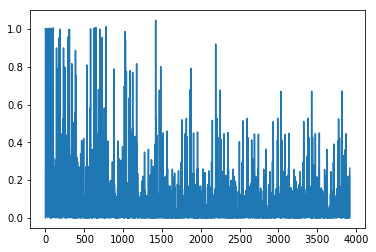

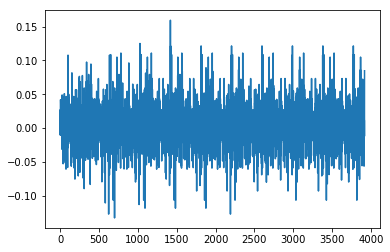

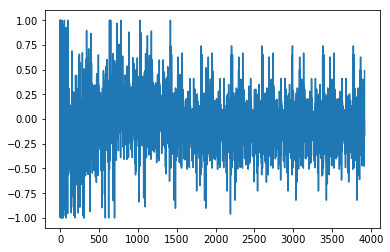

1.28680362657
[ 0.88888889  0.88888889  0.66666667  0.66666667  0.66666667  0.88888889
  0.88888889  0.66666667  0.66666667  0.66666667  1.          0.88888889
  0.88888889  0.88888889  0.66666667  0.66666667  0.88888889  0.
  0.66666667  0.66666667  0.88888889  0.88888889  0.66666667  1.
  0.88888889  0.88888889  0.66666667  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.66666667  0.66666667  0.77777778  0.44444444
  0.66666667  0.77777778  0.77777778  0.88888889  0.88888889  0.88888889
  0.66666667  0.66666667  0.66666667  0.77777778  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.66666667  0.66666667  0.88888889
  0.66666667  0.88888889  0.88888889  0.66666667  0.88888889]
Writing away results
1987-03-01 00:00:00


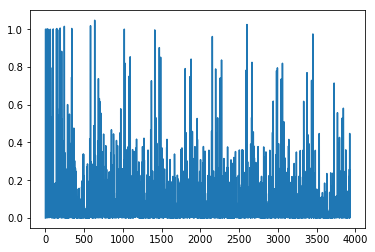

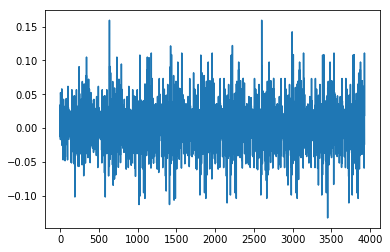

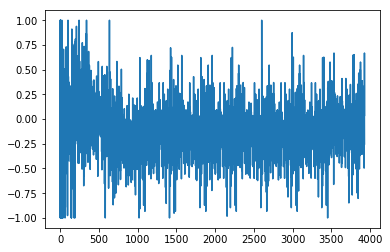

1.19681583176
[ 0.88888889  0.44444444  0.44444444  0.44444444  0.77777778  0.77777778
  0.77777778  0.66666667  0.66666667  0.66666667  0.88888889  0.88888889
  0.77777778  0.88888889  0.11111111  0.33333333  0.77777778  0.88888889
  0.66666667  0.77777778  0.88888889  0.44444444  0.77777778  0.77777778
  0.88888889  0.44444444  0.77777778  0.88888889  0.88888889  0.77777778
  0.88888889  0.66666667  0.66666667  0.77777778  0.66666667  0.66666667
  0.11111111  0.77777778  0.44444444  0.77777778  0.88888889  0.66666667
  0.66666667  0.66666667  0.66666667  0.77777778  0.88888889  0.77777778
  0.77777778  0.88888889  0.44444444  0.77777778  0.66666667  0.77777778
  0.88888889  0.66666667  0.66666667  0.66666667  0.77777778]
Writing away results
1987-04-01 00:00:00


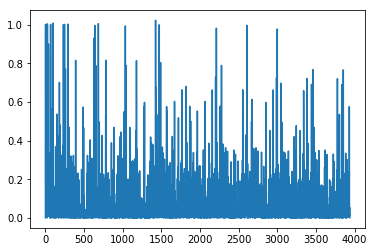

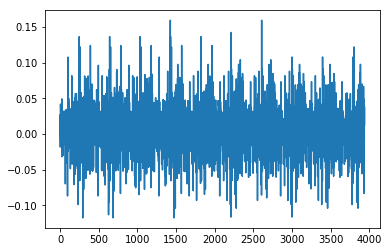

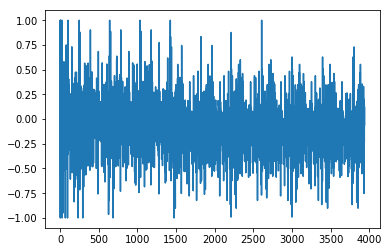

1.16348172959
[ 0.88888889  0.33333333  0.77777778  0.77777778  0.77777778  0.77777778
  0.66666667  0.66666667  0.66666667  0.77777778  1.          0.77777778
  1.          0.77777778  0.77777778  0.77777778  1.          0.66666667
  0.77777778  0.11111111  0.88888889  0.77777778  0.77777778  0.33333333
  0.88888889  0.77777778  1.          0.66666667  0.77777778  1.
  0.66666667  0.66666667  0.77777778  1.          0.66666667  0.77777778
  0.11111111  0.66666667  0.77777778  1.          0.66666667  0.66666667
  0.66666667  0.66666667  0.77777778  1.          0.77777778  0.77777778
  1.          0.88888889  0.77777778  0.66666667  0.77777778  1.
  0.66666667  1.          0.66666667  0.77777778  1.        ]
Writing away results
1987-05-01 00:00:00


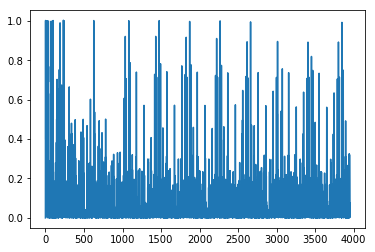

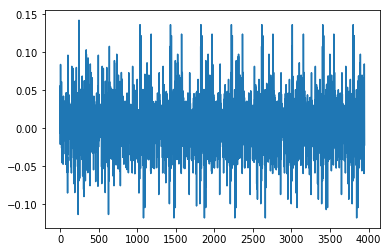

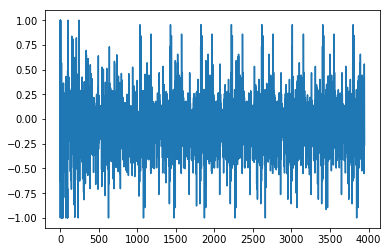

1.18379428877
[ 0.66666667  0.77777778  0.77777778  0.77777778  1.          0.66666667
  0.66666667  0.33333333  0.77777778  1.          1.          1.
  0.33333333  0.66666667  0.77777778  0.66666667  0.66666667  0.77777778
  1.          0.66666667  0.77777778  0.77777778  0.66666667  0.66666667
  1.          1.          1.          0.77777778  1.          0.66666667
  0.66666667  0.77777778  1.          0.66666667  0.77777778  0.77777778
  0.66666667  0.77777778  1.          0.66666667  0.66666667  0.66666667
  0.77777778  0.77777778  1.          1.          1.          1.
  0.66666667  0.77777778  0.66666667  0.77777778  1.          0.66666667
  1.          0.66666667  0.77777778  1.          0.66666667]
Writing away results
1987-06-01 00:00:00


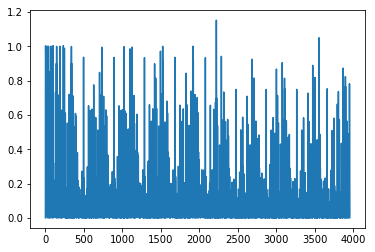

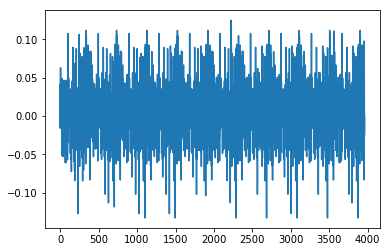

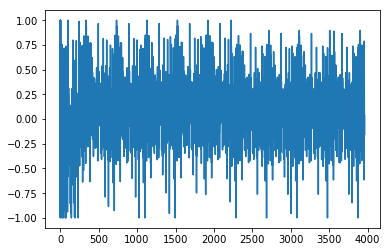

1.16235240838
[ 1.          0.88888889  0.66666667  0.66666667  0.11111111  0.11111111
  0.33333333  0.88888889  0.66666667  1.          1.          1.          1.
  0.88888889  0.66666667  1.          0.88888889  0.66666667  1.          1.
  0.88888889  0.66666667  1.          0.88888889  0.66666667  1.
  0.88888889  0.66666667  1.          1.          0.88888889  0.11111111
  1.          0.88888889  0.11111111  1.          0.88888889  0.66666667
  0.11111111  0.11111111  0.11111111  0.88888889  0.88888889  0.66666667
  1.          0.88888889  0.66666667  1.          0.11111111  1.          1.
  0.66666667  1.          0.11111111  1.          0.88888889  0.66666667
  1.          1.        ]
Writing away results
1987-07-01 00:00:00


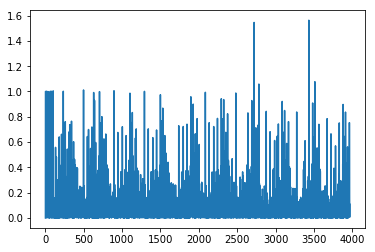

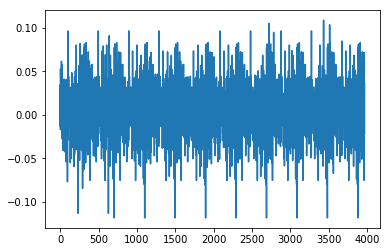

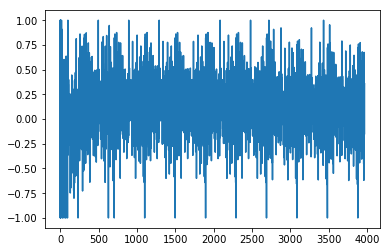

1.09597629198
[ 0.55555556  0.88888889  0.88888889  0.33333333  0.33333333  0.
  0.55555556  0.55555556  0.88888889  0.88888889  0.88888889  0.88888889
  0.55555556  0.33333333  0.88888889  0.55555556  0.55555556  0.88888889
  0.88888889  0.55555556  0.88888889  0.88888889  0.55555556  0.88888889
  0.88888889  0.55555556  0.88888889  0.88888889  0.88888889  0.55555556
  0.33333333  0.88888889  0.          0.55555556  0.88888889  0.55555556
  0.88888889  0.33333333  0.33333333  0.33333333  0.          0.55555556
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.33333333
  0.88888889  0.55555556  0.55555556  0.88888889  0.33333333  0.88888889
  0.55555556  0.88888889  0.88888889  0.88888889  0.55555556]
Writing away results
1987-08-01 00:00:00


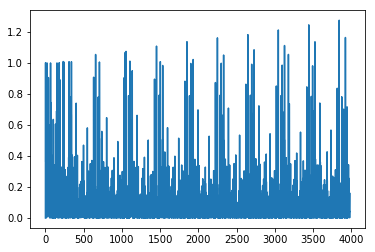

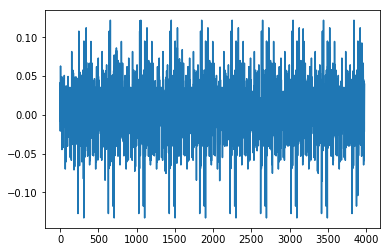

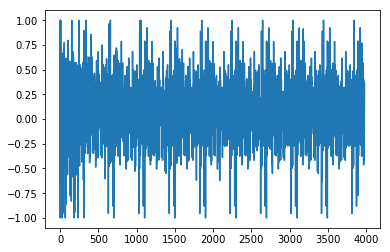

0.954336341818
[ 1.          1.          0.          0.66666667  0.66666667  0.44444444
  1.          1.          1.          0.66666667  1.          1.          0.
  0.66666667  1.          0.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.
  0.66666667  0.66666667  0.66666667  0.          0.66666667  0.66666667
  0.          1.          1.          1.          0.66666667  0.66666667
  0.66666667  0.44444444  1.          1.          1.          1.          1.
  1.          0.          1.          1.          1.          1.          0.
  1.          1.          1.          0.66666667  0.66666667  0.66666667
  0.        ]
Writing away results
1987-09-01 00:00:00


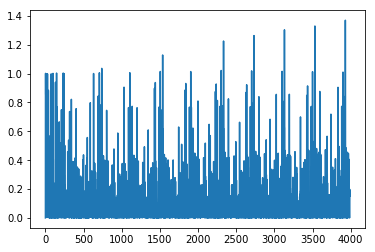

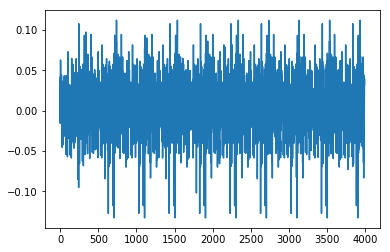

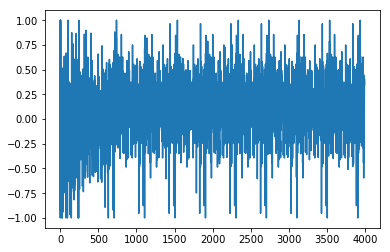

1.0969935859
[ 1.          0.44444444  0.66666667  0.66666667  0.33333333  1.          1.
  1.          0.66666667  1.          1.          0.44444444  0.66666667
  1.          0.44444444  1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          0.66666667
  0.66666667  0.66666667  0.44444444  0.66666667  0.66666667  0.44444444
  1.          1.          0.44444444  0.66666667  0.66666667  0.66666667
  0.66666667  1.          1.          1.          1.          1.          1.
  0.44444444  1.          1.          0.44444444  1.          0.66666667
  1.          1.          1.          1.          0.66666667  0.66666667
  0.44444444  1.        ]
Writing away results
1987-10-01 00:00:00


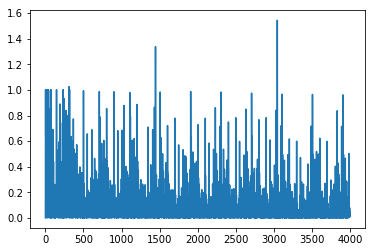

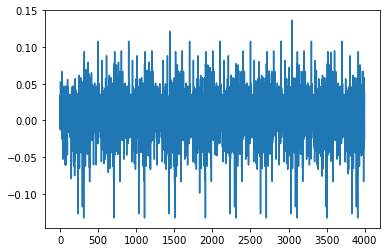

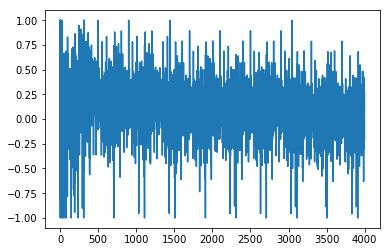

1.37032173622
[ 0.33333333  0.33333333  0.33333333  0.44444444  0.44444444  1.          1.
  1.          1.          0.44444444  0.33333333  1.          0.44444444
  0.44444444  1.          1.          0.44444444  1.          1.
  0.44444444  1.          1.          1.          1.          1.          1.
  0.44444444  0.33333333  0.33333333  0.33333333  0.44444444  1.
  0.44444444  1.          0.33333333  0.33333333  0.33333333  0.44444444
  0.44444444  1.          1.          1.          1.          1.
  0.33333333  1.          1.          0.44444444  1.          0.33333333
  1.          0.44444444  1.          1.          1.          0.33333333
  0.44444444  1.          0.44444444]
Writing away results
1987-11-01 00:00:00


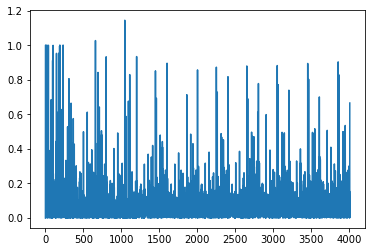

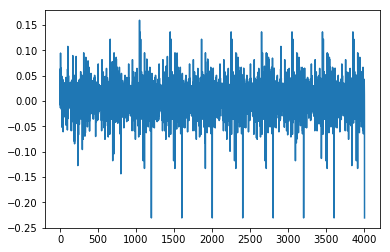

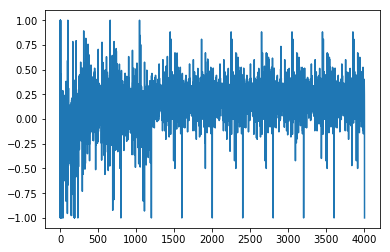

1.35671921816
[ 0.66666667  0.66666667  0.55555556  1.          1.          1.
  0.66666667  1.          0.55555556  0.          0.66666667  0.55555556
  0.          0.66666667  0.66666667  0.55555556  1.          0.66666667
  0.55555556  1.          1.          0.55555556  1.          1.
  0.66666667  0.55555556  0.          0.66666667  0.66666667  0.          1.
  0.55555556  1.          0.          0.          0.66666667  0.55555556
  0.55555556  1.          1.          1.          1.          1.          0.
  1.          0.55555556  1.          1.          0.          1.
  0.55555556  1.          0.66666667  0.66666667  0.55555556  0.
  0.66666667  0.55555556  1.        ]
Writing away results
1987-12-01 00:00:00


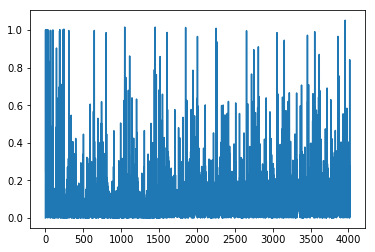

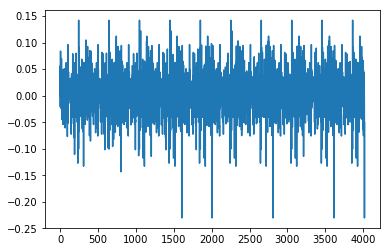

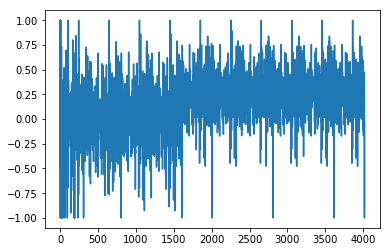

1.44743078507
[ 0.88888889  0.11111111  1.          1.          1.          0.88888889
  1.          1.          0.66666667  0.88888889  1.          0.66666667
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          0.88888889  0.88888889  0.88888889
  0.66666667  0.88888889  0.88888889  0.66666667  1.          1.
  0.66666667  0.88888889  0.88888889  0.88888889  0.88888889  1.          1.
  1.          1.          1.          1.          0.66666667  1.          1.
  0.66666667  1.          0.88888889  1.          1.          1.          1.
  0.88888889  0.88888889  0.66666667  1.          1.          0.66666667
  1.        ]
Writing away results
1988-01-01 00:00:00


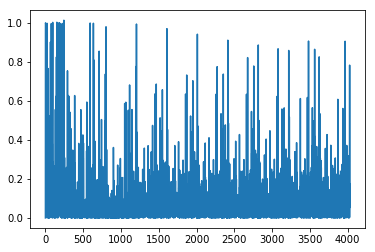

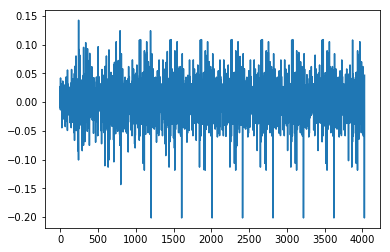

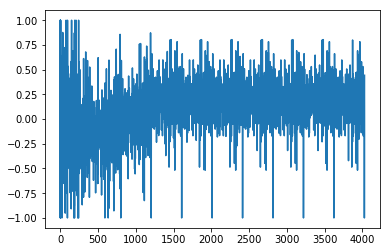

1.30108026293
[ 0.44444444  0.88888889  0.88888889  0.88888889  0.66666667  0.88888889
  0.88888889  0.11111111  0.66666667  0.88888889  0.11111111  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.66666667  0.66666667  0.66666667
  0.11111111  0.66666667  0.66666667  0.11111111  0.88888889  0.88888889
  0.11111111  0.66666667  0.66666667  0.66666667  0.66666667  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.11111111
  0.88888889  0.88888889  0.11111111  0.88888889  0.11111111  0.88888889
  0.88888889  0.88888889  0.88888889  0.66666667  0.66666667  0.11111111
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889]
Writing away results
1988-02-01 00:00:00


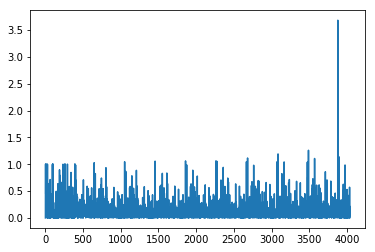

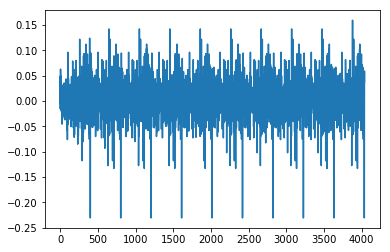

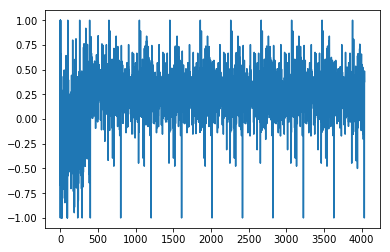

1.33312392296
[ 1.          1.          1.          0.88888889  1.          1.
  0.11111111  0.88888889  1.          0.11111111  0.88888889  1.          1.
  1.          1.          1.          1.          1.          1.          1.
  0.88888889  0.88888889  0.88888889  0.11111111  0.88888889  0.88888889
  0.11111111  1.          1.          0.11111111  0.11111111  0.88888889
  0.88888889  0.88888889  1.          1.          1.          1.          1.
  1.          0.11111111  1.          1.          0.11111111  1.
  0.11111111  1.          1.          1.          0.88888889  0.88888889
  0.88888889  0.11111111  1.          1.          1.          1.          1.
  1.        ]
Writing away results
1988-03-01 00:00:00


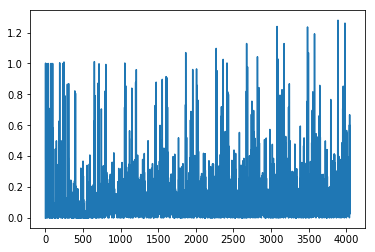

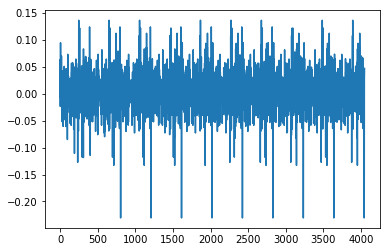

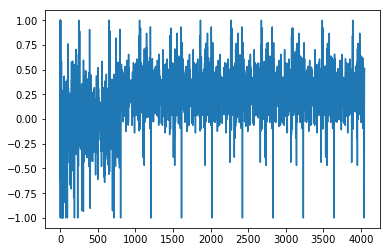

1.27286862495
[ 1.          1.          0.66666667  1.          1.          0.22222222
  0.66666667  1.          0.22222222  0.66666667  1.          1.          1.
  1.          1.          1.          1.          1.          1.
  0.66666667  0.66666667  0.66666667  0.22222222  0.66666667  0.66666667
  0.22222222  1.          1.          1.          0.22222222  0.66666667
  0.66666667  0.66666667  1.          1.          1.          1.          1.
  1.          0.22222222  1.          1.          1.          1.
  0.22222222  1.          1.          1.          0.66666667  0.66666667
  0.66666667  0.22222222  1.          0.22222222  1.          0.66666667
  1.          1.          1.        ]
Writing away results
1988-04-01 00:00:00


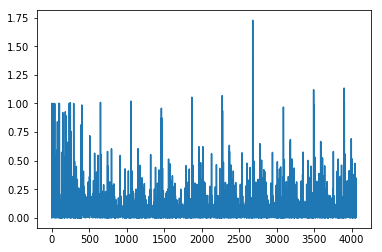

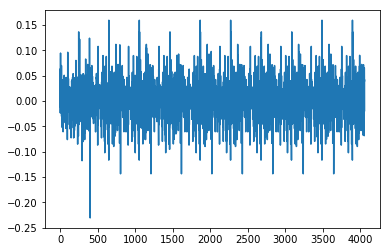

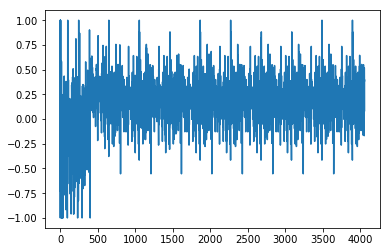

1.43655883802
[ 0.66666667  0.66666667  0.88888889  0.66666667  1.          1.
  0.88888889  0.55555556  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  1.          1.          0.88888889  1.          1.          0.88888889
  0.55555556  0.66666667  0.66666667  0.66666667  1.          1.
  0.88888889  0.88888889  0.88888889  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  1.          0.66666667  0.66666667
  0.66666667  1.          0.88888889  0.66666667  0.66666667  0.66666667
  1.          0.88888889  0.55555556  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667]
Writing away results
1988-05-01 00:00:00


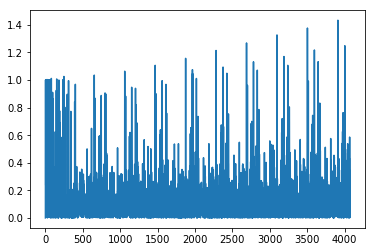

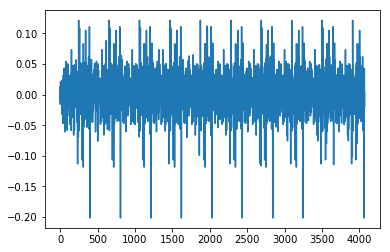

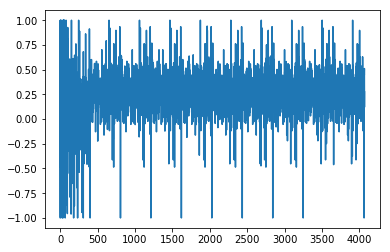

1.28736107752
[ 0.44444444  0.88888889  0.88888889  0.22222222  0.44444444  0.88888889
  0.88888889  0.44444444  0.88888889  0.88888889  0.88888889  0.44444444
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.22222222
  0.44444444  0.44444444  0.22222222  0.44444444  0.44444444  0.22222222
  0.44444444  0.88888889  0.88888889  0.22222222  0.22222222  0.44444444
  0.44444444  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.22222222  0.44444444  0.88888889  0.88888889  0.88888889
  0.22222222  0.44444444  0.88888889  0.88888889  0.22222222  0.44444444
  0.44444444  0.22222222  0.44444444  0.88888889  0.88888889  0.44444444
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889]
Writing away results
1988-06-01 00:00:00


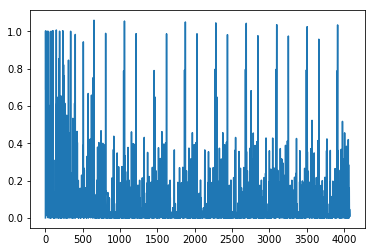

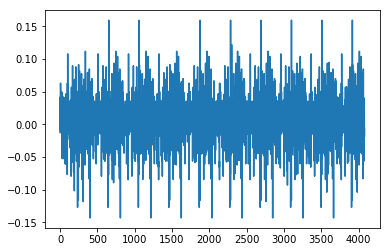

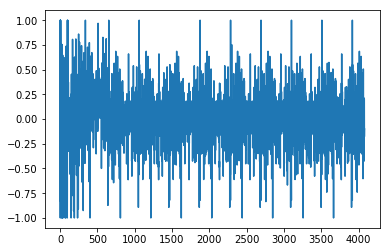

1.32265445531
[ 0.88888889  0.77777778  0.66666667  1.          0.          0.33333333
  1.          1.          0.77777778  0.66666667  1.          0.77777778
  0.66666667  1.          0.77777778  0.66666667  1.          1.          1.
  0.66666667  1.          1.          0.11111111  1.          0.
  0.66666667  1.          1.          1.          1.          0.77777778
  0.66666667  0.77777778  0.77777778  0.66666667  1.          0.          1.
  1.          0.66666667  1.          1.          1.          0.77777778
  0.66666667  1.          1.          1.          0.66666667  1.          0.
  0.66666667  1.          0.77777778  0.77777778  0.66666667  1.
  0.66666667  0.66666667]
Writing away results
1988-07-01 00:00:00


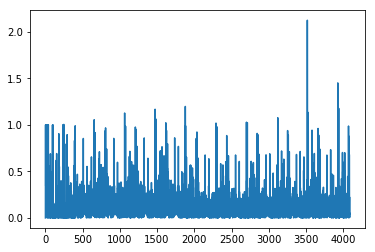

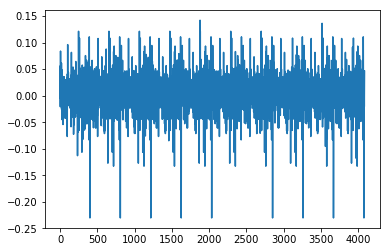

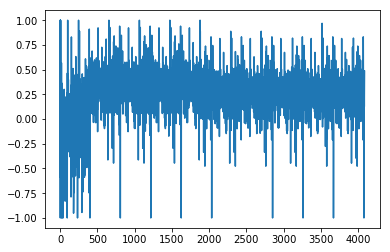

1.46304810369
[ 0.44444444  0.88888889  1.          0.44444444  0.88888889  1.          1.
  0.44444444  1.          1.          1.          1.          1.          1.
  1.          1.          0.22222222  0.44444444  0.88888889  0.22222222
  0.44444444  0.88888889  1.          0.44444444  0.88888889  0.22222222
  0.22222222  0.22222222  0.44444444  0.44444444  1.          1.          1.
  1.          1.          0.44444444  1.          0.44444444  0.88888889
  1.          0.22222222  1.          0.44444444  0.88888889  1.
  0.22222222  0.44444444  0.88888889  1.          0.44444444  0.88888889
  1.          1.          1.          1.          1.          1.
  0.44444444  1.        ]
Writing away results
1988-08-01 00:00:00


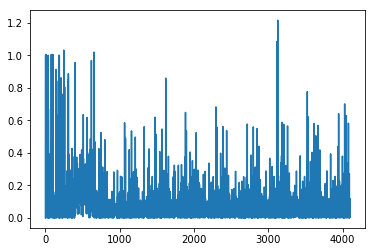

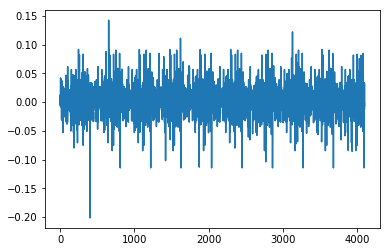

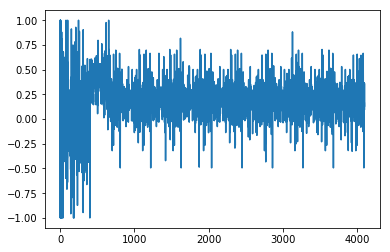

1.47063638767
[ 0.22222222  0.55555556  0.66666667  0.66666667  0.55555556  0.55555556
  0.66666667  0.55555556  0.55555556  0.66666667  0.55555556  0.55555556
  0.55555556  0.66666667  0.55555556  0.22222222  0.          0.22222222
  0.22222222  0.22222222  0.66666667  0.55555556  0.55555556  0.66666667
  0.22222222  0.22222222  0.22222222  0.66666667  0.66666667  0.66666667
  0.55555556  0.55555556  0.55555556  0.55555556  0.22222222  0.55555556
  0.55555556  0.66666667  0.55555556  0.22222222  0.55555556  0.66666667
  0.66666667  0.55555556  0.22222222  0.          0.66666667  0.55555556
  0.66666667  0.66666667  0.55555556  0.66666667  0.55555556  0.55555556
  0.55555556  0.55555556  0.66666667  0.55555556  0.55555556]
Writing away results
1988-09-01 00:00:00


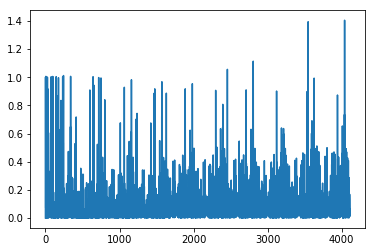

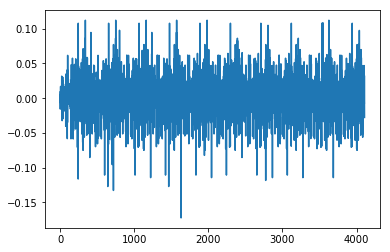

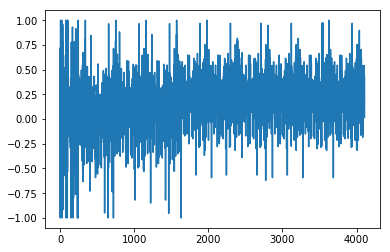

1.37498157954
[ 0.55555556  1.          0.33333333  0.55555556  0.55555556  1.
  0.55555556  0.55555556  1.          0.55555556  0.55555556  0.55555556
  0.33333333  0.55555556  0.66666667  1.          0.33333333  0.66666667
  0.66666667  0.33333333  0.55555556  1.          0.33333333  0.66666667
  0.66666667  0.66666667  1.          1.          0.55555556  0.55555556
  0.55555556  0.55555556  0.55555556  0.33333333  0.55555556  0.55555556
  0.33333333  0.55555556  0.66666667  0.55555556  1.          0.33333333
  0.55555556  0.66666667  0.66666667  0.33333333  0.55555556  1.
  0.33333333  0.55555556  1.          0.55555556  0.55555556  0.55555556
  0.55555556  0.33333333  0.55555556  0.55555556  0.33333333]
Writing away results
1988-10-01 00:00:00


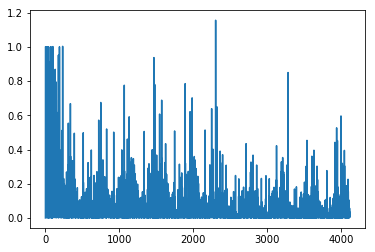

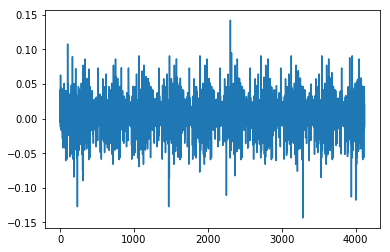

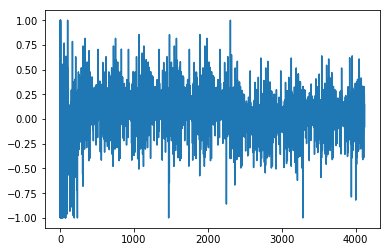

1.35227707022
[ 0.22222222  0.33333333  0.66666667  0.66666667  0.22222222  0.33333333
  0.66666667  0.22222222  0.33333333  0.66666667  0.22222222  0.33333333
  0.66666667  0.66666667  0.22222222  0.33333333  0.66666667  0.66666667
  0.33333333  0.66666667  0.22222222  0.33333333  0.55555556  0.55555556
  0.55555556  0.22222222  0.22222222  0.33333333  0.66666667  0.22222222
  0.33333333  0.66666667  0.22222222  0.66666667  0.66666667  0.33333333
  0.66666667  0.55555556  0.66666667  0.22222222  0.33333333  0.66666667
  0.66666667  0.66666667  0.33333333  0.66666667  0.22222222  0.33333333
  0.66666667  0.22222222  0.22222222  0.33333333  0.66666667  0.66666667
  0.22222222  0.66666667  0.66666667  0.33333333  0.66666667]
Writing away results
1988-11-01 00:00:00


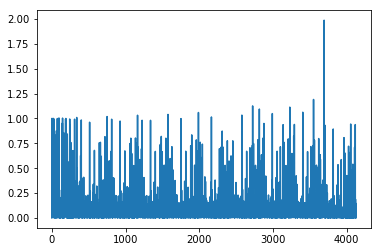

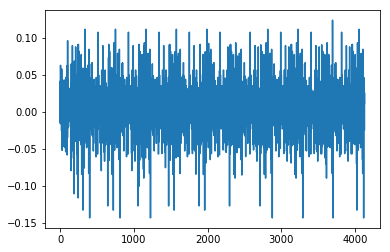

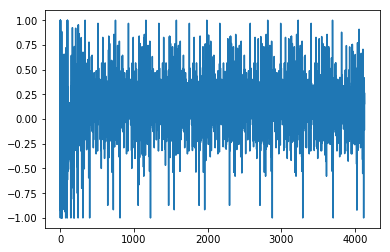

1.43233328032
[ 0.66666667  1.          1.          0.44444444  0.66666667  1.
  0.44444444  0.66666667  1.          0.44444444  0.66666667  1.          1.
  0.44444444  0.66666667  1.          1.          0.44444444  1.
  0.44444444  0.66666667  0.55555556  0.55555556  0.55555556  0.44444444
  0.44444444  0.66666667  1.          0.66666667  0.66666667  1.
  0.44444444  1.          1.          0.66666667  1.          0.44444444
  1.          0.44444444  0.66666667  1.          1.          1.
  0.66666667  1.          0.44444444  0.66666667  1.          0.66666667
  0.44444444  0.66666667  1.          1.          0.66666667  1.          1.
  0.66666667  1.          0.44444444]
Writing away results
1988-12-01 00:00:00


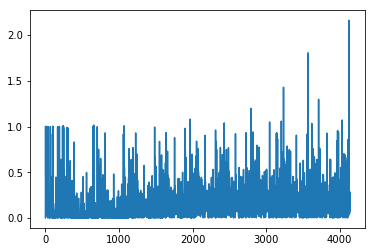

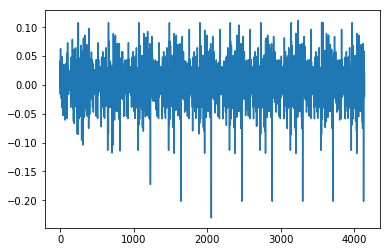

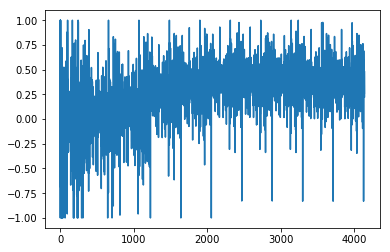

1.42316304451
[ 0.88888889  0.88888889  0.33333333  0.88888889  0.88888889  0.33333333
  0.88888889  0.88888889  0.88888889  0.55555556  0.88888889  0.66666667
  0.33333333  0.11111111  0.66666667  0.66666667  0.55555556  0.88888889
  0.33333333  0.55555556  0.11111111  0.66666667  0.66666667  0.33333333
  0.33333333  0.55555556  0.88888889  0.88888889  0.88888889  0.88888889
  0.11111111  0.88888889  0.88888889  0.55555556  0.88888889  0.11111111
  0.88888889  0.33333333  0.55555556  0.88888889  0.66666667  0.33333333
  0.55555556  0.88888889  0.33333333  0.55555556  0.88888889  0.55555556
  0.88888889  0.88888889  0.88888889  0.88888889  0.11111111  0.88888889
  0.88888889  0.55555556  0.88888889  0.33333333  0.55555556]
Writing away results
1989-01-01 00:00:00


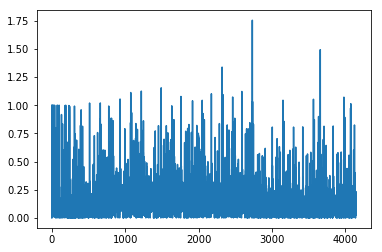

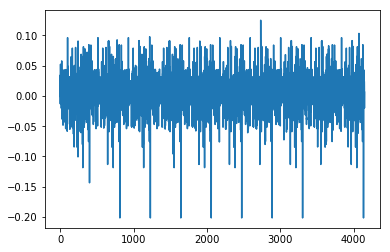

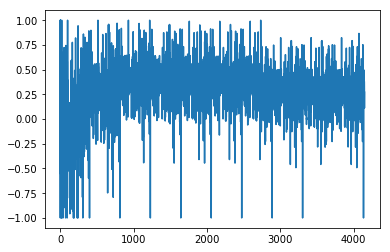

1.43505905547
[ 0.88888889  0.66666667  0.88888889  0.88888889  0.66666667  0.66666667
  0.88888889  0.88888889  0.66666667  0.88888889  0.88888889  0.22222222
  0.55555556  0.55555556  0.22222222  0.66666667  0.88888889  0.22222222
  0.66666667  0.55555556  0.55555556  0.11111111  0.11111111  0.66666667
  0.66666667  0.88888889  0.88888889  0.88888889  0.88888889  0.55555556
  0.88888889  0.88888889  0.66666667  0.88888889  0.55555556  0.88888889
  0.22222222  0.66666667  0.88888889  0.11111111  0.22222222  0.66666667
  0.88888889  0.22222222  0.66666667  0.88888889  0.66666667  0.88888889
  0.66666667  0.88888889  0.88888889  0.55555556  0.88888889  0.88888889
  0.66666667  0.88888889  0.22222222  0.66666667  0.88888889]
Writing away results
1989-02-01 00:00:00


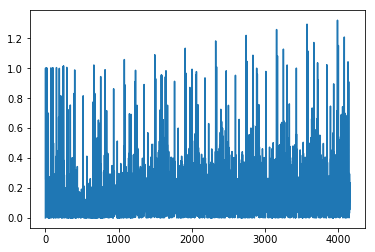

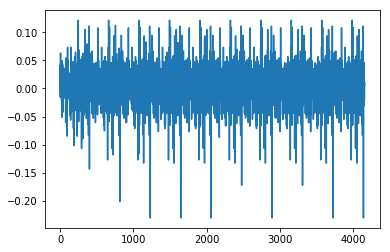

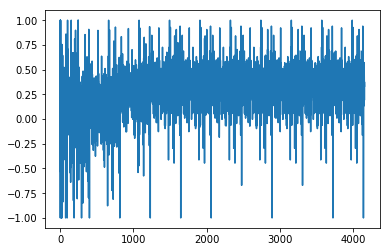

1.54159922491
[ 0.88888889  1.          1.          0.88888889  0.88888889  1.          1.
  0.88888889  1.          0.44444444  0.44444444  0.88888889  0.44444444
  0.44444444  0.88888889  1.          1.          0.88888889  0.44444444
  0.44444444  0.44444444  0.44444444  0.88888889  0.88888889  1.          1.
  1.          1.          0.66666667  1.          1.          0.88888889
  1.          0.44444444  1.          1.          0.88888889  1.
  0.44444444  0.44444444  0.88888889  1.          0.88888889  0.88888889
  1.          0.88888889  1.          0.88888889  1.          1.
  0.88888889  1.          1.          0.88888889  1.          0.88888889
  0.88888889  1.          1.        ]
Writing away results
1989-03-01 00:00:00


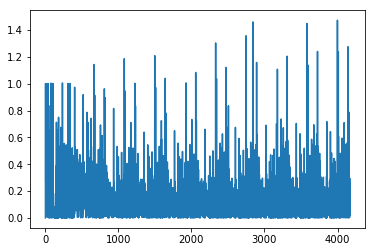

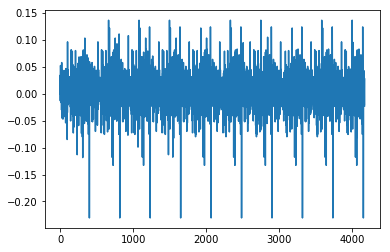

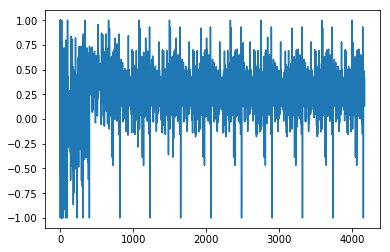

1.42711495337
[ 1.          0.88888889  1.          1.          0.88888889  0.55555556
  1.          0.88888889  0.88888889  0.55555556  0.33333333  0.88888889
  0.55555556  0.55555556  0.88888889  0.55555556  1.          0.33333333
  0.33333333  0.33333333  0.55555556  0.55555556  1.          0.88888889
  1.          1.          0.88888889  0.33333333  0.88888889  0.55555556
  1.          0.88888889  0.33333333  0.88888889  0.55555556  1.
  0.88888889  0.88888889  0.55555556  1.          0.88888889  0.55555556
  1.          0.88888889  1.          1.          1.          0.88888889
  0.88888889  1.          0.88888889  0.55555556  1.          0.88888889
  0.55555556  1.          0.88888889  0.88888889  0.88888889]
Writing away results
1989-04-01 00:00:00


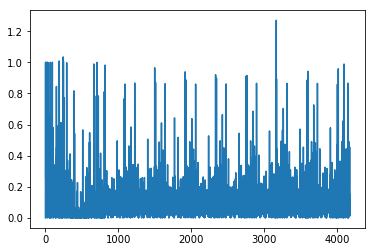

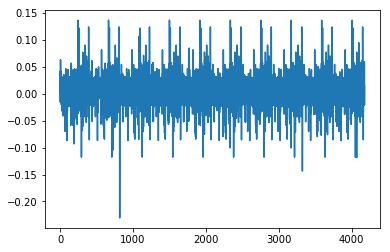

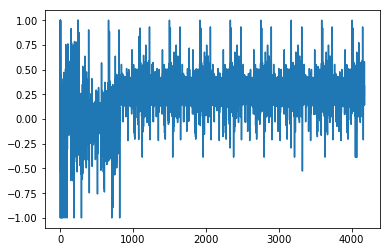

1.3176320497
[ 0.44444444  0.66666667  1.          0.44444444  0.44444444  1.
  0.44444444  0.33333333  0.66666667  1.          0.33333333  0.66666667
  1.          0.44444444  0.44444444  1.          0.33333333  0.33333333
  0.33333333  0.66666667  0.66666667  1.          0.44444444  0.44444444
  0.44444444  0.44444444  0.44444444  1.          0.44444444  1.
  0.44444444  0.33333333  0.66666667  0.44444444  1.          0.44444444
  0.33333333  0.66666667  1.          0.44444444  0.66666667  1.
  0.44444444  0.66666667  0.44444444  1.          0.44444444  0.44444444
  0.44444444  1.          0.44444444  1.          0.44444444  0.44444444
  1.          0.44444444  1.          0.44444444  1.        ]
Writing away results
1989-05-01 00:00:00


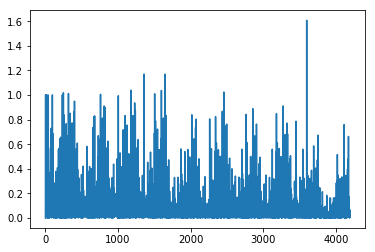

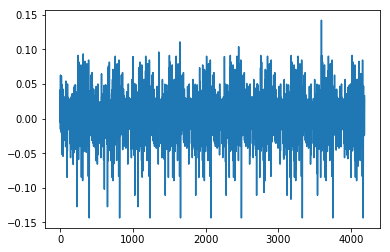

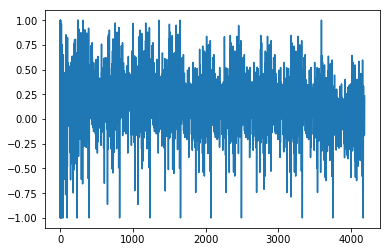

1.18970798972
[ 0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.44444444
  0.44444444  1.          0.44444444  0.44444444  1.          0.55555556
  1.          0.66666667  0.66666667  0.44444444  0.44444444  0.44444444
  1.          0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  1.          1.          0.66666667  0.66666667
  0.44444444  1.          0.66666667  0.66666667  0.44444444  0.44444444
  1.          0.66666667  1.          0.66666667  0.66666667  1.
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  1.          1.          0.66666667  1.          0.66666667  0.66666667
  0.44444444  1.          1.          0.66666667  0.44444444]
Writing away results
1989-06-01 00:00:00


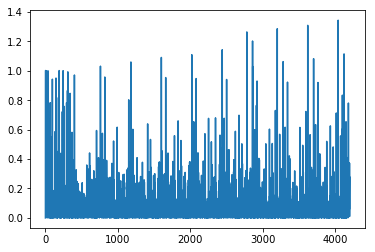

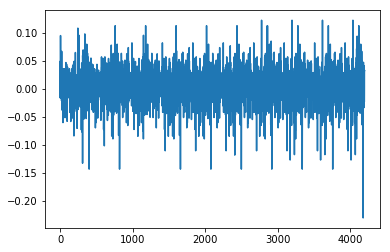

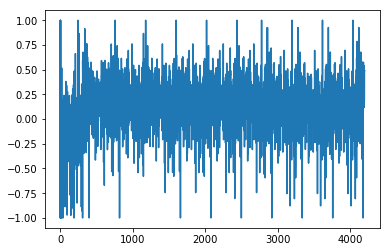

1.25853834214
[ 0.66666667  1.          1.          0.66666667  0.66666667  0.22222222
  1.          0.          0.22222222  0.22222222  0.          1.          1.
  0.66666667  0.66666667  0.22222222  0.22222222  1.          1.          1.
  1.          1.          0.66666667  0.66666667  0.66666667  1.          1.
  1.          0.66666667  0.66666667  1.          1.          1.
  0.66666667  0.22222222  0.22222222  0.          1.          1.          1.
  1.          1.          1.          1.          0.66666667  1.
  0.66666667  1.          1.          1.          1.          1.          1.
  0.66666667  1.          1.          0.          0.66666667  0.22222222]
Writing away results
1989-07-01 00:00:00


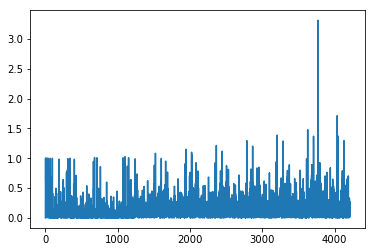

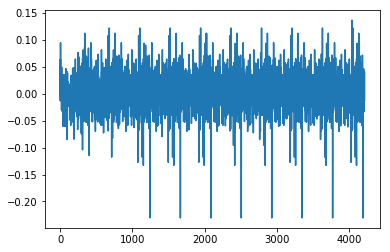

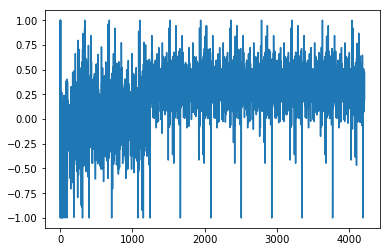

1.17605270855
[ 1.          1.          1.          0.66666667  0.66666667  0.66666667
  0.55555556  0.66666667  0.66666667  0.55555556  1.          1.
  0.55555556  0.66666667  0.66666667  0.66666667  0.66666667  1.          1.
  1.          1.          1.          1.          0.55555556  1.          1.
  0.55555556  1.          0.55555556  1.          1.          1.
  0.66666667  0.66666667  0.66666667  0.55555556  1.          1.
  0.55555556  1.          1.          1.          1.          1.          1.
  1.          1.          1.          0.55555556  1.          1.          1.
  1.          1.          1.          0.55555556  0.55555556  0.66666667
  0.66666667]
Writing away results
1989-08-01 00:00:00


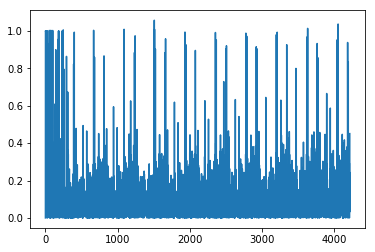

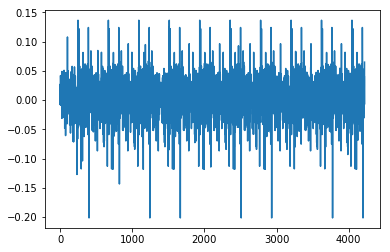

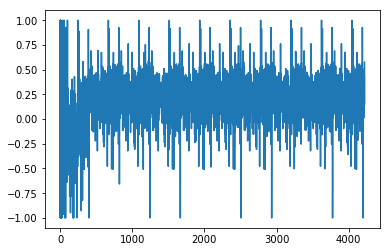

1.19160444087
[ 0.88888889  1.          0.88888889  0.33333333  0.66666667  1.
  0.33333333  0.66666667  1.          0.88888889  0.88888889  1.
  0.33333333  0.33333333  0.33333333  0.66666667  0.66666667  1.
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  1.
  0.88888889  1.          0.88888889  0.33333333  0.66666667  0.88888889
  1.          0.88888889  1.          0.66666667  1.          0.88888889
  0.          1.          0.88888889  0.66666667  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  1.          0.88888889  1.
  0.88888889  0.88888889  1.          0.88888889  1.          0.88888889
  1.          0.33333333  0.33333333  0.66666667  1.        ]
Writing away results
1989-09-01 00:00:00


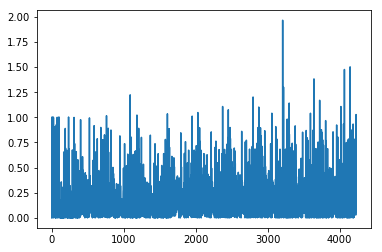

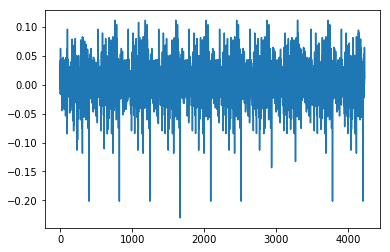

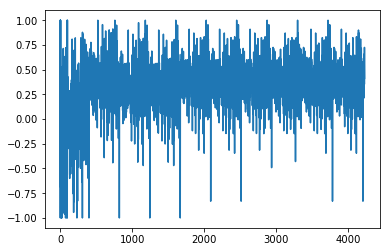

1.26877587483
[ 0.22222222  0.88888889  0.88888889  1.          0.22222222  0.88888889
  1.          0.66666667  0.88888889  0.66666667  0.22222222  0.22222222
  0.22222222  1.          1.          0.66666667  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.22222222  0.88888889  0.88888889
  0.66666667  0.88888889  0.22222222  0.88888889  0.66666667  0.22222222
  0.88888889  0.88888889  1.          0.22222222  0.88888889  0.66666667
  0.22222222  0.88888889  0.66666667  0.88888889  0.88888889  0.88888889
  0.88888889  0.66666667  0.88888889  0.66666667  0.66666667  0.88888889
  0.66666667  0.88888889  0.88888889  0.88888889  0.88888889  0.66666667
  0.22222222  1.          1.          0.22222222  0.88888889]
Writing away results
1989-10-01 00:00:00


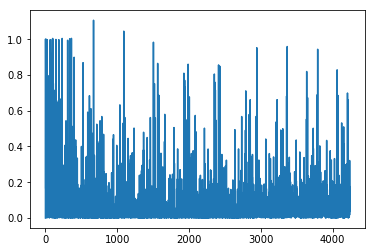

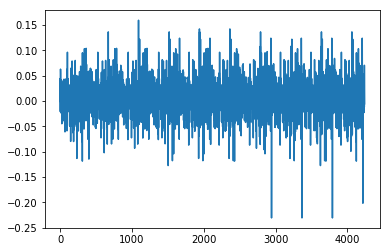

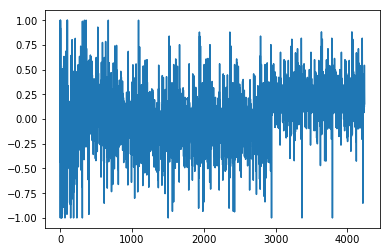

1.26711233283
[ 0.88888889  0.88888889  0.66666667  1.          0.88888889  0.66666667
  1.          0.88888889  0.44444444  1.          0.88888889  0.66666667
  0.66666667  0.66666667  1.          1.          0.88888889  1.          1.
  0.88888889  0.44444444  0.88888889  0.88888889  1.          0.88888889
  0.44444444  0.88888889  0.44444444  1.          0.88888889  0.66666667
  0.66666667  1.          0.88888889  0.44444444  1.          0.88888889
  1.          1.          1.          0.88888889  0.88888889  1.
  0.88888889  0.88888889  1.          0.88888889  0.44444444  1.
  0.88888889  0.88888889  0.88888889  1.          0.          0.88888889
  0.66666667  1.          0.88888889  0.44444444]
Writing away results
1989-11-01 00:00:00


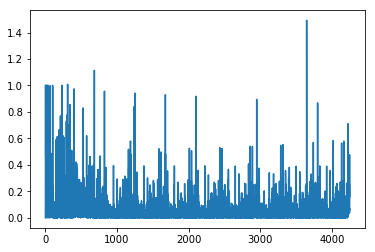

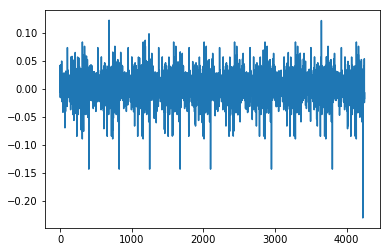

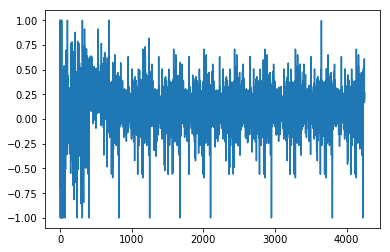

1.18832503235
[ 0.33333333  0.44444444  0.22222222  0.33333333  0.33333333  0.22222222
  0.66666667  0.44444444  0.22222222  0.22222222  0.33333333  0.33333333
  0.33333333  0.44444444  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.22222222  0.66666667  0.66666667  0.22222222  0.66666667
  0.22222222  0.66666667  0.44444444  0.66666667  0.66666667  0.33333333
  0.33333333  0.22222222  0.66666667  0.44444444  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.44444444
  0.66666667  0.44444444  0.22222222  0.66666667  0.44444444  0.66666667
  0.66666667  0.66666667  0.66666667  0.22222222  0.22222222  0.33333333
  0.33333333  0.22222222  0.33333333  0.44444444  0.44444444]
Writing away results
1989-12-01 00:00:00


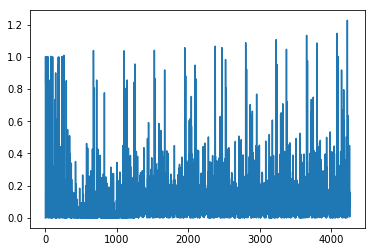

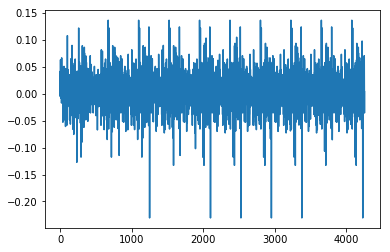

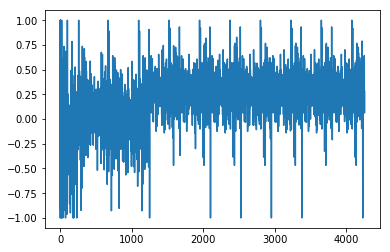

1.08673933783
[ 0.44444444  0.11111111  0.66666667  0.66666667  0.44444444  0.66666667
  0.44444444  1.          0.11111111  0.11111111  0.66666667  0.44444444
  0.44444444  1.          1.          1.          1.          1.
  0.11111111  1.          0.44444444  1.          1.          0.11111111
  0.66666667  0.44444444  1.          0.66666667  0.66666667  0.66666667
  0.11111111  0.66666667  0.44444444  1.          0.66666667  1.          1.
  1.          1.          1.          0.11111111  1.          0.44444444
  1.          1.          0.44444444  1.          0.11111111  1.
  0.66666667  1.          0.11111111  0.66666667  0.44444444  0.11111111
  0.66666667  0.44444444  1.          1.        ]
Writing away results
1990-01-01 00:00:00


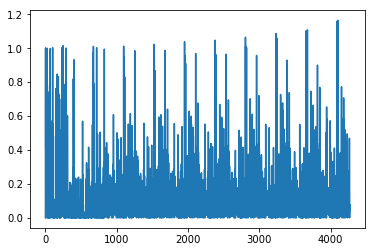

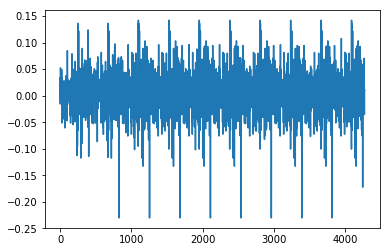

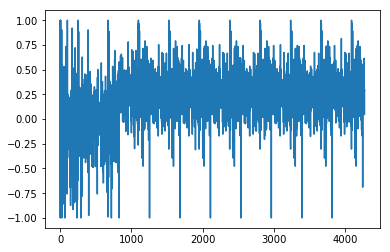

1.17785671823
[ 0.11111111  0.88888889  0.88888889  0.44444444  1.          0.44444444
  1.          0.11111111  0.88888889  0.88888889  0.44444444  0.44444444
  1.          1.          1.          1.          1.          0.11111111
  1.          0.44444444  0.44444444  1.          0.11111111  1.
  0.44444444  1.          1.          0.88888889  0.88888889  0.11111111
  1.          0.44444444  1.          1.          1.          1.          1.
  1.          1.          1.          1.          0.44444444  1.          1.
  0.44444444  1.          1.          1.          0.44444444  0.44444444
  0.11111111  0.88888889  0.44444444  0.11111111  0.88888889  0.44444444
  0.44444444  1.          0.11111111]
Writing away results
1990-02-01 00:00:00


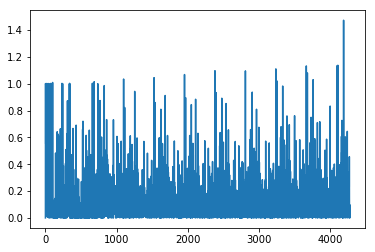

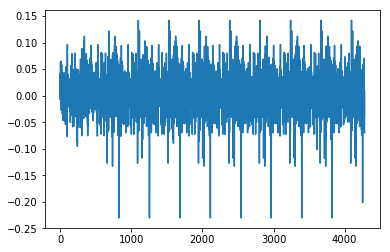

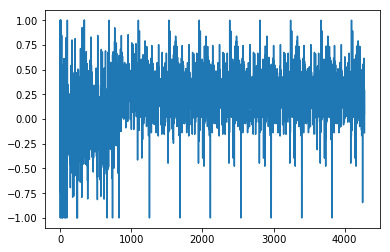

1.20003960197
[ 0.88888889  0.88888889  0.33333333  1.          1.          0.33333333
  0.88888889  0.88888889  0.88888889  0.          1.          1.          1.
  1.          1.          1.          0.33333333  0.88888889  1.          1.
  1.          0.33333333  1.          1.          1.          0.88888889
  0.88888889  0.88888889  0.33333333  0.88888889  1.          0.33333333
  0.88888889  1.          1.          1.          1.          1.          1.
  1.          1.          0.33333333  1.          1.          1.          1.
  0.88888889  1.          0.33333333  0.33333333  0.88888889  0.88888889
  0.33333333  0.88888889  1.          1.          1.          0.88888889
  0.88888889]
Writing away results
1990-03-01 00:00:00


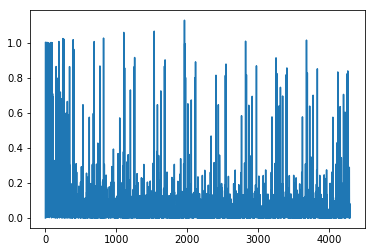

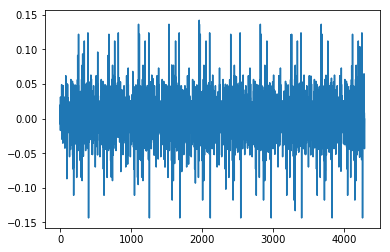

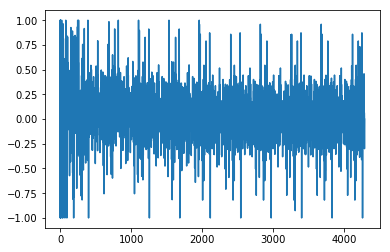

1.3651658065
[ 0.44444444  1.          0.66666667  1.          1.          0.33333333
  0.33333333  0.44444444  1.          1.          0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.33333333  0.66666667  0.44444444
  1.          0.66666667  0.33333333  0.66666667  1.          1.
  0.66666667  0.44444444  0.44444444  1.          0.66666667  1.          1.
  0.66666667  1.          0.66666667  0.66666667  0.66666667  0.66666667
  1.          0.66666667  0.66666667  1.          0.66666667  1.
  0.66666667  0.66666667  0.66666667  0.66666667  1.          0.33333333
  0.44444444  0.44444444  1.          0.44444444  0.44444444  1.
  0.66666667  0.33333333  0.44444444  0.44444444]
Writing away results
1990-04-01 00:00:00


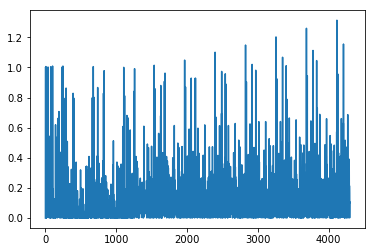

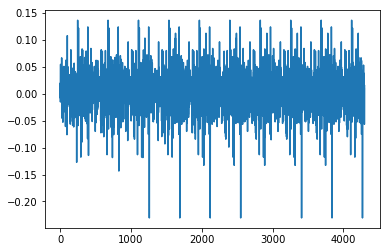

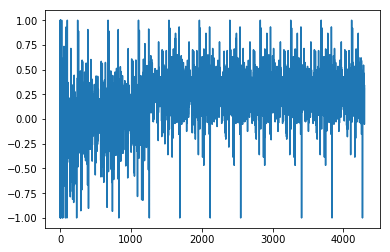

1.36269376022
[ 1.          0.88888889  1.          1.          0.22222222  0.22222222
  0.22222222  0.66666667  1.          1.          0.88888889  1.          1.
  0.88888889  0.22222222  0.88888889  0.88888889  1.          0.88888889
  0.22222222  0.88888889  1.          1.          0.88888889  0.88888889
  0.88888889  1.          0.88888889  1.          1.          0.88888889
  1.          1.          1.          0.88888889  0.88888889  1.
  0.88888889  0.88888889  1.          0.88888889  1.          1.
  0.88888889  0.88888889  0.88888889  1.          0.22222222  0.88888889
  0.66666667  0.22222222  0.88888889  0.66666667  1.          0.88888889
  0.22222222  0.22222222  0.88888889  1.        ]
Writing away results
1990-05-01 00:00:00


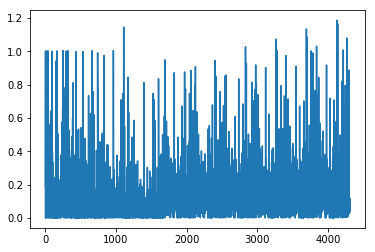

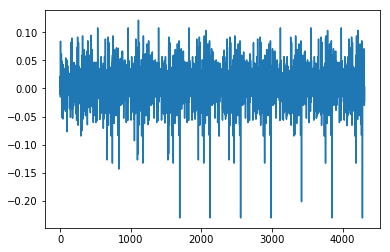

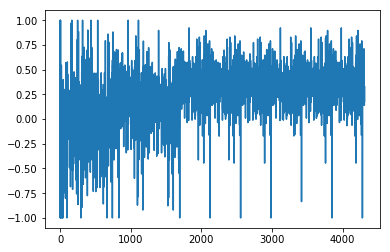

1.23977180691
[ 1.          0.22222222  0.66666667  0.44444444  0.44444444  0.44444444
  0.44444444  0.22222222  1.          1.          1.          1.          1.
  0.22222222  1.          1.          0.66666667  1.          0.44444444
  1.          0.22222222  0.66666667  1.          0.44444444  0.44444444
  0.66666667  1.          0.22222222  0.66666667  1.          1.          1.
  1.          1.          1.          0.22222222  1.          0.22222222
  0.66666667  1.          0.22222222  1.          1.          1.          1.
  0.66666667  0.66666667  0.44444444  0.44444444  0.66666667  1.
  0.22222222  0.22222222  1.          0.44444444  0.44444444  0.44444444
  0.22222222  1.        ]
Writing away results
1990-06-01 00:00:00


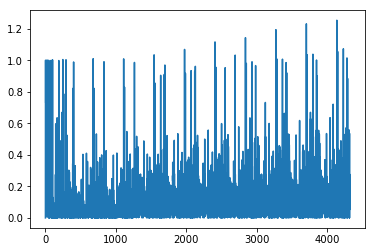

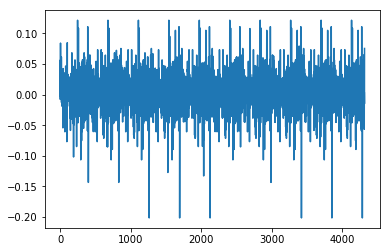

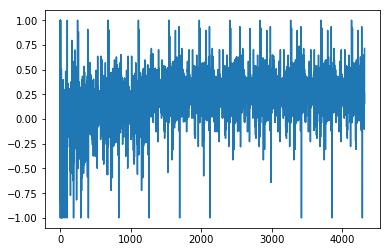

1.39385429062
[ 0.33333333  0.88888889  0.11111111  0.11111111  0.11111111  0.11111111
  0.88888889  0.88888889  0.66666667  0.88888889  0.66666667  0.66666667
  0.33333333  0.66666667  0.66666667  0.88888889  0.66666667  0.11111111
  0.66666667  0.33333333  0.88888889  0.66666667  0.11111111  0.11111111
  0.88888889  0.66666667  0.33333333  0.88888889  0.66666667  0.88888889
  0.66666667  0.88888889  0.66666667  0.66666667  0.88888889  0.66666667
  0.66666667  0.88888889  0.66666667  0.88888889  0.88888889  0.66666667
  0.66666667  0.66666667  0.88888889  0.11111111  0.11111111  0.11111111
  0.88888889  0.66666667  0.66666667  0.88888889  0.66666667  0.11111111
  0.11111111  0.66666667  0.88888889  0.88888889  0.88888889]
Writing away results
1990-07-01 00:00:00


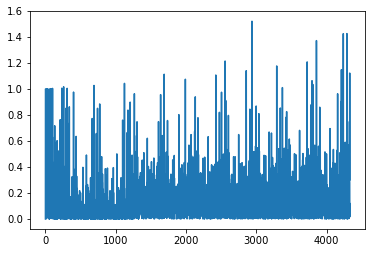

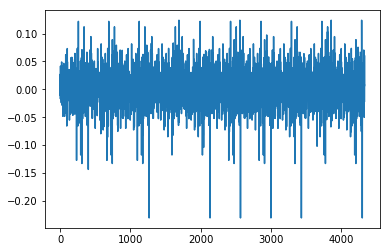

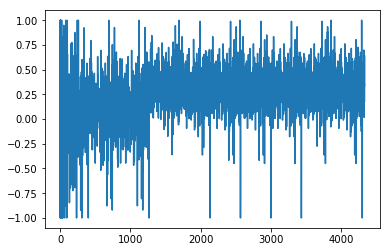

1.43222045159
[ 1.          0.11111111  0.44444444  0.44444444  0.44444444  1.          1.
  1.          1.          1.          0.66666667  0.11111111  0.66666667
  0.66666667  1.          0.66666667  0.44444444  0.66666667  1.          1.
  0.66666667  0.66666667  0.44444444  0.11111111  0.66666667  1.          1.
  0.66666667  1.          1.          1.          0.66666667  1.          1.
  0.66666667  1.          1.          0.66666667  1.          1.
  0.66666667  0.66666667  0.66666667  1.          0.11111111  0.66666667
  0.44444444  0.11111111  0.66666667  1.          1.          0.66666667
  0.44444444  0.44444444  0.44444444  1.          1.          1.          1.        ]
Writing away results
1990-08-01 00:00:00


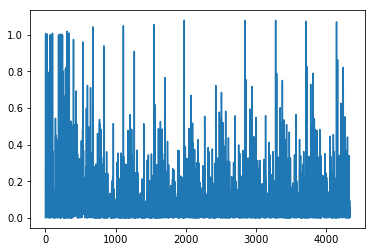

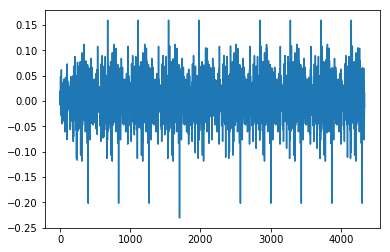

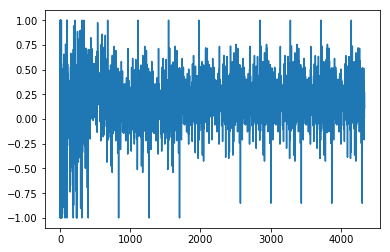

1.4616317478
[ 0.          1.          1.          1.          0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.          1.
  0.88888889  0.55555556  0.88888889  0.          0.88888889  0.88888889
  0.88888889  1.          1.          1.          0.          0.88888889
  0.88888889  0.55555556  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.          0.88888889  0.88888889  0.55555556
  0.88888889  0.88888889  0.88888889  0.88888889  1.          0.88888889
  0.          0.          1.          1.          0.          1.
  0.88888889  0.          0.88888889  1.          1.          1.
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889]
Writing away results
1990-09-01 00:00:00


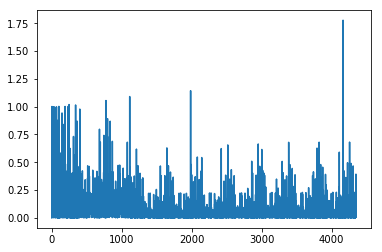

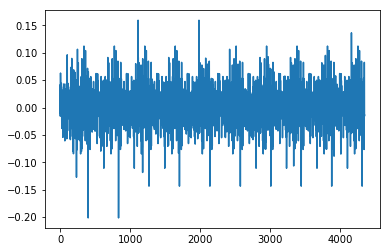

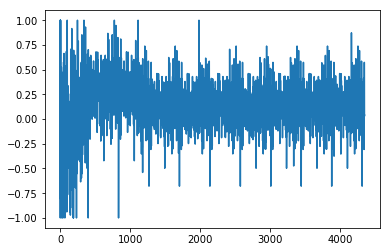

1.49116512894
[ 0.11111111  0.11111111  1.          1.          0.66666667  0.55555556
  0.66666667  0.66666667  0.55555556  0.11111111  0.55555556  0.55555556
  0.66666667  0.55555556  0.11111111  0.55555556  1.          0.66666667
  0.55555556  0.55555556  1.          0.66666667  0.55555556  1.
  0.66666667  0.55555556  0.66666667  0.66666667  0.66666667  0.55555556
  0.55555556  0.66666667  0.55555556  0.55555556  0.66666667  0.55555556
  1.          0.66666667  0.55555556  0.55555556  0.55555556  0.66666667
  0.11111111  0.55555556  1.          0.11111111  0.55555556  1.
  0.66666667  0.55555556  0.11111111  0.11111111  1.          1.
  0.66666667  0.66666667  0.55555556  0.66666667  0.66666667]
Writing away results
1990-10-01 00:00:00


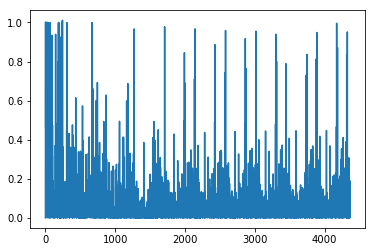

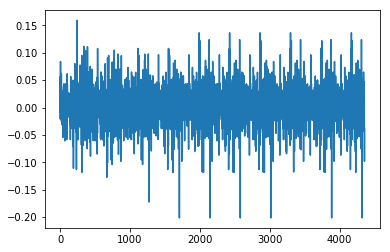

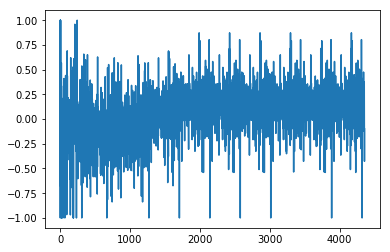

1.69663313784
[ 0.66666667  0.44444444  0.44444444  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  1.          0.88888889  0.88888889  1.
  0.88888889  0.66666667  0.88888889  0.44444444  0.88888889  0.88888889
  0.66666667  0.66666667  1.          0.88888889  0.44444444  1.
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.44444444  0.88888889  0.88888889  1.          0.88888889  0.44444444
  0.88888889  0.88888889  0.88888889  0.88888889  1.          1.
  0.66666667  0.66666667  1.          0.88888889  0.88888889  0.44444444
  0.88888889  0.66666667  0.66666667  0.66666667  0.44444444  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889]
Writing away results
1990-11-01 00:00:00


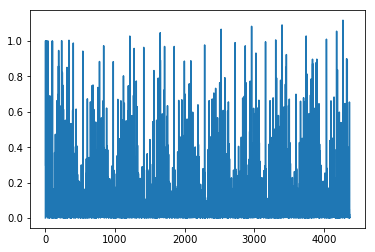

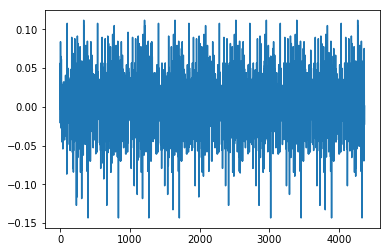

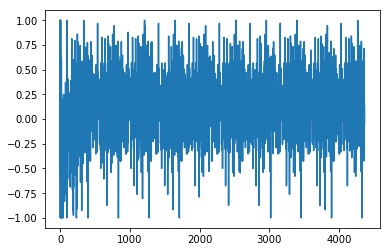

1.5336807382
[ 0.88888889  0.88888889  0.66666667  1.          0.66666667  0.66666667
  1.          0.66666667  1.          1.          0.66666667  1.
  0.33333333  1.          0.88888889  0.66666667  1.          1.          1.
  0.66666667  1.          0.88888889  0.66666667  1.          0.88888889
  0.88888889  0.66666667  1.          1.          0.66666667  1.          1.
  0.66666667  1.          0.88888889  0.66666667  1.          1.          1.
  0.66666667  0.66666667  1.          0.88888889  0.88888889  1.
  0.88888889  0.66666667  1.          0.33333333  0.33333333  1.
  0.88888889  0.88888889  0.66666667  1.          1.          1.
  0.66666667  1.        ]
Writing away results
1990-12-01 00:00:00


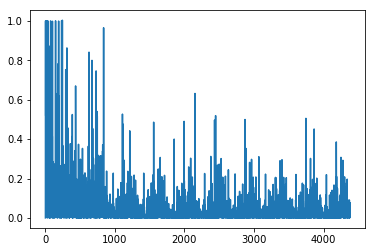

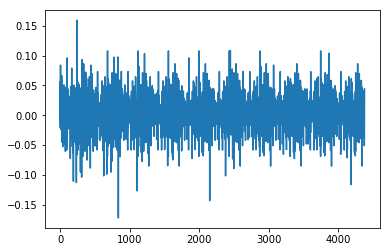

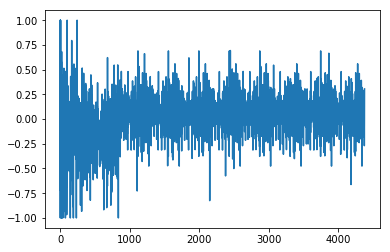

1.44570149678
[ 0.33333333  0.44444444  0.66666667  0.44444444  0.44444444  0.66666667
  0.44444444  0.66666667  0.33333333  0.44444444  0.66666667  0.33333333
  0.66666667  0.33333333  0.44444444  0.66666667  0.66666667  0.66666667
  0.44444444  0.66666667  0.33333333  0.44444444  0.66666667  0.33333333
  0.33333333  0.44444444  0.66666667  0.66666667  0.44444444  0.66666667
  0.33333333  0.44444444  0.66666667  0.33333333  0.44444444  0.66666667
  0.66666667  0.66666667  0.44444444  0.44444444  0.66666667  0.33333333
  0.44444444  0.66666667  0.33333333  0.44444444  0.44444444  0.66666667
  0.66666667  0.66666667  0.33333333  0.33333333  0.44444444  0.66666667
  0.33333333  0.44444444  0.44444444  0.44444444  0.44444444]
Writing away results
1991-01-01 00:00:00


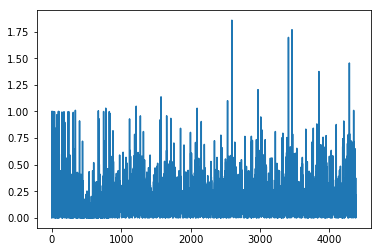

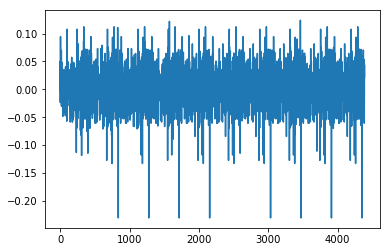

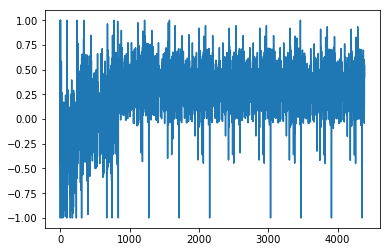

1.5922328437
[ 1.          1.          1.          1.          1.          0.55555556
  0.88888889  1.          0.55555556  1.          0.66666667  0.88888889
  1.          1.          1.          0.66666667  0.66666667  0.55555556
  1.          1.          0.55555556  1.          1.          1.          1.
  1.          1.          1.          1.          1.          0.55555556
  1.          1.          1.          1.          0.88888889  1.
  0.55555556  0.55555556  0.66666667  0.66666667  0.55555556  0.66666667
  1.          0.55555556  1.          0.66666667  0.66666667  0.66666667
  0.88888889  1.          1.          1.          1.          1.          1.
  1.          1.          1.        ]
Writing away results
1991-02-01 00:00:00


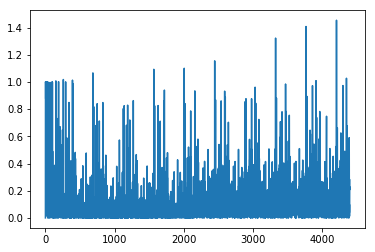

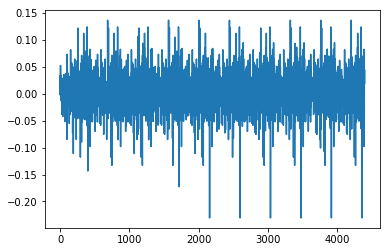

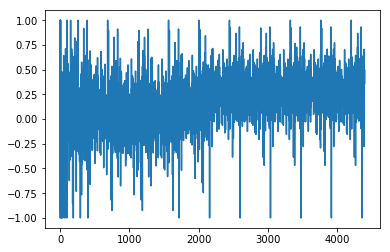

1.58556530281
[ 1.          1.          1.          0.66666667  0.44444444  0.66666667
  0.66666667  1.          0.66666667  0.44444444  0.66666667  1.          1.
  0.66666667  0.66666667  0.66666667  1.          0.66666667  1.          1.
  0.66666667  1.          1.          1.          0.66666667  1.          1.
  0.66666667  0.66666667  1.          0.66666667  1.          1.
  0.66666667  0.66666667  0.66666667  1.          0.44444444  0.66666667
  0.55555556  0.44444444  0.66666667  1.          1.          0.66666667
  0.66666667  0.66666667  0.66666667  1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.        ]
Writing away results
1991-03-01 00:00:00


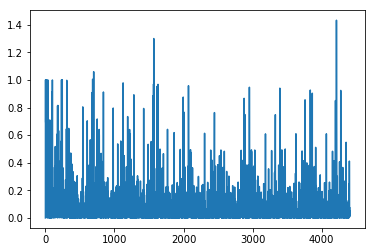

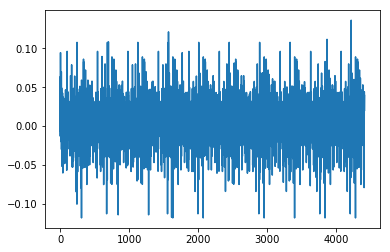

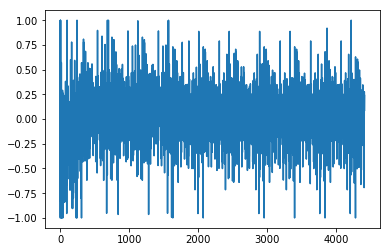

1.4112765767
[ 0.55555556  0.88888889  0.88888889  0.11111111  0.88888889  0.88888889
  0.55555556  0.88888889  0.66666667  0.88888889  0.55555556  0.55555556
  0.88888889  0.88888889  0.66666667  0.11111111  0.88888889  0.55555556
  0.55555556  0.88888889  0.55555556  0.55555556  0.88888889  0.88888889
  0.88888889  0.55555556  0.88888889  0.55555556  0.55555556  0.88888889
  0.55555556  0.88888889  0.88888889  0.88888889  0.88888889  0.11111111
  0.11111111  0.88888889  0.66666667  0.11111111  0.88888889  0.55555556
  0.55555556  0.88888889  0.66666667  0.66666667  0.66666667  0.55555556
  0.55555556  0.55555556  0.88888889  0.88888889  0.88888889  0.55555556
  0.88888889  0.88888889  0.88888889  0.55555556  0.55555556]
Writing away results
1991-04-01 00:00:00


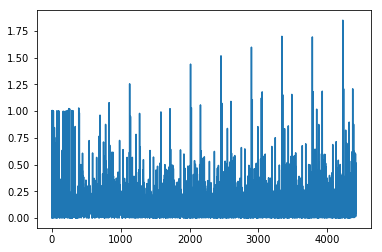

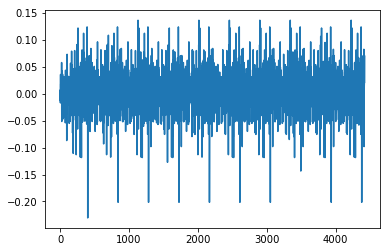

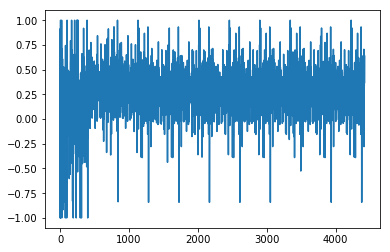

1.58133134046
[ 0.88888889  0.88888889  0.66666667  0.88888889  0.88888889  1.
  0.88888889  0.55555556  0.88888889  1.          1.          0.88888889
  0.88888889  0.55555556  1.          0.88888889  1.          1.
  0.88888889  1.          1.          1.          0.88888889  0.88888889
  1.          0.88888889  0.88888889  1.          0.88888889  1.          1.
  0.88888889  0.88888889  0.88888889  1.          0.66666667  0.88888889
  0.55555556  1.          0.88888889  0.88888889  1.          0.88888889
  0.55555556  0.55555556  0.55555556  1.          1.          1.
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  1.          0.88888889]
Writing away results
1991-05-01 00:00:00


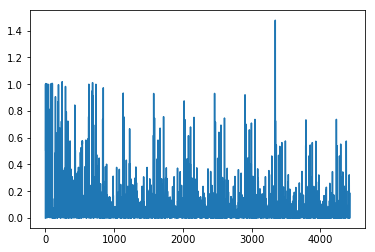

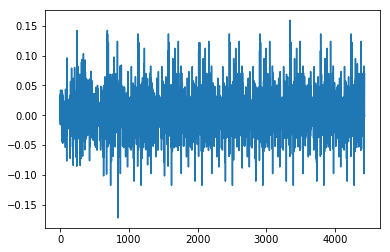

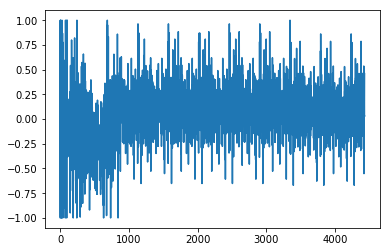

1.33128902997
[ 0.          0.          0.66666667  0.66666667  1.          0.          0.
  0.66666667  1.          1.          0.          0.66666667  0.66666667
  1.          0.66666667  1.          1.          0.          1.          1.
  1.          0.          0.          0.          0.66666667  0.          1.
  0.66666667  1.          1.          0.          0.66666667  0.66666667
  1.          0.          0.66666667  0.66666667  1.          0.66666667
  0.66666667  1.          0.          0.          0.66666667  0.66666667
  1.          1.          1.          0.          1.          1.          0.
  0.          0.          1.          0.          1.          0.          0.        ]
Writing away results
1991-06-01 00:00:00


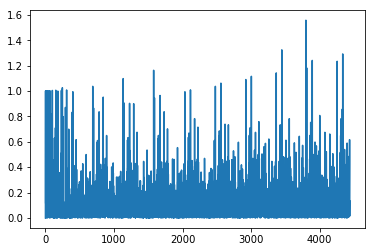

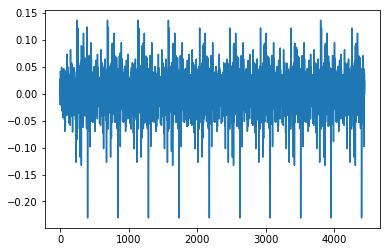

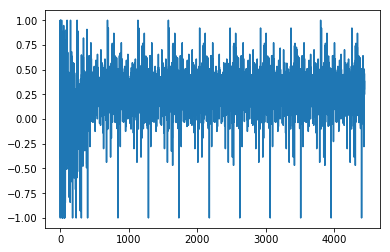

1.53004885918
[ 0.11111111  0.66666667  1.          1.          1.          0.11111111
  1.          1.          1.          0.66666667  0.66666667  0.66666667
  0.11111111  0.66666667  1.          1.          0.66666667  1.          1.
  1.          1.          1.          1.          0.66666667  1.          1.
  1.          1.          1.          1.          0.66666667  1.
  0.11111111  0.11111111  0.66666667  0.66666667  0.11111111  0.66666667
  1.          1.          1.          0.11111111  0.66666667  0.66666667
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.        ]
Writing away results
1991-07-01 00:00:00


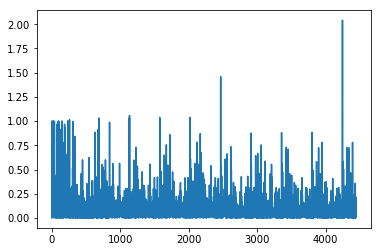

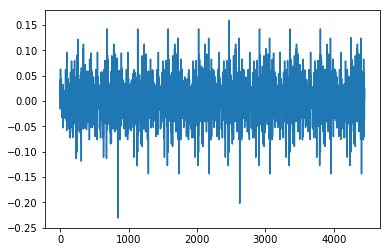

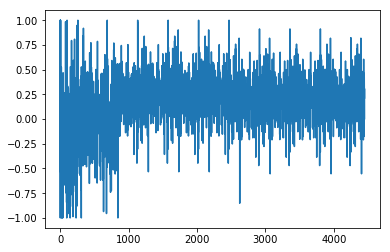

1.42176160361
[ 0.66666667  1.          1.          0.66666667  0.11111111  0.66666667
  1.          0.66666667  0.66666667  0.88888889  0.88888889  1.
  0.88888889  1.          0.66666667  0.88888889  1.          0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  1.
  0.66666667  0.66666667  1.          0.66666667  0.66666667  0.66666667
  1.          1.          0.11111111  0.88888889  1.          1.
  0.88888889  1.          1.          0.66666667  0.88888889  0.88888889
  0.88888889  1.          0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667]
Writing away results
1991-08-01 00:00:00


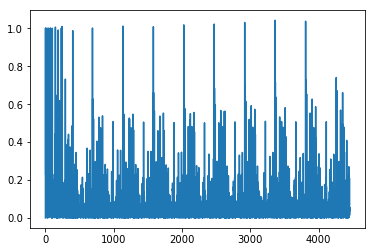

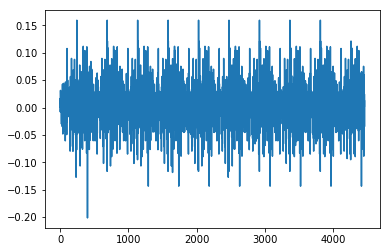

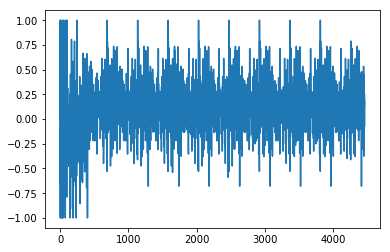

1.32767461473
[ 0.66666667  0.88888889  0.66666667  0.11111111  0.66666667  0.66666667
  0.66666667  0.66666667  1.          1.          0.88888889  0.66666667
  0.88888889  0.88888889  0.66666667  0.88888889  0.66666667  0.66666667
  0.66666667  0.66666667  0.11111111  0.66666667  0.66666667  0.88888889
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.88888889  0.11111111  1.          1.          0.88888889  1.
  0.66666667  0.88888889  0.66666667  1.          1.          1.
  0.88888889  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667]
Writing away results
1991-09-01 00:00:00


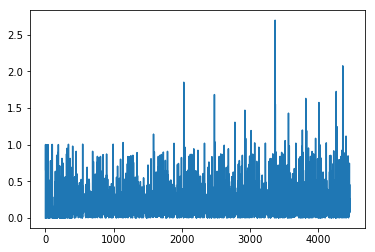

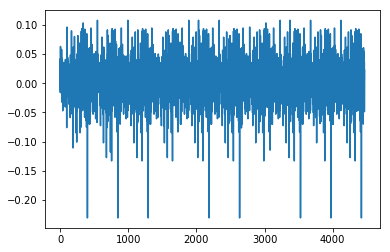

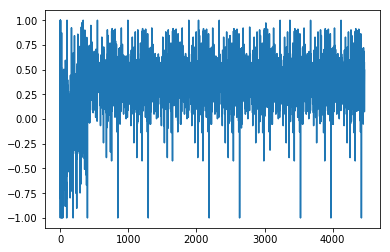

1.37317863586
[ 0.66666667  1.          0.11111111  1.          0.66666667  0.66666667
  1.          0.11111111  0.88888889  0.66666667  1.          0.66666667
  0.66666667  1.          0.66666667  1.          1.          1.          1.
  0.66666667  1.          1.          0.66666667  1.          0.66666667
  0.66666667  1.          1.          1.          0.66666667  0.11111111
  0.11111111  0.88888889  0.66666667  1.          0.88888889  0.66666667
  1.          0.11111111  0.11111111  0.88888889  0.66666667  1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          0.66666667  1.          1.          1.          1.
  0.66666667  0.11111111]
Writing away results
1991-10-01 00:00:00


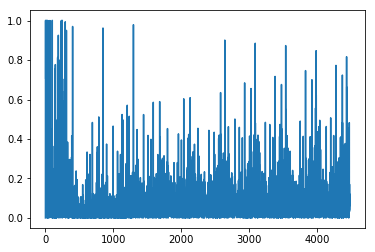

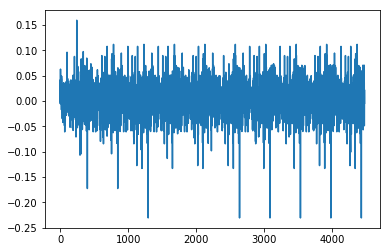

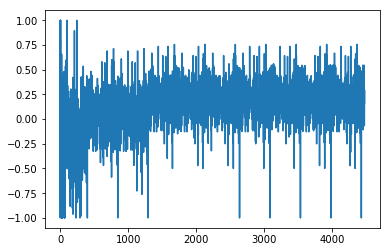

1.42766069036
[ 1.          0.22222222  1.          0.66666667  0.22222222  1.          1.
  0.66666667  0.22222222  1.          0.66666667  0.22222222  1.
  0.66666667  1.          1.          1.          1.          0.22222222
  1.          0.66666667  0.22222222  1.          0.66666667  1.          1.
  1.          1.          0.22222222  0.22222222  1.          0.66666667
  0.22222222  1.          0.66666667  0.22222222  1.          1.
  0.22222222  0.66666667  0.66666667  1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.
  0.22222222  1.          1.          1.          1.          0.22222222
  0.22222222  1.        ]
Writing away results
1991-11-01 00:00:00


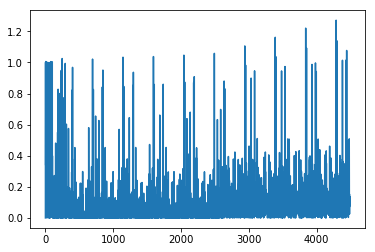

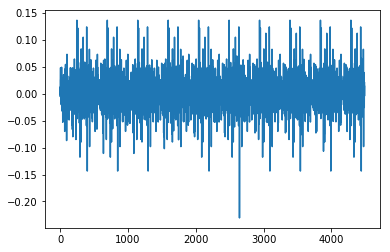

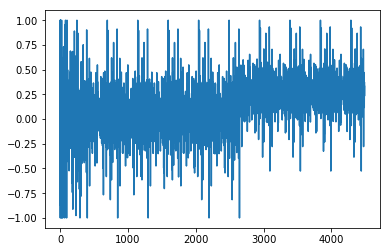

1.44685434092
[ 0.22222222  0.66666667  0.66666667  1.          0.66666667  0.22222222
  0.44444444  1.          0.66666667  1.          1.          0.66666667
  1.          0.66666667  0.66666667  0.66666667  0.66666667  0.22222222
  0.66666667  0.66666667  1.          0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  1.          0.22222222  0.22222222
  0.44444444  1.          0.66666667  0.44444444  1.          0.66666667
  0.22222222  0.22222222  0.44444444  1.          0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.22222222  0.44444444  0.44444444]
Writing away results
1991-12-01 00:00:00


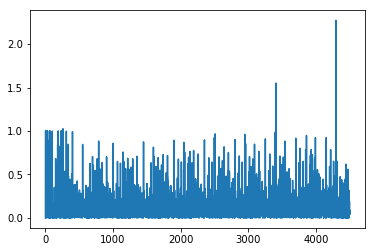

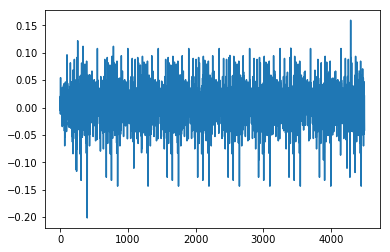

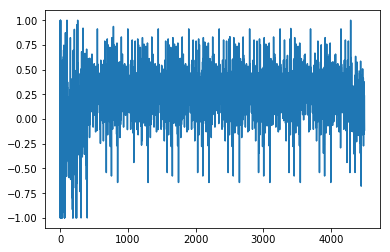

1.58522972753
[ 1.          0.55555556  0.66666667  1.          0.66666667  0.55555556
  0.66666667  1.          0.55555556  0.66666667  1.          0.55555556
  1.          0.66666667  1.          1.          0.66666667  1.          1.
  0.66666667  1.          0.55555556  0.66666667  1.          1.          1.
  0.66666667  0.66666667  1.          0.55555556  0.66666667  1.
  0.55555556  0.66666667  1.          0.11111111  0.66666667  0.55555556
  0.55555556  1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          0.66666667  1.          1.
  1.          1.          0.66666667  0.66666667  1.          0.55555556
  0.55555556]
Writing away results
1992-01-01 00:00:00


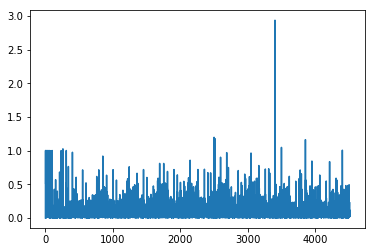

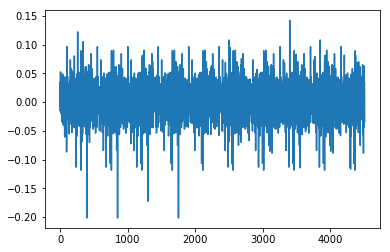

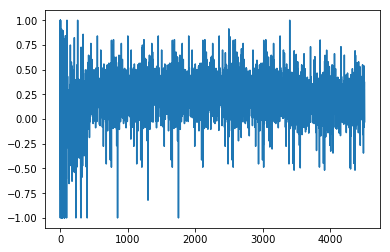

1.38906288362
[ 0.66666667  0.88888889  0.88888889  0.11111111  0.66666667  0.33333333
  0.88888889  0.66666667  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.11111111  0.88888889  0.66666667
  0.33333333  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.33333333  0.11111111  0.11111111  0.66666667  0.11111111
  0.88888889  0.66666667  0.33333333  0.88888889  0.11111111  0.11111111
  0.66666667  0.66666667  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.11111111  0.11111111  0.66666667  0.66666667  0.88888889]
Writing away results
1992-02-01 00:00:00


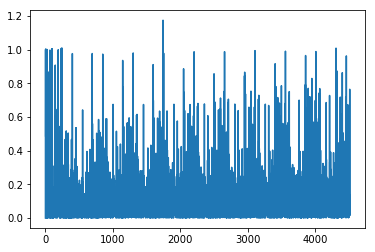

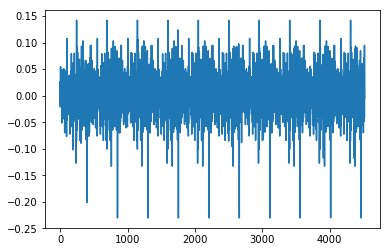

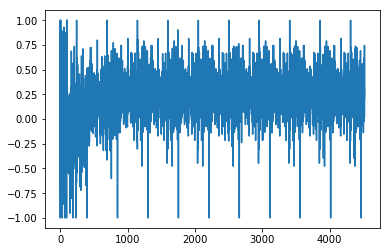

1.52479893768
[ 1.          1.          0.88888889  0.88888889  0.66666667  1.
  0.66666667  0.66666667  1.          0.66666667  1.          1.          1.
  1.          0.11111111  1.          1.          0.66666667  1.          1.
  1.          1.          1.          1.          0.66666667  0.11111111
  0.88888889  0.88888889  0.66666667  1.          1.          0.66666667
  1.          0.88888889  0.88888889  0.88888889  0.66666667  1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  0.11111111  0.88888889  0.66666667  0.66666667  1.          1.        ]
Writing away results
1992-03-01 00:00:00


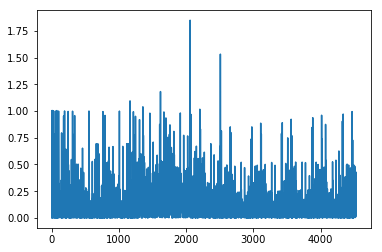

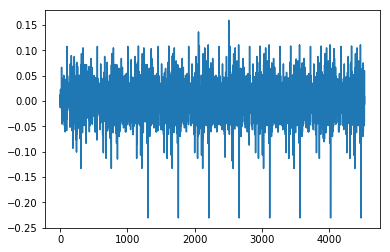

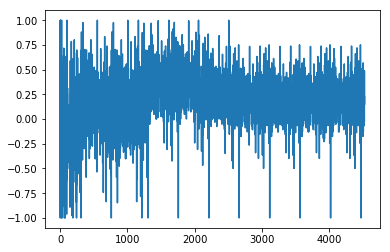

1.6687645422
[ 1.          1.          0.44444444  0.88888889  1.          0.88888889
  0.55555556  1.          0.88888889  0.88888889  1.          1.          1.
  0.88888889  1.          0.88888889  0.88888889  1.          0.88888889
  1.          1.          1.          1.          0.88888889  0.55555556
  0.44444444  0.44444444  0.55555556  1.          0.88888889  0.88888889
  1.          0.44444444  0.44444444  0.44444444  0.88888889  0.88888889
  1.          1.          1.          1.          1.          1.          1.
  1.          0.88888889  0.88888889  1.          1.          1.          1.
  0.88888889  0.44444444  1.          0.88888889  0.88888889  1.
  0.88888889  1.        ]
Writing away results
1992-04-01 00:00:00


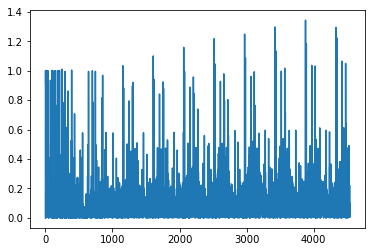

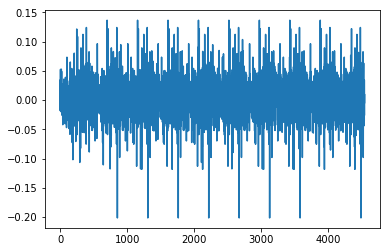

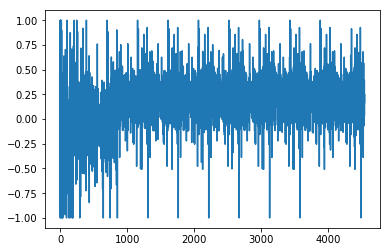

1.5200358061
[ 0.11111111  0.55555556  1.          0.88888889  1.          1.
  0.88888889  1.          0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  1.          0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  1.          0.11111111
  0.11111111  0.55555556  1.          0.88888889  0.55555556  1.
  0.88888889  0.11111111  0.11111111  0.55555556  1.          0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.11111111  0.11111111  0.55555556
  1.          0.88888889  0.88888889  0.88888889  0.88888889]
Writing away results
1992-05-01 00:00:00


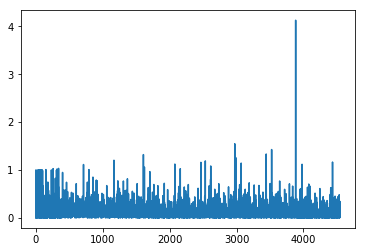

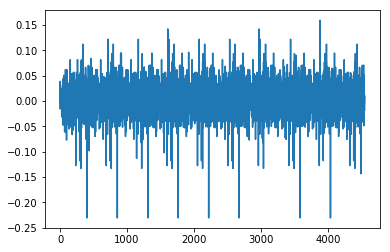

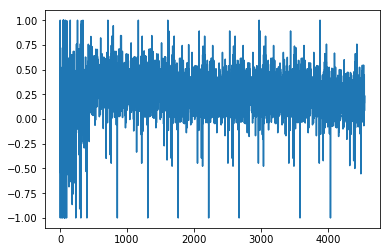

1.52834108839
[ 0.55555556  0.33333333  1.          1.          1.          1.          1.
  1.          1.          1.          1.          0.33333333  1.          1.
  0.33333333  1.          1.          1.          1.          1.          1.
  0.33333333  0.33333333  0.55555556  0.55555556  0.33333333  0.55555556
  1.          1.          1.          0.33333333  0.33333333  0.55555556
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          0.33333333  0.55555556  0.55555556
  1.          1.          1.          1.          1.          0.33333333]
Writing away results
1992-06-01 00:00:00


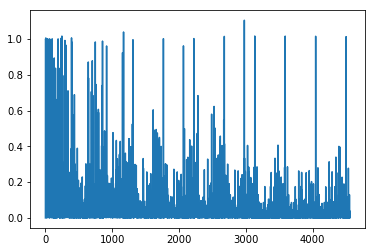

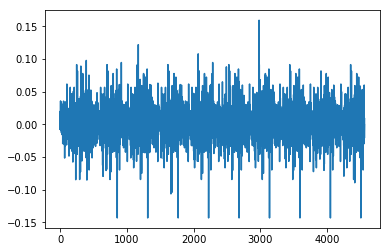

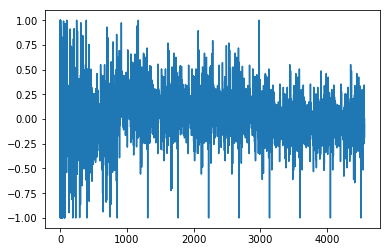

1.51418516155
[ 0.66666667  0.55555556  0.44444444  0.66666667  0.55555556  0.44444444
  0.66666667  0.66666667  0.55555556  0.66666667  0.44444444  0.55555556
  0.44444444  0.66666667  0.55555556  0.44444444  0.66666667  0.55555556
  0.55555556  0.55555556  0.44444444  0.55555556  0.55555556  0.11111111
  0.44444444  0.55555556  0.44444444  0.66666667  0.55555556  0.55555556
  0.11111111  0.55555556  0.44444444  0.66666667  0.66666667  0.66666667
  0.66666667  0.66666667  0.66666667  0.66666667  0.55555556  0.66666667
  0.44444444  0.66666667  0.55555556  0.66666667  0.55555556  0.44444444
  0.66666667  0.66666667  0.55555556  0.44444444  0.66666667  0.66666667
  0.44444444  0.66666667  0.55555556  0.66666667  0.55555556]
Writing away results
1992-07-01 00:00:00


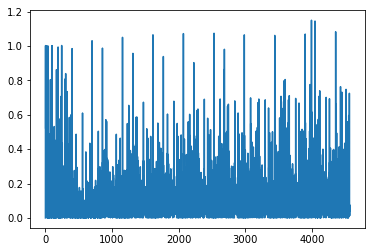

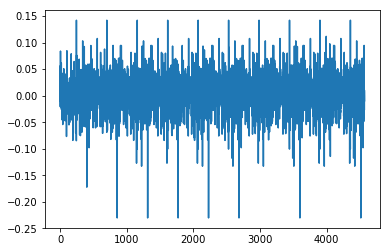

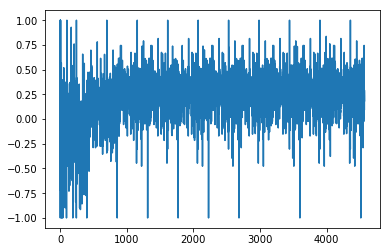

1.64944027485
[ 1.          0.33333333  1.          1.          1.          1.          1.
  1.          1.          0.33333333  1.          1.          0.33333333
  1.          0.33333333  1.          1.          1.          1.
  0.33333333  0.88888889  0.88888889  0.66666667  0.33333333  1.
  0.66666667  0.33333333  1.          0.88888889  0.88888889  0.66666667
  0.33333333  1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          0.88888889  0.88888889  0.66666667
  0.33333333  1.          1.          1.          1.          0.33333333
  1.          0.66666667]
Writing away results
1992-08-01 00:00:00


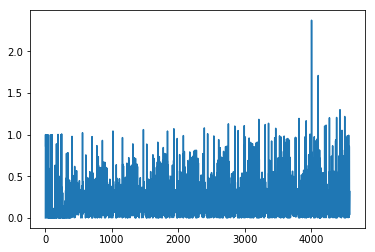

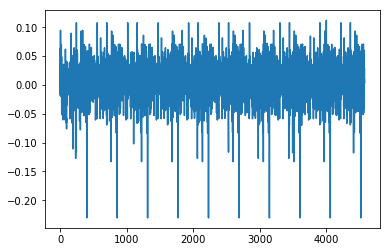

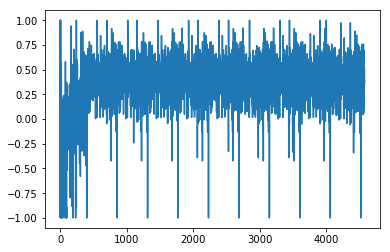

1.721488522
[ 0.33333333  0.44444444  1.          1.          1.          1.          1.
  1.          0.44444444  1.          0.33333333  0.44444444  1.
  0.33333333  1.          1.          1.          1.          0.44444444
  0.44444444  0.66666667  0.33333333  0.44444444  0.66666667  0.33333333
  0.44444444  1.          0.66666667  0.66666667  0.66666667  0.33333333
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          0.44444444  0.66666667  0.33333333  0.33333333
  1.          1.          1.          1.          0.44444444  1.
  0.33333333  1.        ]
Writing away results
1992-09-01 00:00:00


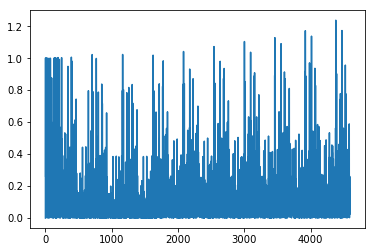

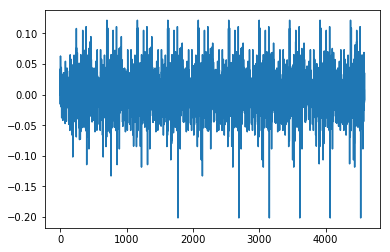

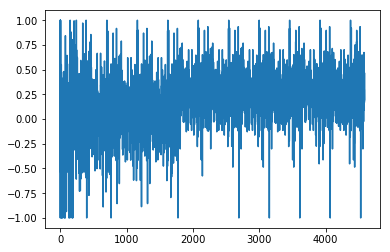

1.68475194053
[ 0.88888889  0.66666667  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.66666667  0.88888889  0.88888889
  0.88888889  0.88888889  0.55555556  0.66666667  0.88888889  0.88888889
  0.55555556  0.66666667  0.66666667  0.55555556  0.66666667  0.88888889
  0.88888889  0.88888889  0.66666667  0.66666667  0.66666667  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.55555556  0.66666667
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.55555556  0.66666667  0.88888889  0.88888889  0.88888889]
Writing away results
1992-10-01 00:00:00


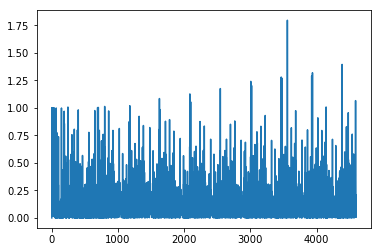

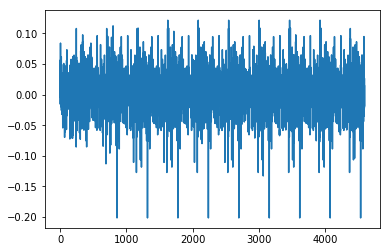

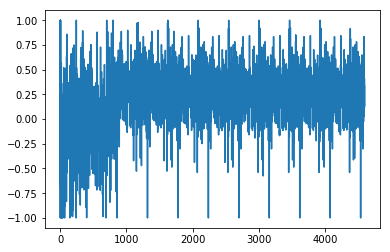

1.79702506968
[ 1.          0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  1.          0.33333333  0.88888889  0.33333333
  0.88888889  0.88888889  0.88888889  1.          0.33333333  0.66666667
  0.66666667  0.33333333  0.33333333  0.88888889  1.          0.33333333
  0.88888889  0.66666667  0.66666667  1.          0.33333333  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  0.88888889  0.88888889  0.66666667  0.66666667  1.
  0.33333333  0.88888889  0.88888889  0.88888889  0.88888889  0.88888889
  0.88888889  1.          0.88888889  0.88888889  0.88888889]
Writing away results
1992-11-01 00:00:00


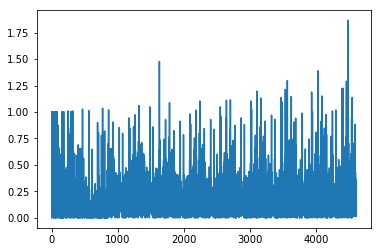

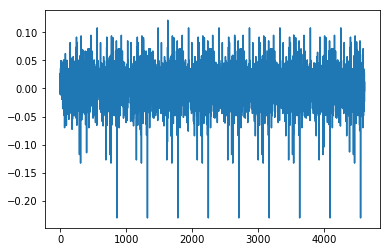

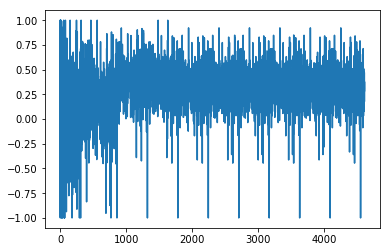

1.62161066216
[ 1.          1.          1.          1.          1.          0.66666667
  1.          1.          0.66666667  1.          1.          1.          1.
  1.          1.          0.66666667  0.          0.44444444  0.44444444
  0.66666667  0.44444444  1.          0.66666667  1.          0.44444444
  0.44444444  0.44444444  0.66666667  1.          1.          1.          1.
  1.          1.          1.          1.          1.          1.          1.
  1.          1.          1.          1.          1.          0.66666667
  0.44444444  0.44444444  0.66666667  1.          1.          1.          1.
  0.66666667  0.44444444  1.          1.          1.          1.          1.        ]
Writing away results
1992-12-01 00:00:00


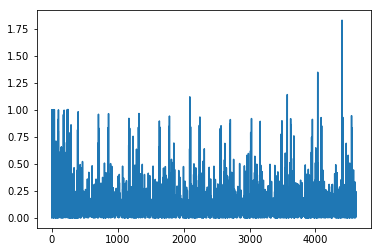

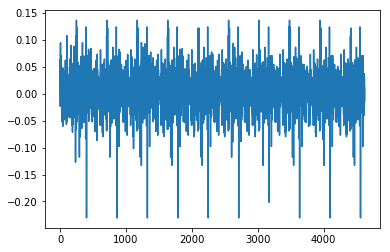

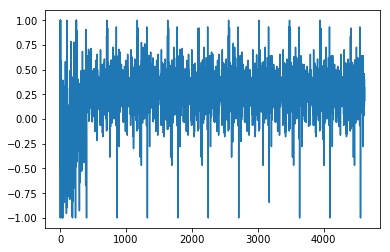

1.52231773985
[ 1.          1.          1.          1.          0.          1.          0.
  1.          1.          0.          1.          0.66666667  1.          0.
  1.          0.66666667  0.66666667  0.          0.          0.66666667
  0.          1.          1.          0.66666667  0.66666667  0.          1.
  1.          1.          1.          1.          1.          1.          1.
  0.          1.          0.          1.          1.          1.          1.
  1.          1.          0.66666667  0.66666667  0.          1.          1.
  0.          1.          0.          1.          0.66666667  0.          1.
  1.          1.          1.          0.        ]
Writing away results
1993-01-01 00:00:00


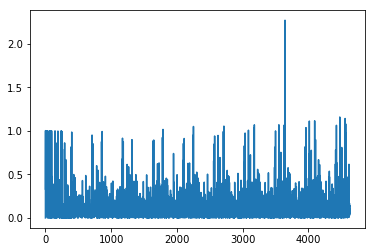

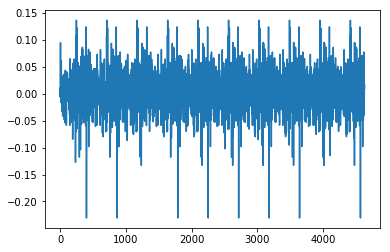

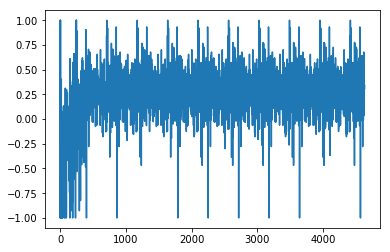

1.67345125463
[ 1.          1.          1.          1.          1.          0.55555556
  1.          1.          0.55555556  1.          1.          1.
  0.55555556  0.55555556  0.66666667  0.66666667  0.55555556  0.
  0.66666667  0.55555556  1.          1.          0.66666667  0.66666667
  0.55555556  0.55555556  1.          1.          1.          1.          1.
  1.          1.          1.          1.          0.55555556  1.          1.
  1.          1.          1.          1.          0.          0.66666667
  0.55555556  0.55555556  1.          1.          1.          0.55555556
  1.          0.66666667  0.55555556  1.          1.          1.          1.
  0.55555556  1.        ]
Writing away results
1993-02-01 00:00:00


KeyboardInterrupt: 

In [8]:
# initialize
init = tf.global_variables_initializer()
startepsilon = 0.8
endepsilon = 0.01
startlr = 0.8
endlr = 0.01
startgamma = 0.01
endgamma = 0.8
TWlist = []
Index = []
MWeights = []
Turnover = []
chooserlist = []
RU = []
learningrateQ = 0.01
n = 707
periods = 60
epochs = 10     # preferred to have a low amount of epochs because otherwise the the same data is used multiple times (usually not the case in stock returns)

# data parsing
dates = data['Date']
mdata = data[['r','xs','xb']]
mdata.index = pd.DatetimeIndex(dates)

# include the lags
for i in range(1,num_lags+1):  # 1 till 11
    mdata['r_lag' + str(i)] = mdata['r'].shift(i)
    mdata['xs_lag' + str(i)] = mdata['xs'].shift(i)
    mdata['xb_lag' + str(i)] = mdata['xb'].shift(i)

mdata.drop(mdata.head(num_lags).index, inplace=True)
# have a look at the data (if not include NANs)
# print(mdata)

# Train the the Q-function DNN
with tf.Session() as sess:
    for i in range(240,int(n-periods-1)):
        lostlist = []
        OptimalWeights = np.zeros(periods-1)
        currentK = 0
        print(mdata.index[i])
        rmin = -1
        rmax = 1
        sess.run(init) # initialize the Neural Network again
        epsilon = 0.15
        lr = 0.1
        gamma = 0.98
        currentEpoch = 0
        rlist = []  
        runitlist = []
        while currentEpoch < epochs:
            #Training of the Q-Network for the data available (with Neural Nets) 
            for j in indexes:
                indexes = np.asarray(range(i+currentK-1)) 
                s = mdata.iloc[j,:].values.reshape(1,num_inputvar)
                #Choose an action by greedily (with e chance of random action) from the Q-network
                a_int,allQ = sess.run([A_Max,output],feed_dict={NN_input:s})
                a = A[a_int]  # -1 because index
                if np.random.rand(1) < epsilon:
                    a = random.choice(A)

                #Get new state and reward from environment
                s1 = mdata.iloc[j+1,:].values.reshape(1,num_inputvar)
                r = (a*s1[0][1] + (1-a)*s1[0][2]) #reward: this is now the wealth gained from this step, but could be other rewards like utility
                rlist.append(r)
                Q = sess.run(output,feed_dict={NN_input:s1})
                    
                #Obtain maxQ' and set our target value for chosen action.
                Q1 = np.max(Q)
                targetQ = allQ
                if(len(rlist)>1):
                    rmin = np.min(rlist)
                    rmax = np.max(rlist)
                runit = -1 + 2*((r -rmin)/(rmax-rmin))
                targetQ[0,int(a*(num_actions-1))] = runit + gamma*Q1
                runitlist.append(runit)
                #Train the neural network using target and predicted Q values
                opt,W1,loss_ = sess.run([optmzr,w1,loss],feed_dict={NN_input:s,Q_Next:targetQ,learning_rate:lr})
                lostlist.append(loss_)
            currentEpoch += 1
                
        while currentK < periods - 1:
            # After training now calculate the optimal weights for the K=60 periods to come
            s = mdata.iloc[i+currentK,:].values.reshape(1,num_inputvar)
            a_int,allQ = sess.run([A_Max,output],feed_dict={NN_input:s})
            aOpt = A[a_int]
            OptimalWeights[currentK] = aOpt
            currentK += 1
            
        # For insight purposes (Write away)
        plt.ion()
        plt.plot(lostlist)
        plt.show()
        plt.plot(rlist)
        plt.show()
        plt.plot(runitlist)
        plt.show()
        
        firstdiff = OptimalWeights[1:] - OptimalWeights[:-1]
        MWeights.append(np.mean(OptimalWeights))
        TerminalWealth = np.exp(sum(OptimalWeights*mdata[i+1:i+currentK+1]['xs'] + (1-OptimalWeights)*mdata[i+1:i+currentK+1]['xb']))
        TWlist.append(TerminalWealth)
        Index.append(mdata.index[i])
        Turnover.append(sum(abs(firstdiff*np.exp(mdata[i+1:i+currentK]['xs'])) + abs((1-firstdiff)*np.exp(mdata[i+1:i+currentK]['xb']))))
        RU.append((1/(1-5))*pow(TerminalWealth,(1-5)))
        print(TerminalWealth)
        print(OptimalWeights)
        
        print('Writing away results')
        df = pd.DataFrame({'index date':Index,'TW':TWlist, 'Mean Weights Xs':MWeights,'Turnover':Turnover, 'Realized Utility':RU})
        df.to_excel('DNN_single.xlsx', sheet_name='sheet1', index=False)
print('Done!')
        